# Librairies

In [ ]:
# Basic librairies (all the librairies used for the machine learning are imported in the tools.py file)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Data importation
data = pd.read_sas("datas/construct_red.sas7bdat")
# Useful to plot the model 
index = data.set_index('TRIMESTRE').index.unique()

In [ ]:
from DreamLib.linear_models import *
from DreamLib.processing_datas import *
import datas.selected_columns_12 as cl

# Models Formulas


## Linear Regression
LinearRegression fits a linear model with coefficients $w = (w_1, ..., w_p)$ to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation. Mathematically it solves a problem of the form:

$$
\underset{\omega}{\text{min}}||X{\omega}-y||_{2}^{2}
$$

## Ridge Regression
Ridge regression addresses some of the problems of Ordinary Least Squares by imposing a penalty on the size of the coefficients. The ridge coefficients minimize a penalized residual sum of squares:
$$\min_{w} || X w - y||_2^2 + \alpha ||w||_2^2$$

The complexity parameter 
α
≥
0
 controls the amount of shrinkage: the larger the value of $\alpha>0$, the greater the amount of shrinkage and thus the coefficients become more robust to collinearity.

## Lasso
The Lasso is a linear model that estimates sparse coefficients. It is useful in some contexts due to its tendency to prefer solutions with fewer non-zero coefficients, effectively reducing the number of features upon which the given solution is dependent. For this reason, Lasso and its variants are fundamental to the field of compressed sensing. Under certain conditions, it can recover the exact set of non-zero coefficients.

Mathematically, it consists of a linear model with an added regularization term. The objective function to minimize is:

$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha ||w||_1}$$

## Elastic Net
ElasticNet is a linear regression model trained with both $\ell_1$ and $\ell_2$-norm regularization of the coefficients. This combination allows for learning a sparse model where few of the weights are non-zero like Lasso, while still maintaining the regularization properties of Ridge. We control the convex combination of $\ell_1$ and $\ell_2$ using the l1_ratio parameter.

Elastic-net is useful when there are multiple features that are correlated with one another. Lasso is likely to pick one of these at random, while elastic-net is likely to pick both.

A practical advantage of trading-off between Lasso and Ridge is that it allows Elastic-Net to inherit some of Ridge’s stability under rotation.

The objective function to minimize is in this case:
$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha \rho ||w||_1 +
\frac{\alpha(1-\rho)}{2} ||w||_2 ^ 2}$$

The class ElasticNetCV can be used to set the parameters alpha ($\alpha$) and l1_ratio ($\rho$) by cross-validation.

# Focus on Chronique CHR2

In [7]:
chronique=b'CHR2'
start = 1
norm = "MinMax"
split = 0.2
period = 12
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train,X_test], axis=1).index

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

### Correlation Features

In [8]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000229,5.228901e-08,0.000179,-0.520029
Ridge,0.000346,1.198072e-07,0.000309,-2.482767
KNeighborsRegressor,0.000364,1.324800e-07,0.000328,-2.851163
DecisionTreeRegressor,0.000443,1.965000e-07,0.000430,-4.712209
CatBoostRegressor,0.000444,1.969492e-07,0.000431,-4.725266
LinearRegression,0.000456,2.075972e-07,0.000423,-5.034802
LinearSVR,0.000475,2.256884e-07,0.000445,-5.560709


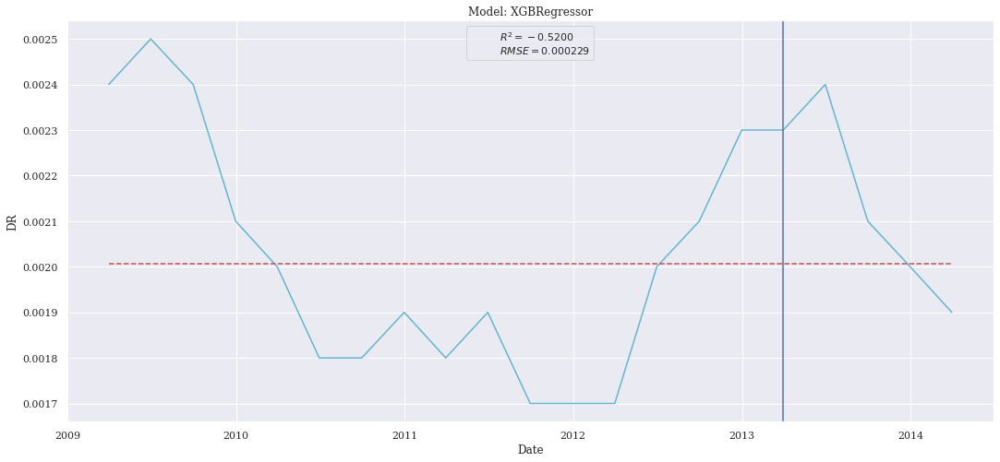

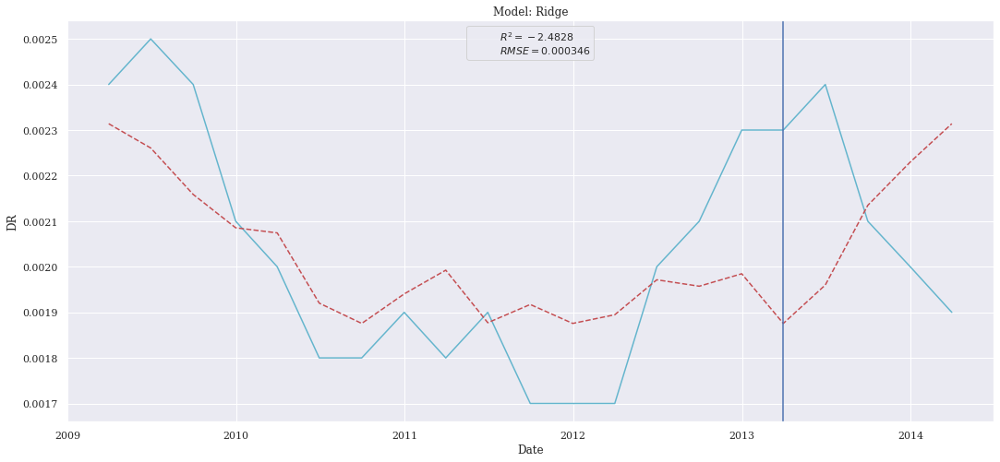

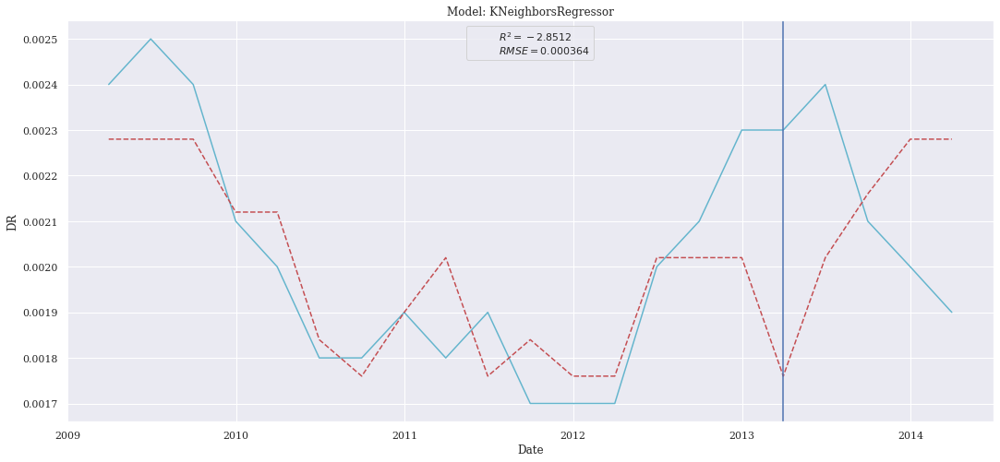

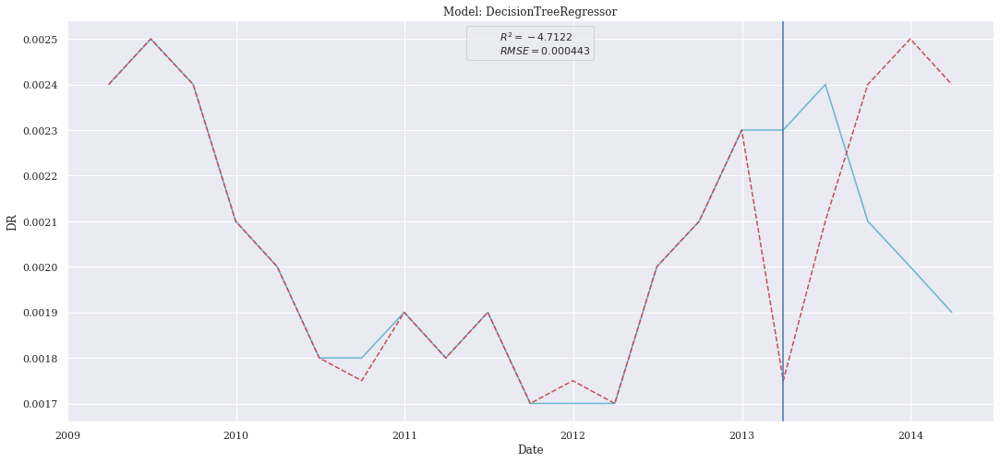

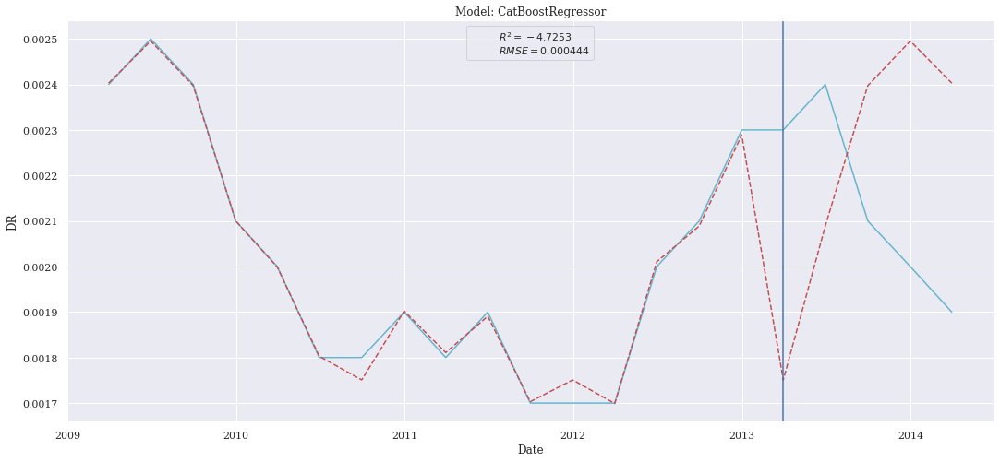

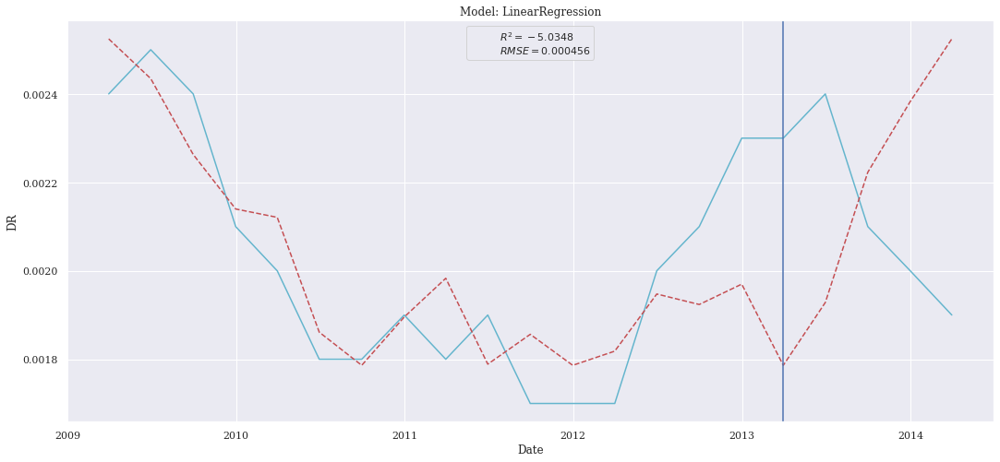

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


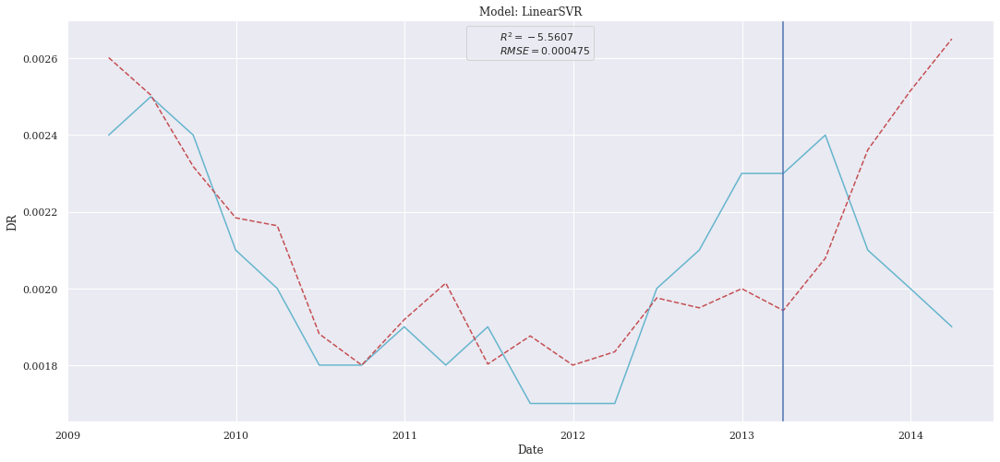

In [9]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [10]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period, chronique,col_used=cl.col_2_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.000203,4.121891e-08,0.000173,-0.198224
XGBRegressor,0.000229,5.228901e-08,0.000179,-0.520029
CatBoostRegressor,0.000240,5.773459e-08,0.000212,-0.678331
Ridge,0.000249,6.178773e-08,0.000220,-0.796155
KNeighborsRegressor,0.000260,6.744000e-08,0.000244,-0.960465
DecisionTreeRegressor,0.000440,1.940000e-07,0.000380,-4.639535
LinearSVR,0.000452,2.043061e-07,0.000418,-4.939132


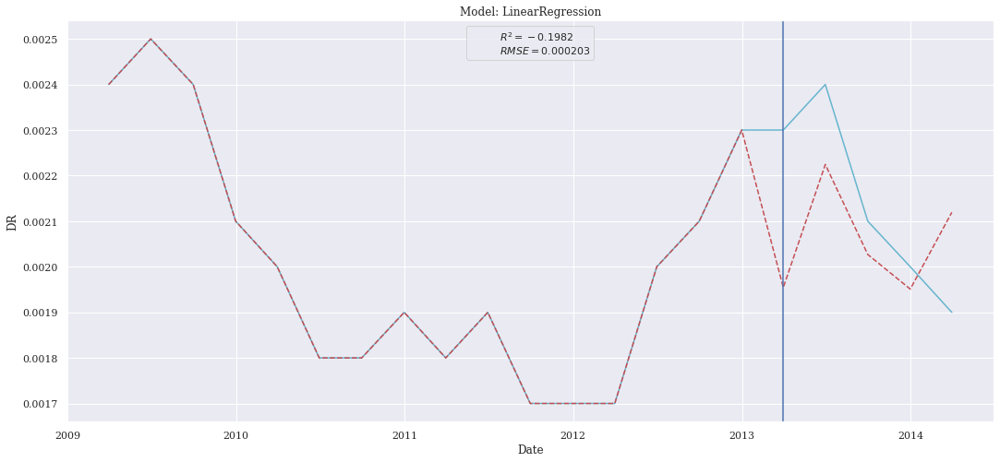

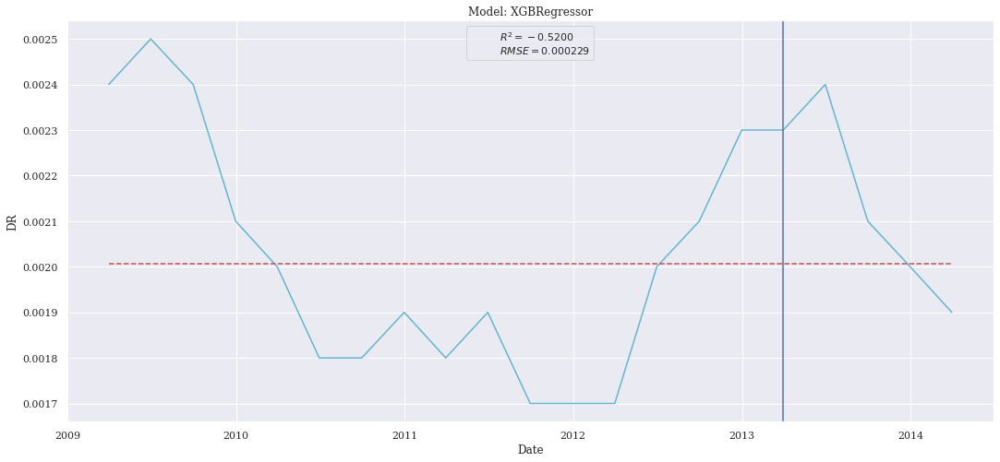

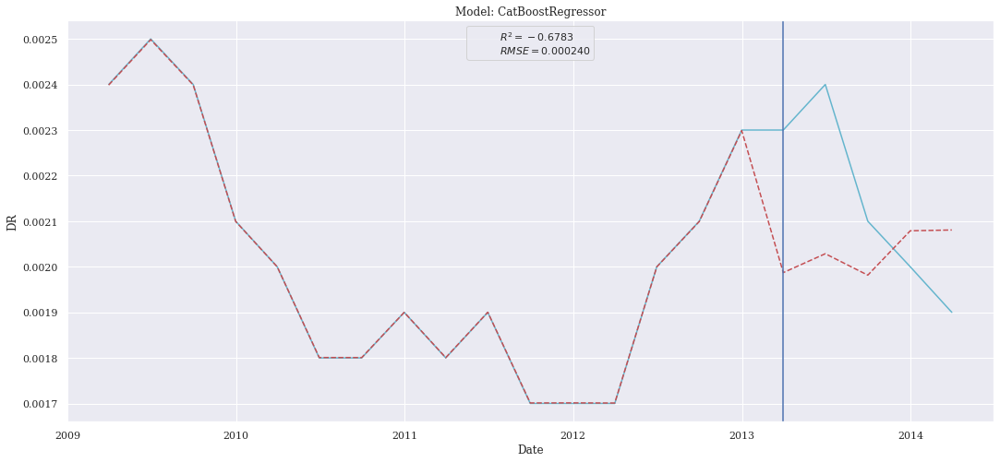

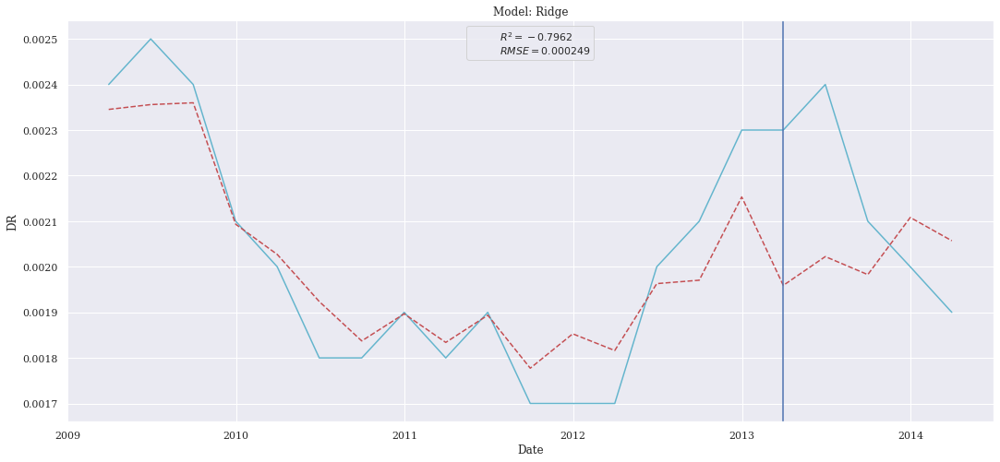

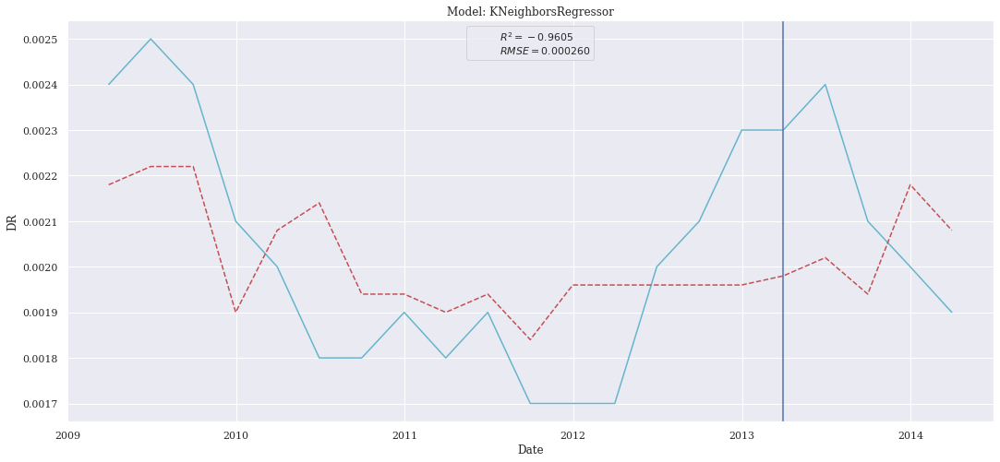

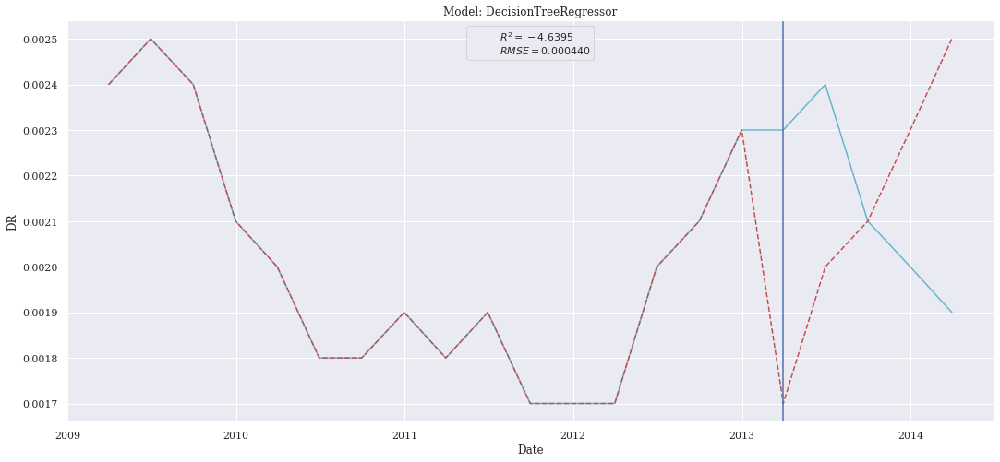

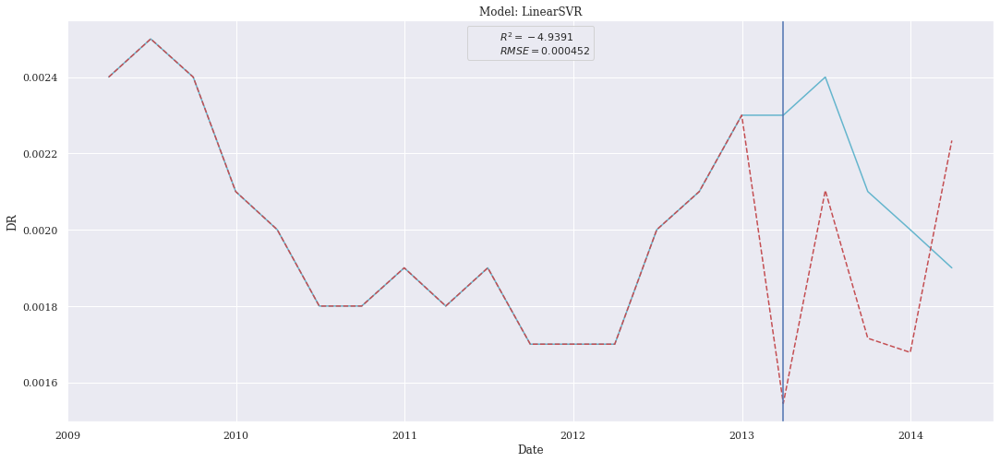

In [12]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [13]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period, chronique,col_used=cl.col_2_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000229,5.228901e-08,0.000179,-0.520029
CatBoostRegressor,0.000317,1.001972e-07,0.000281,-1.912708
DecisionTreeRegressor,0.000395,1.560000e-07,0.000360,-3.534884
KNeighborsRegressor,0.000421,1.768800e-07,0.000380,-4.141860
Ridge,0.000432,1.867975e-07,0.000388,-4.430160
LinearSVR,0.000579,3.356304e-07,0.000484,-8.756699
LinearRegression,0.000775,6.009312e-07,0.000655,-16.468931


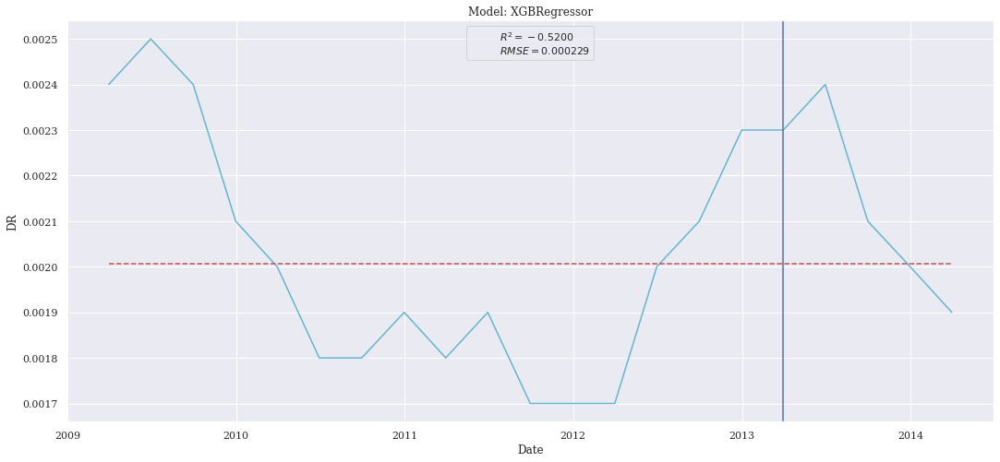

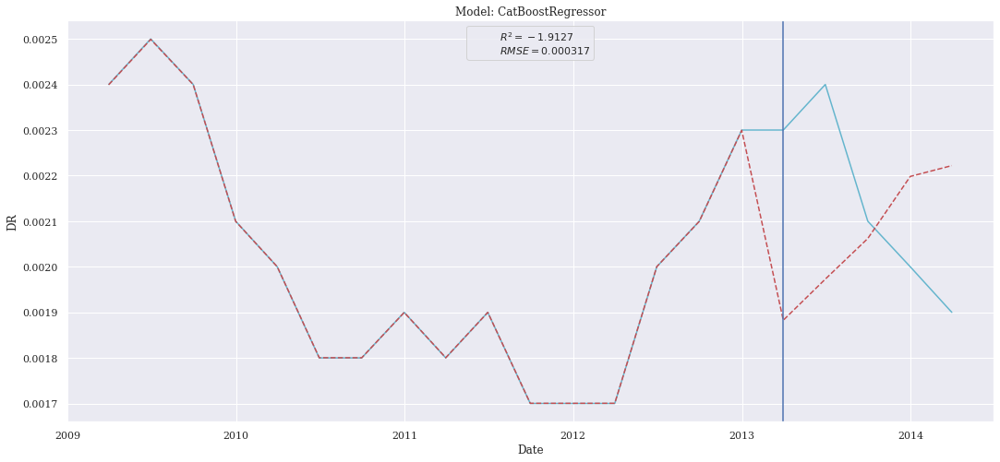

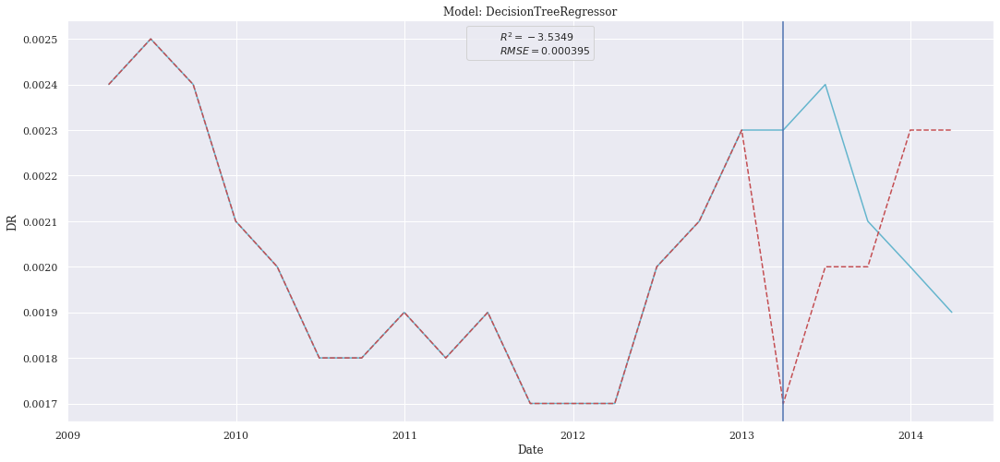

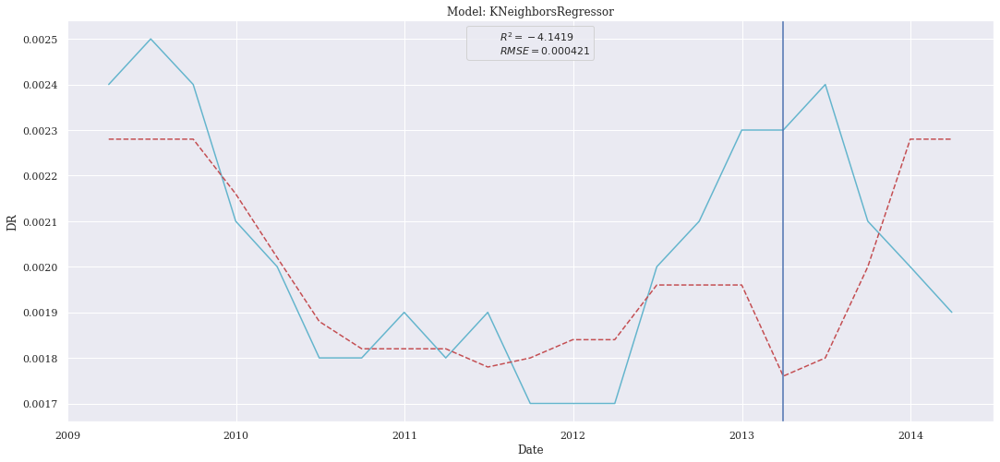

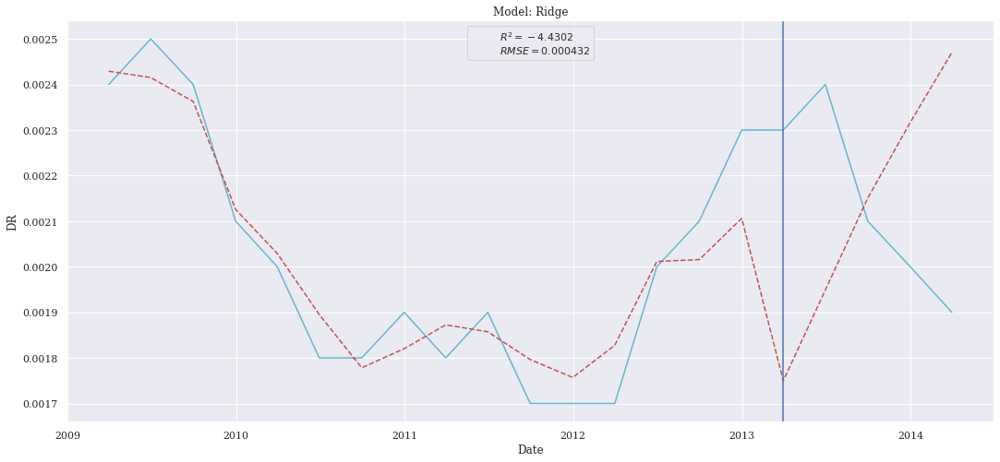

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


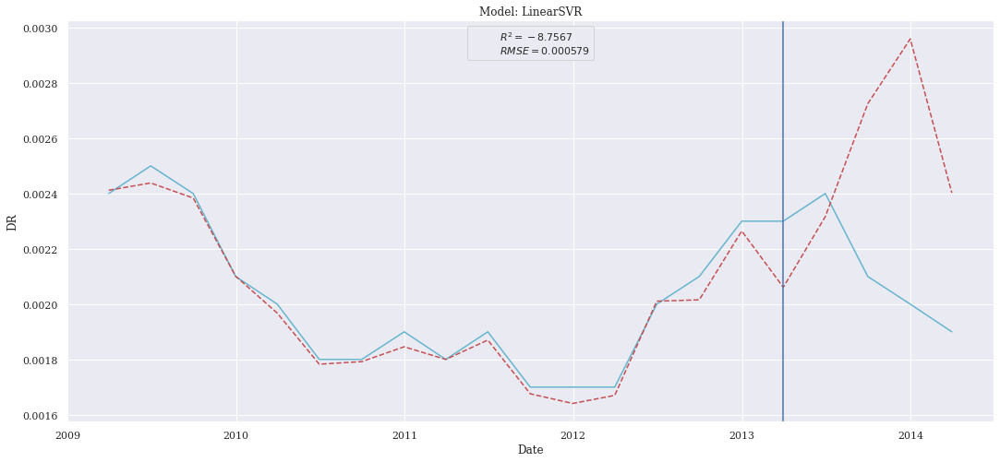

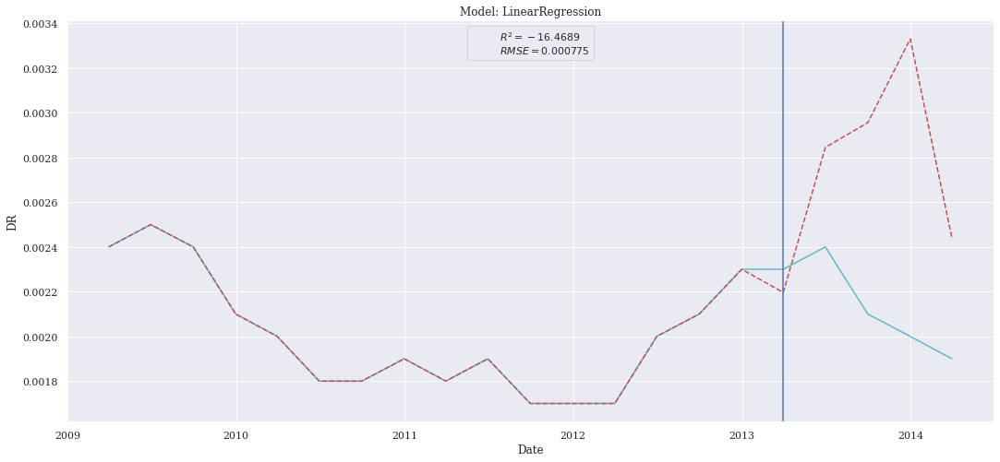

In [14]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [16]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_2_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000229,5.228901e-08,0.000179,-0.520029
Ridge,0.000258,6.636250e-08,0.000214,-0.929142
LinearRegression,0.000263,6.939566e-08,0.000219,-1.017316
CatBoostRegressor,0.000277,7.692654e-08,0.000250,-1.236237
DecisionTreeRegressor,0.000279,7.800000e-08,0.000180,-1.267442
KNeighborsRegressor,0.000332,1.100000e-07,0.000308,-2.197674
LinearSVR,0.000836,6.996612e-07,0.000687,-19.338988


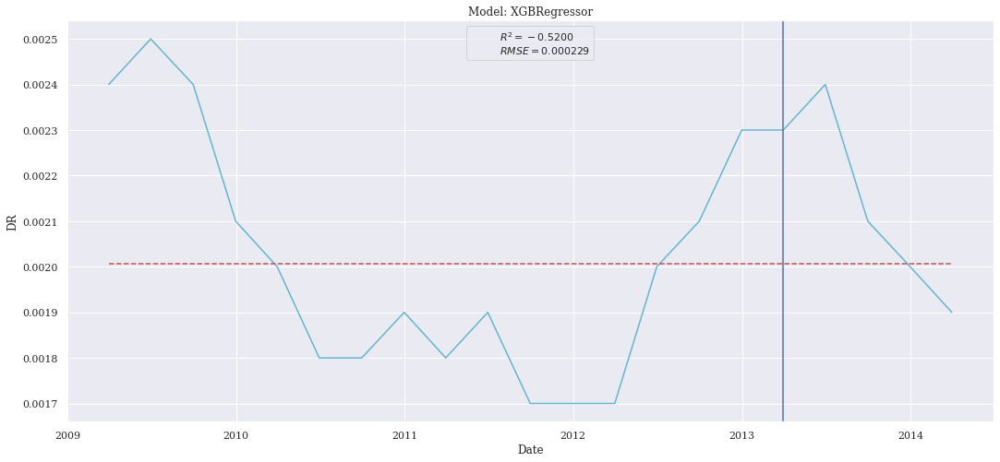

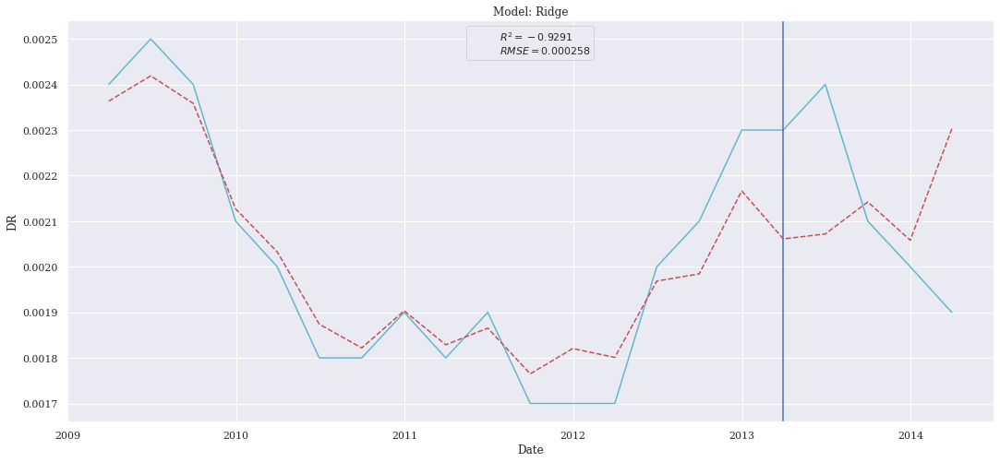

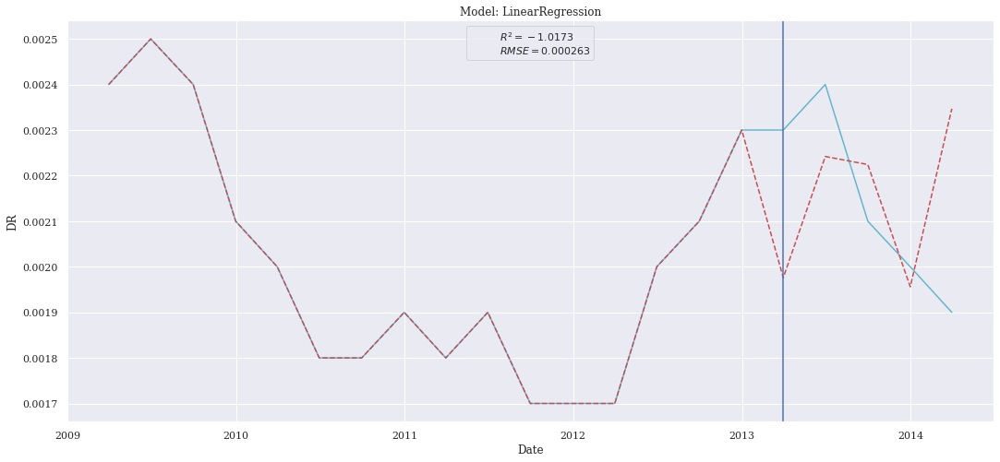

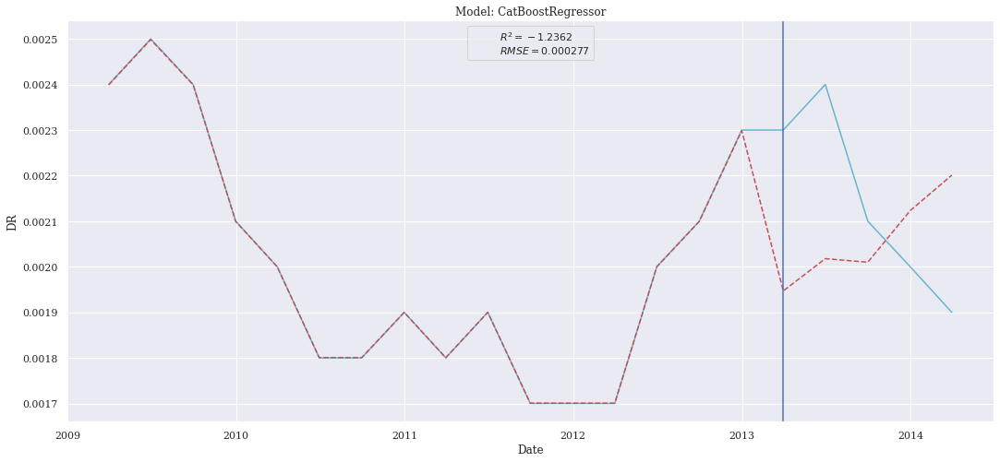

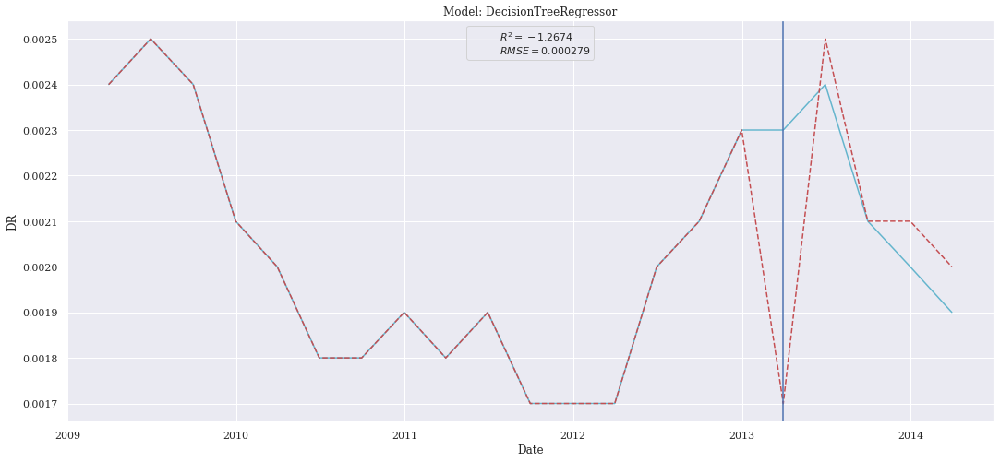

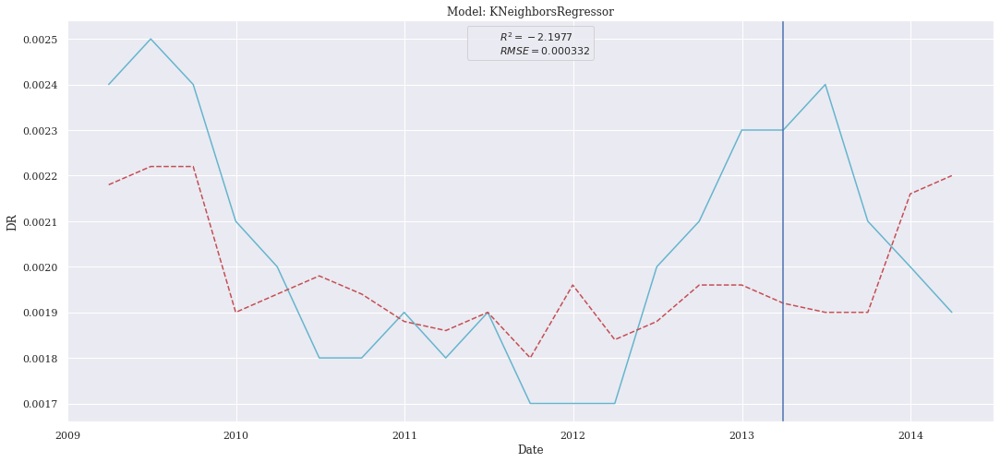

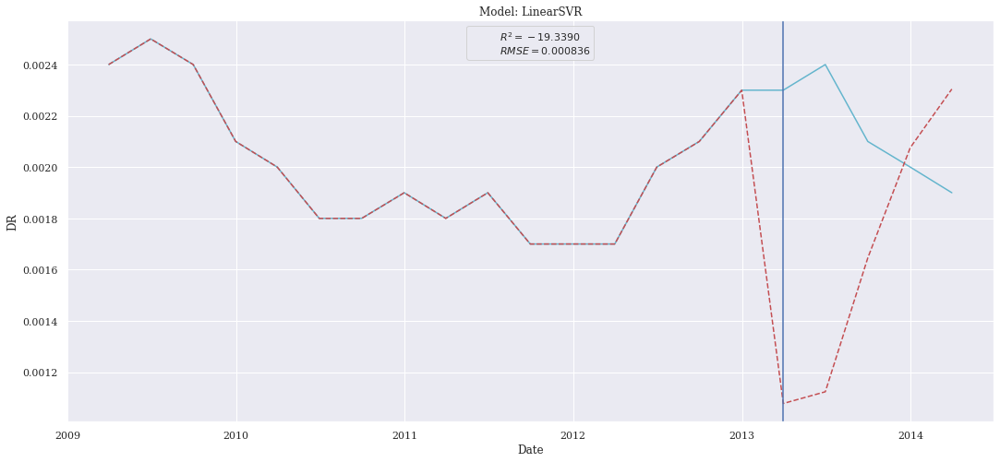

In [17]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [18]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period,chronique,col_used=cl.col_2_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000229,5.228901e-08,0.000179,-0.520029
KNeighborsRegressor,0.000272,7.400000e-08,0.000252,-1.151163
CatBoostRegressor,0.000278,7.724633e-08,0.000268,-1.245533
Ridge,0.000292,8.533741e-08,0.000273,-1.480739
DecisionTreeRegressor,0.000465,2.160000e-07,0.000440,-5.279070
LinearSVR,0.000543,2.950615e-07,0.000422,-7.577368
LinearRegression,0.001114,1.239997e-06,0.000921,-35.046435


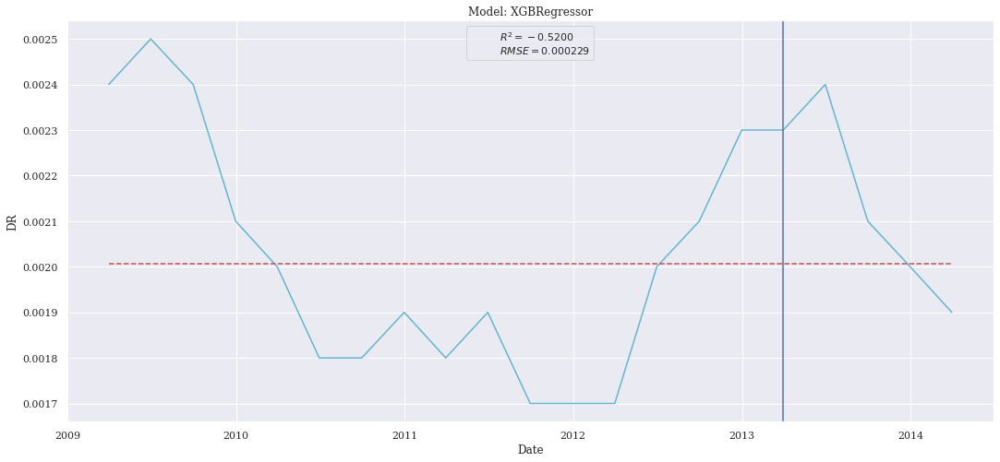

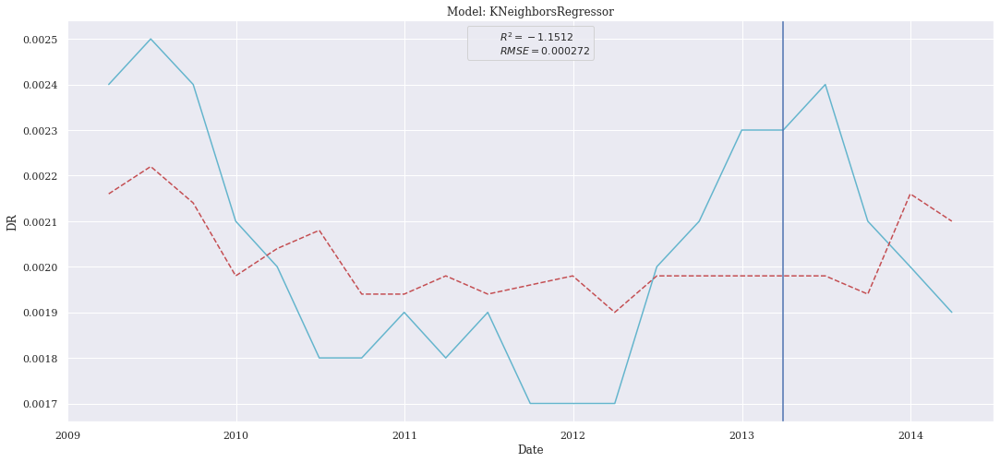

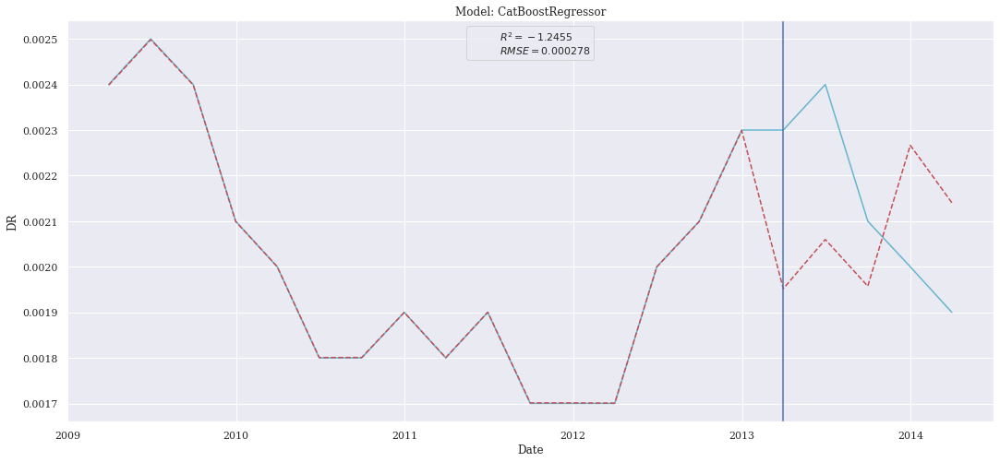

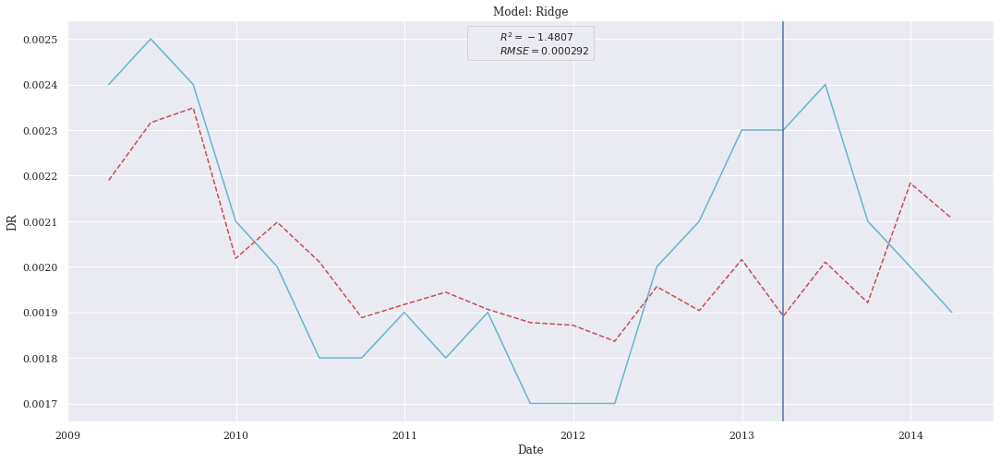

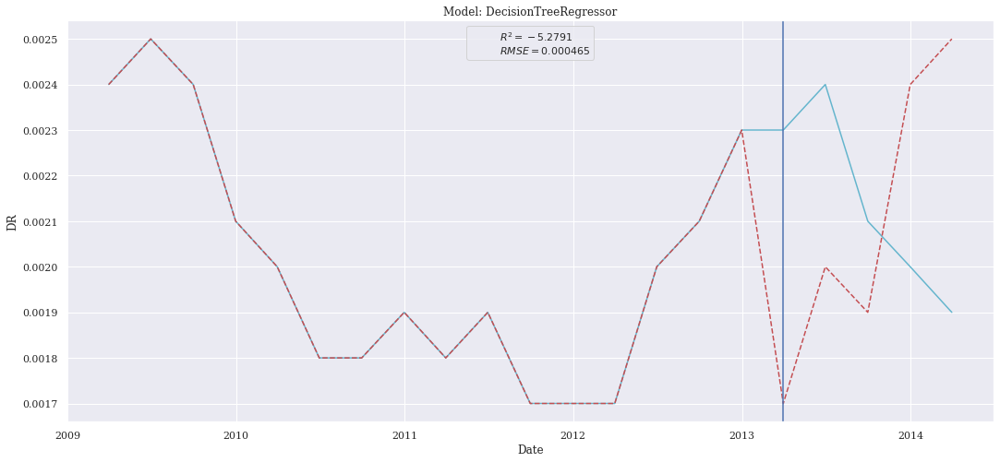

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


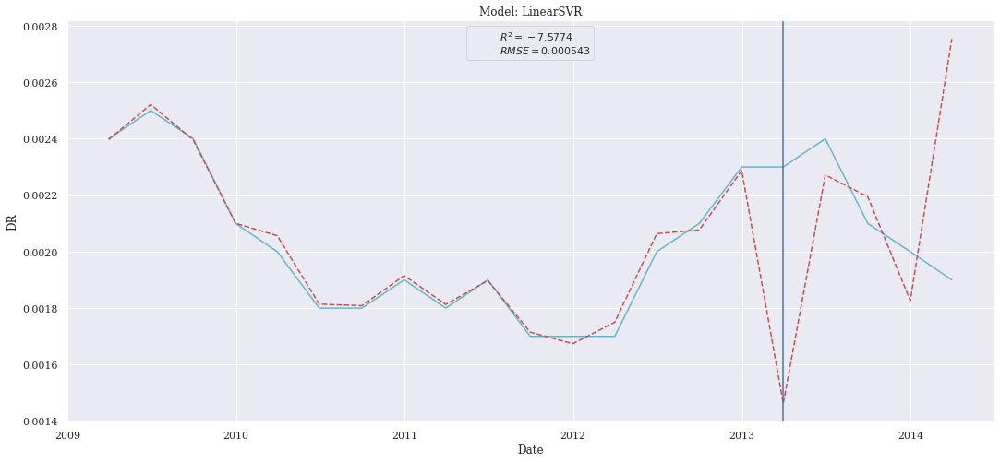

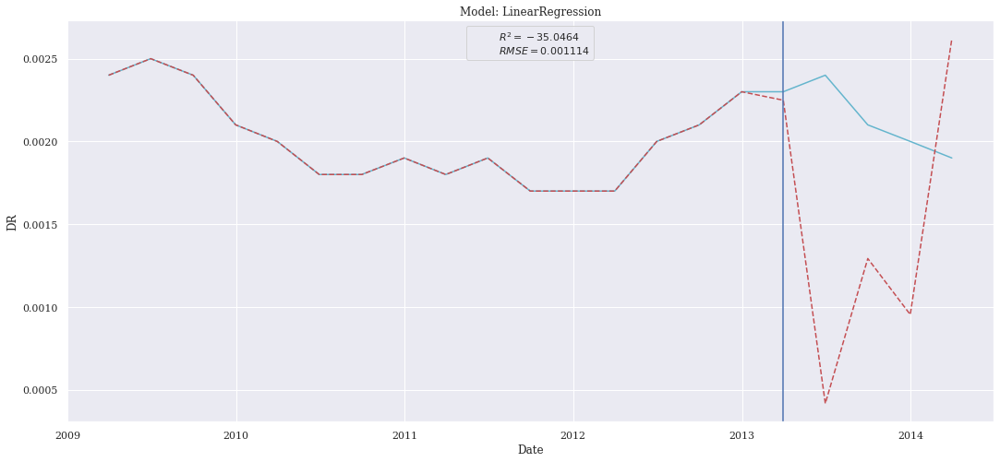

In [19]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [20]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_2_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000229,5.228901e-08,0.000179,-0.520029
CatBoostRegressor,0.000285,8.102061e-08,0.000257,-1.355250
DecisionTreeRegressor,0.000374,1.400000e-07,0.000360,-3.069767
Ridge,0.000385,1.481257e-07,0.000344,-3.305980
KNeighborsRegressor,0.000420,1.764800e-07,0.000400,-4.130233
LinearSVR,0.000681,4.640216e-07,0.000532,-12.488999
LinearRegression,0.000986,9.722699e-07,0.000891,-27.263659


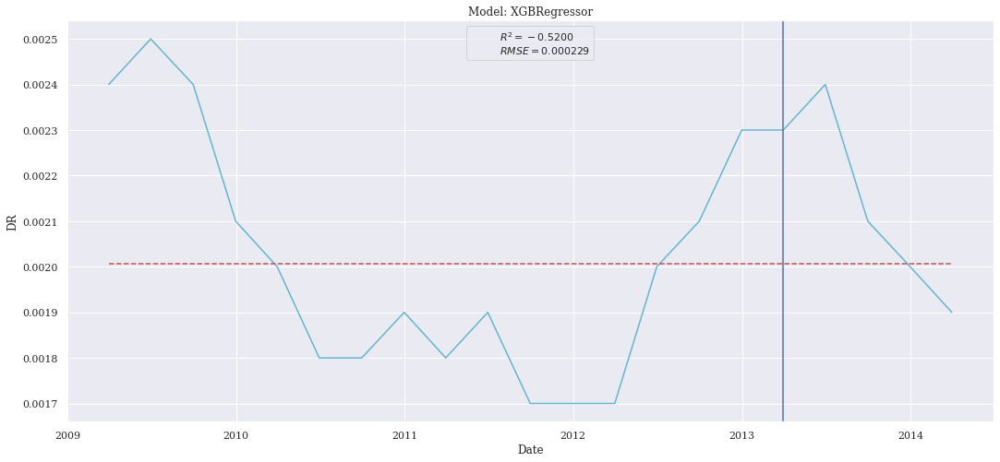

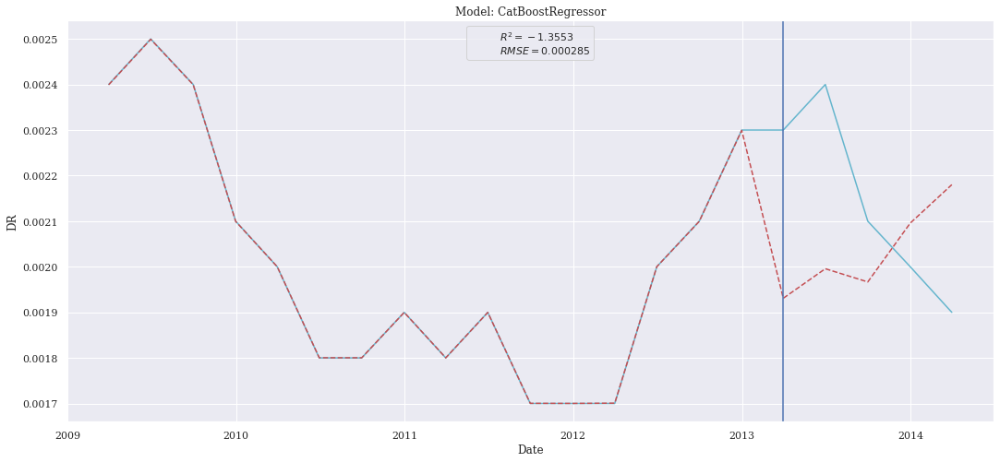

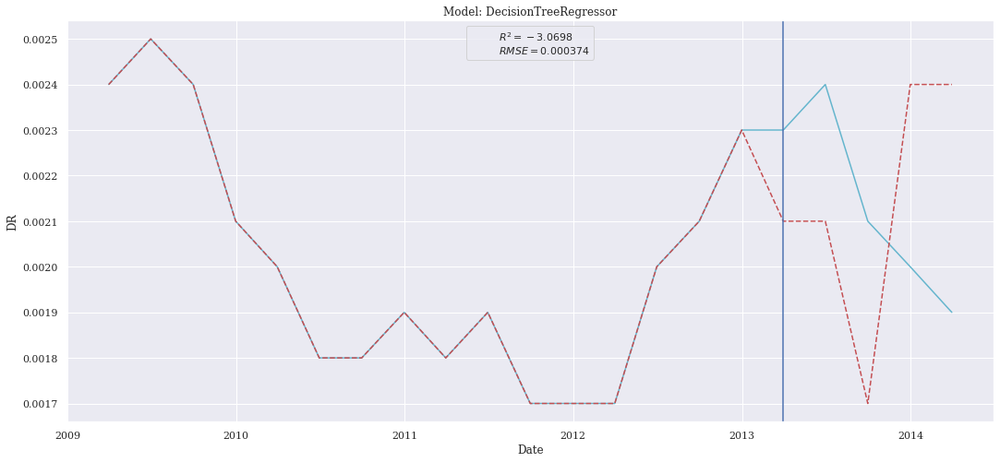

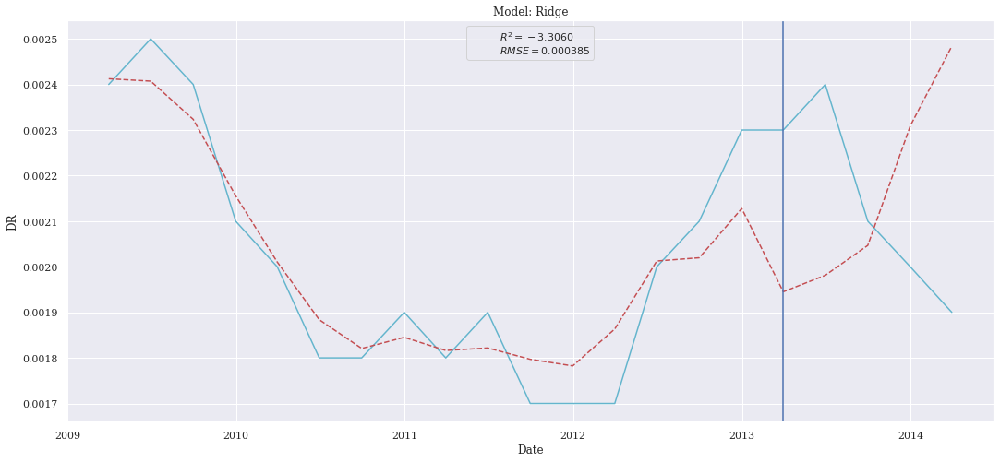

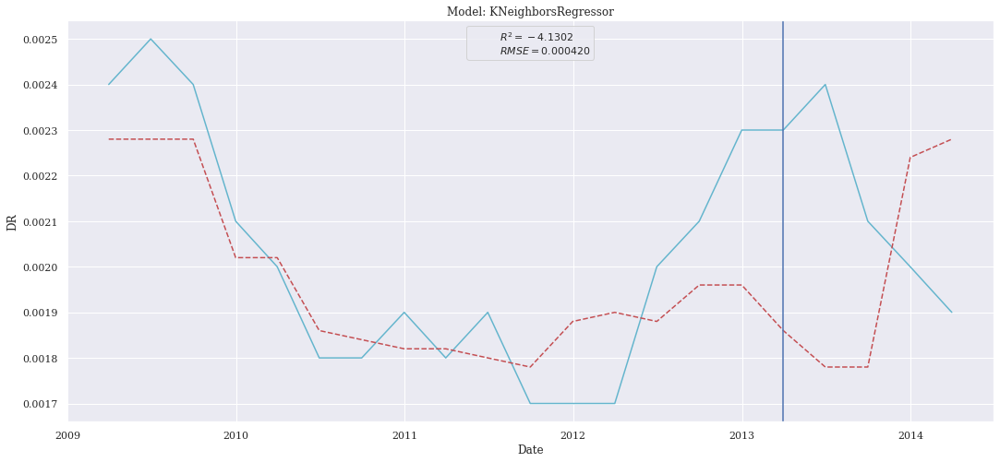

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


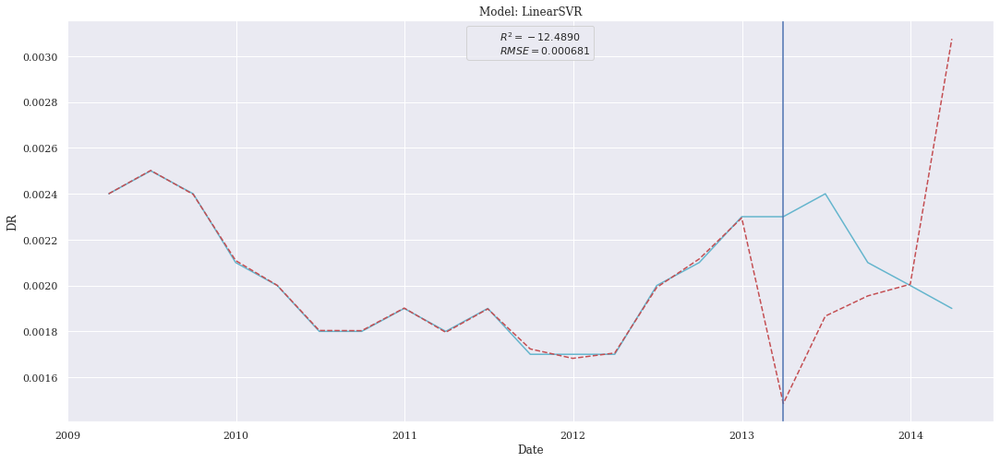

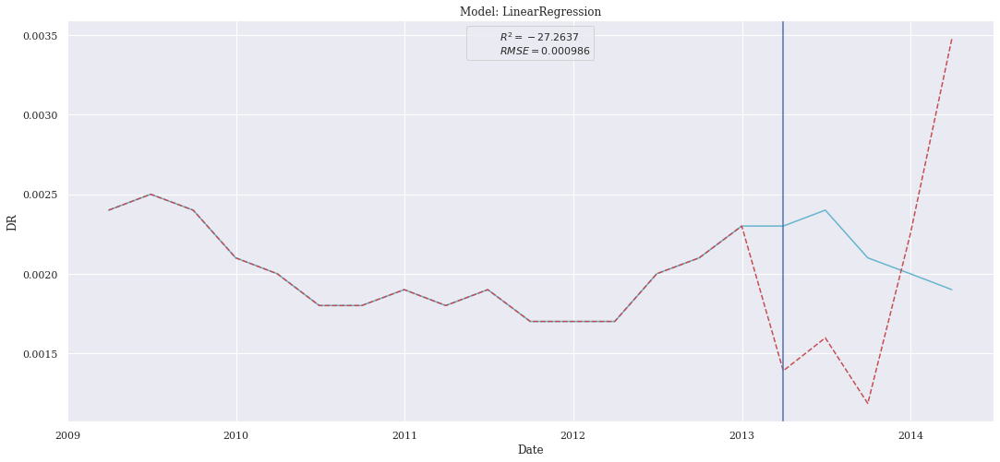

In [21]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [22]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_2_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000229,5.228901e-08,0.000179,-0.520029
CatBoostRegressor,0.000315,9.939255e-08,0.000283,-1.889318
LinearRegression,0.000325,1.057342e-07,0.000266,-2.073668
KNeighborsRegressor,0.000345,1.188800e-07,0.000312,-2.455814
LinearSVR,0.000350,1.228294e-07,0.000281,-2.570623
Ridge,0.000377,1.420598e-07,0.000328,-3.129646
DecisionTreeRegressor,0.000443,1.960000e-07,0.000400,-4.697674


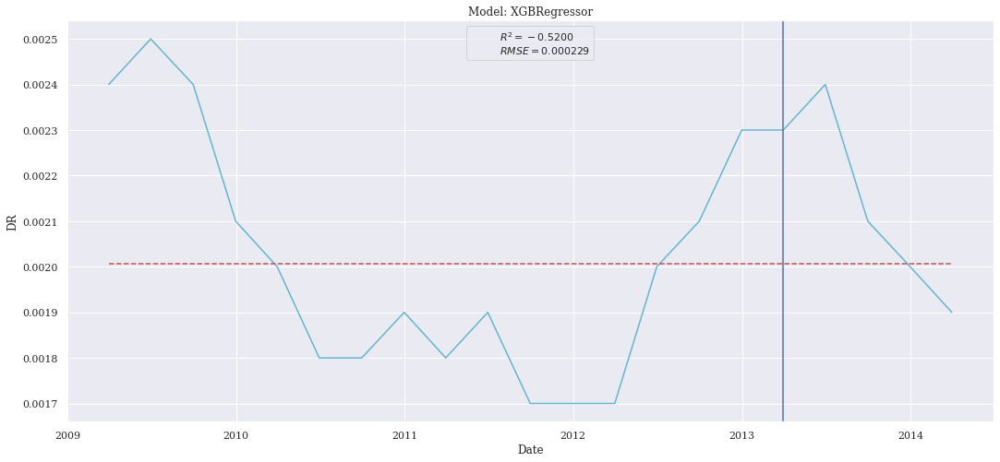

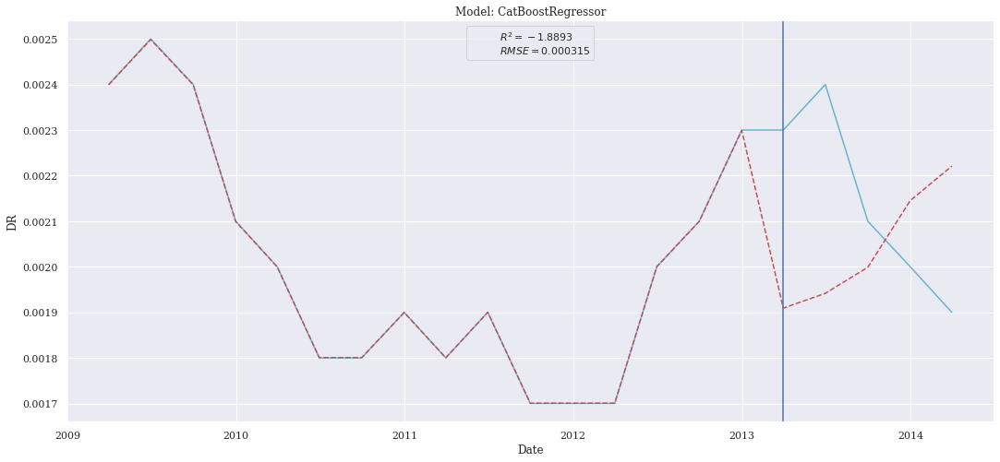

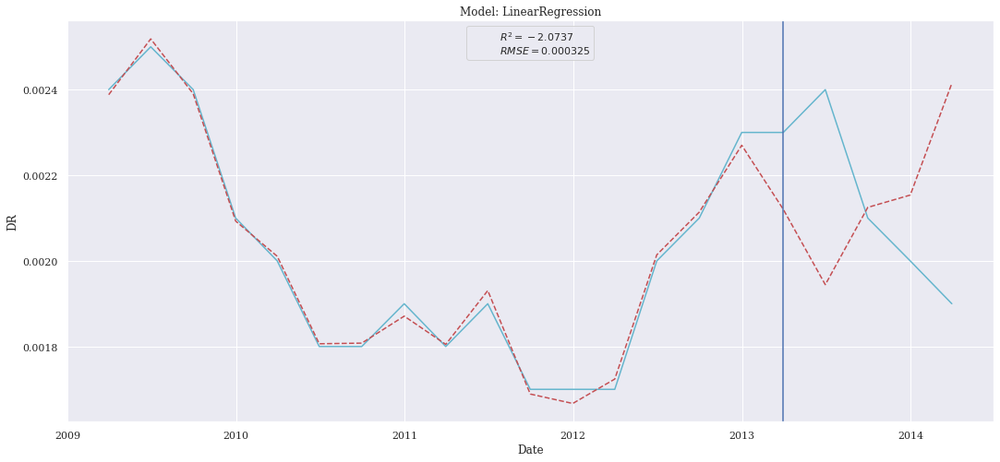

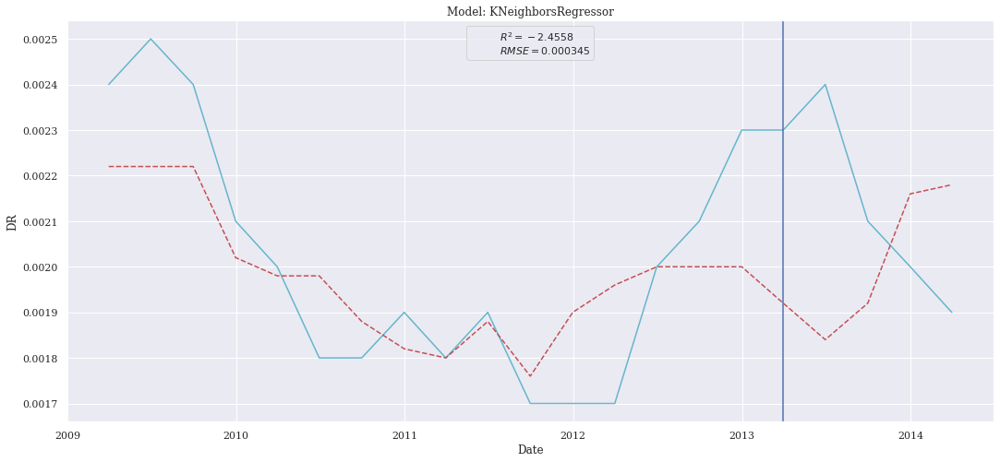

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


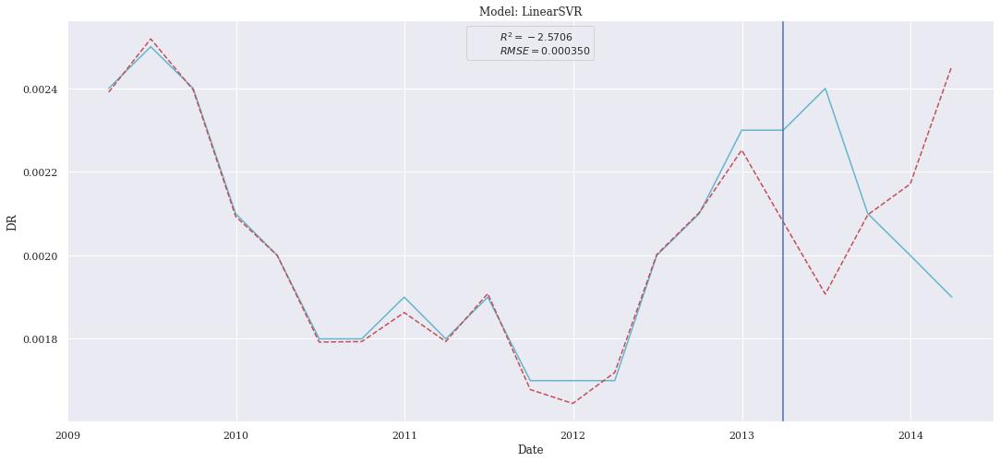

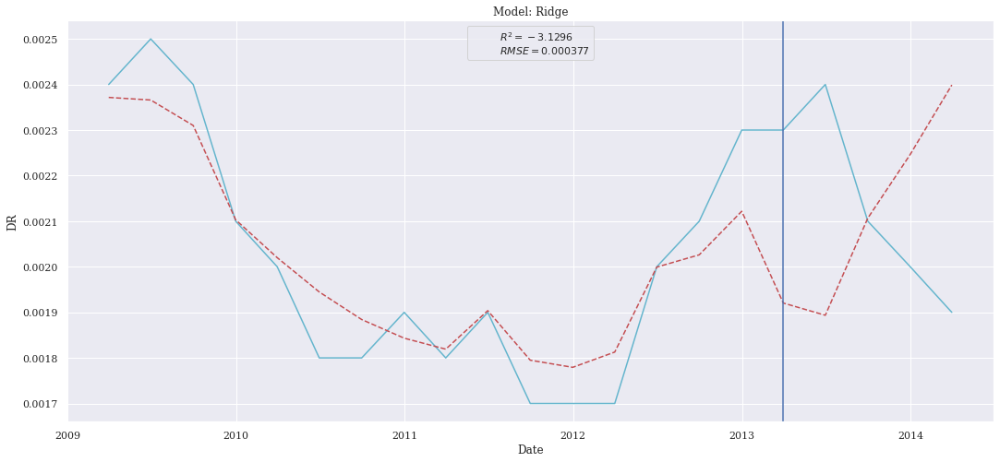

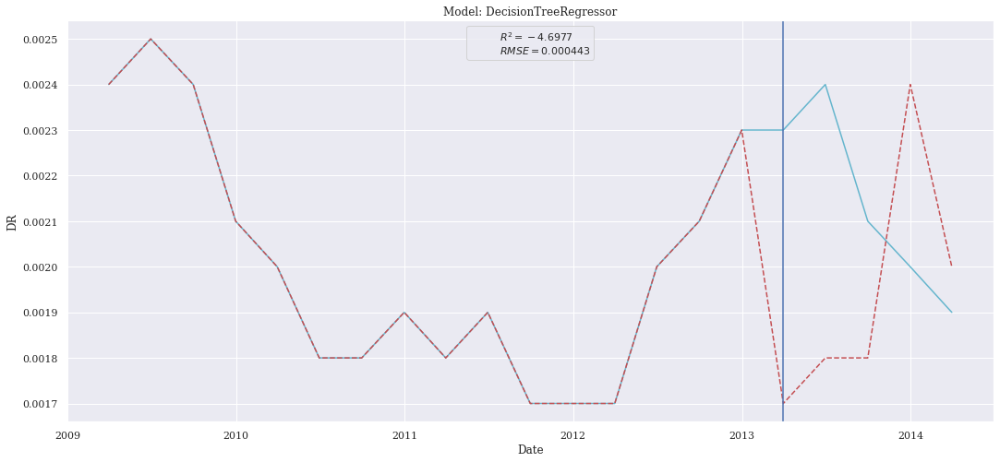

In [23]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [24]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_2_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000229,5.228901e-08,0.000179,-0.520029
Ridge,0.000260,6.747764e-08,0.000193,-0.961559
CatBoostRegressor,0.000261,6.810983e-08,0.000220,-0.979937
KNeighborsRegressor,0.000307,9.448000e-08,0.000268,-1.746512
DecisionTreeRegressor,0.000412,1.700000e-07,0.000380,-3.941860
LinearSVR,0.000590,3.480389e-07,0.000512,-9.117408
LinearRegression,0.000601,3.616480e-07,0.000540,-9.513023


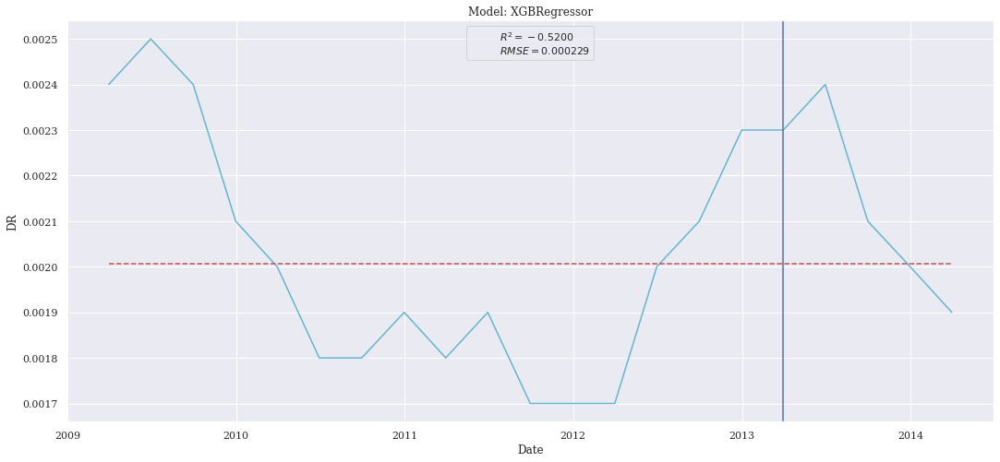

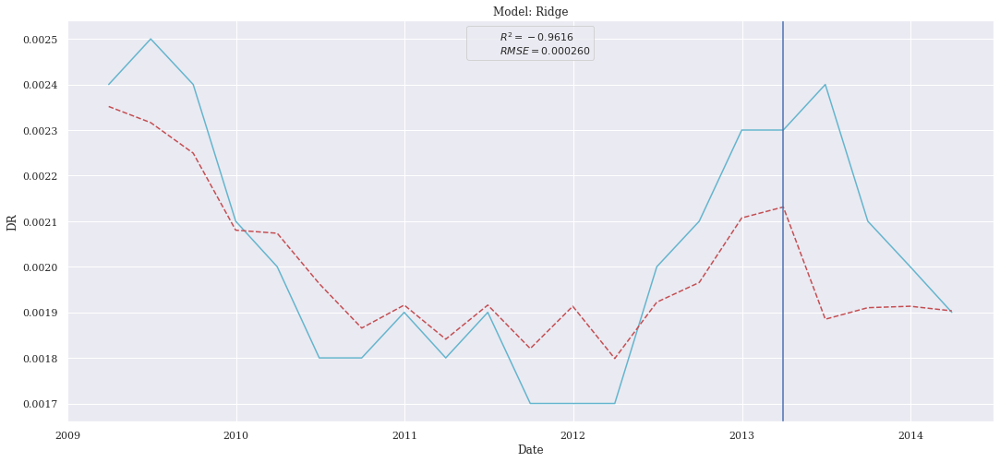

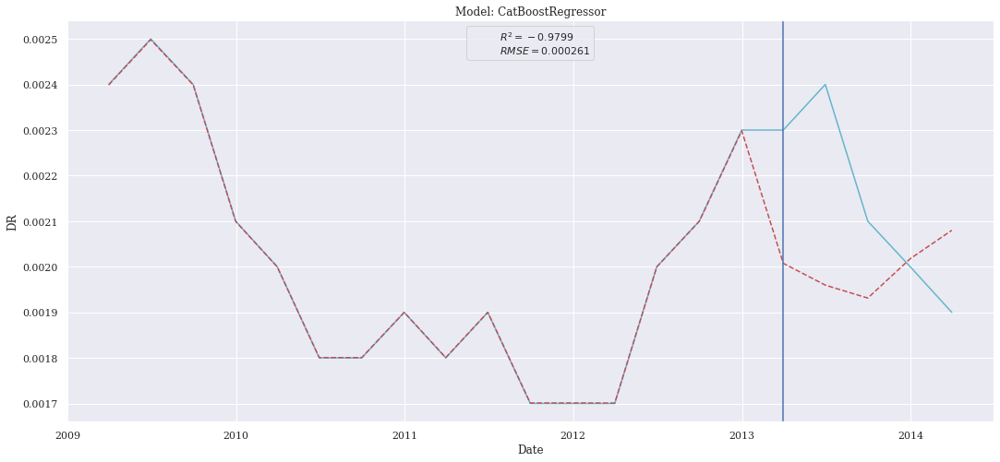

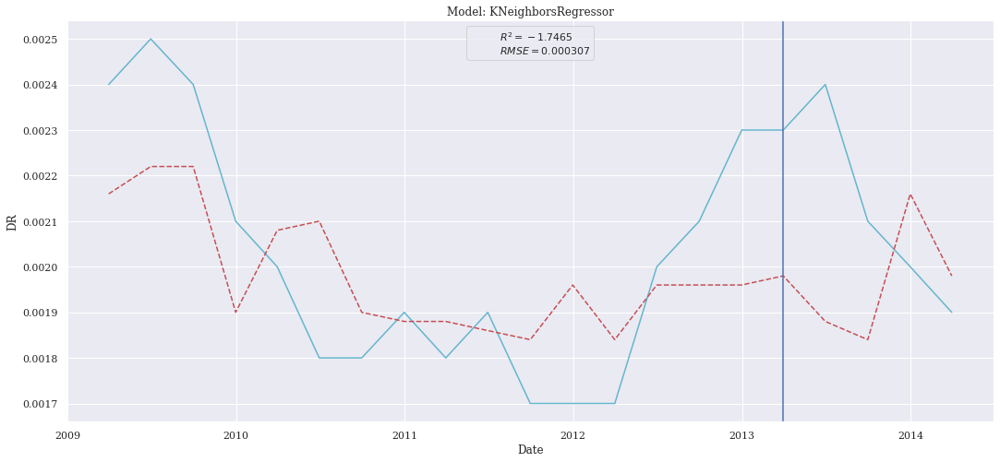

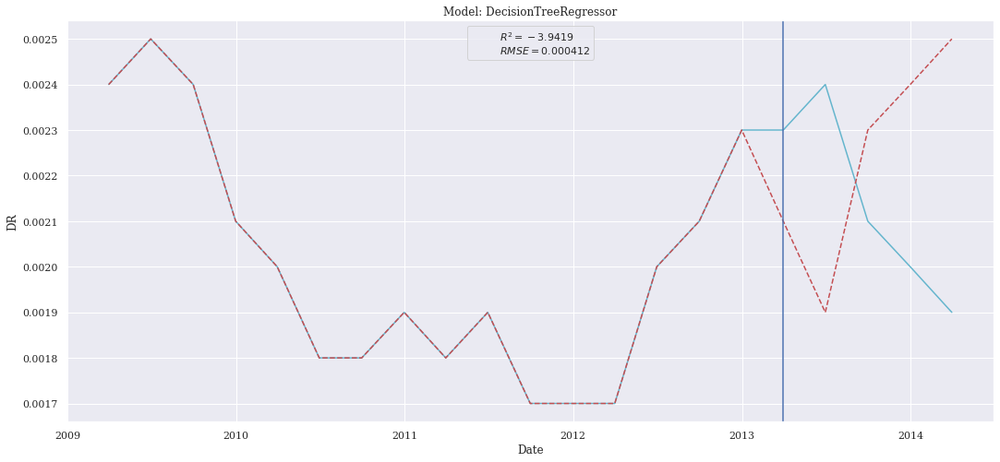

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


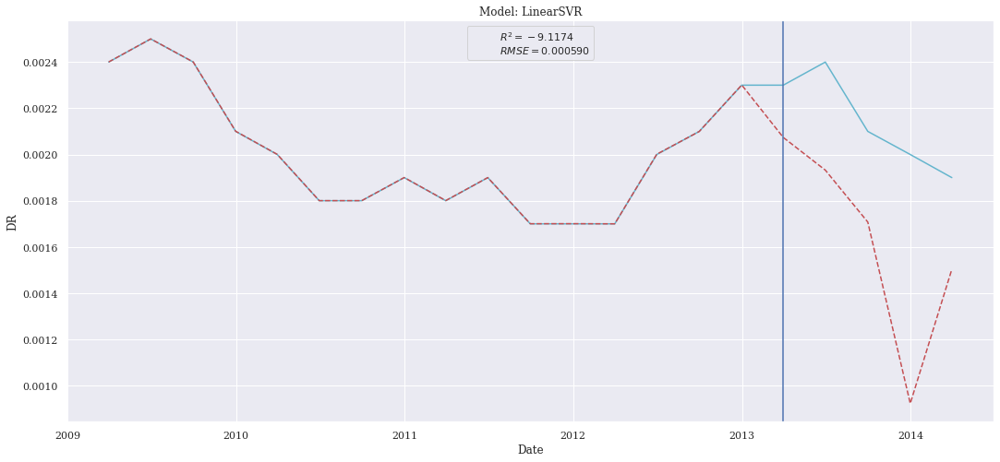

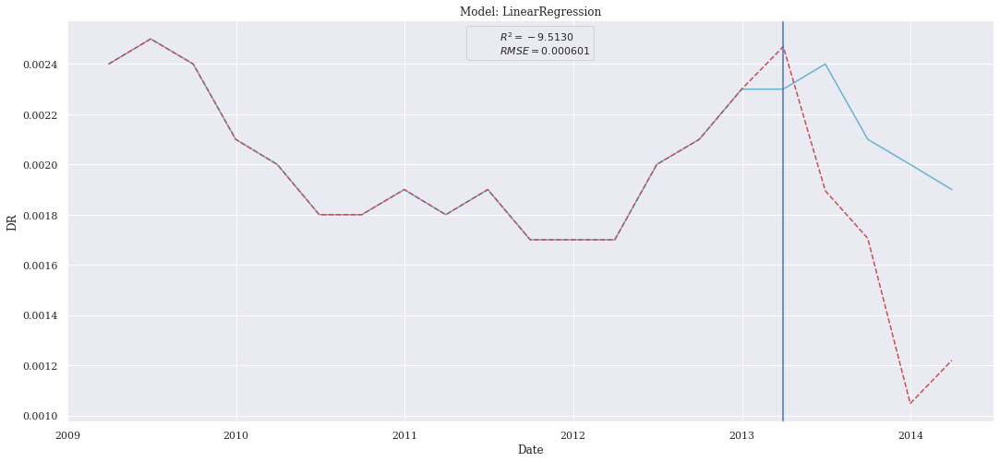

In [25]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
Given a first point of view we see that the xgboost and catboost are the best models to predict CHR2. We generally have a rmse equals to 0.000184 for the xgboost with a r2 positive but very low (all the r2 are negative, that show that the model doesn't follow the trend of y_test). One exception is observed for the KNeighborsRegressor with recursive features were we have a r2 of 0.73 and a rmse equals to 0.0.000096 (best result). We decided to apply a grid search on xgboost, catboostregressor and kneighborsregressor to find if a better parameter is possible

### GridSearch on KNeighborsRegressor

In [21]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR2",col_used=cl.col_2_recur,split=split,norm=norm)
params_knr = {"n_neighbors":[5,6,7,8,9,10],"weights":["uniform"],"algorithm":["auto","ball_tree","kd_tree","brute"],"p":[1,2],"leaf_size":[5,10,20,30,40,50]}
params,score = params_grid(X_train,y_train,X_test,y_test,"knn",params_knr)
print(params,score)

Fitting 2 folds for each of 288 candidates, totalling 576 fits
{'algorithm': 'auto', 'leaf_size': 5, 'n_neighbors': 5, 'p': 1, 'weights': 'uniform'} 7.042726744663612e-05


In [22]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["knn"],parameters={"p_knn":params})
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.00007,4.960000e-09,0.000056,0.855814


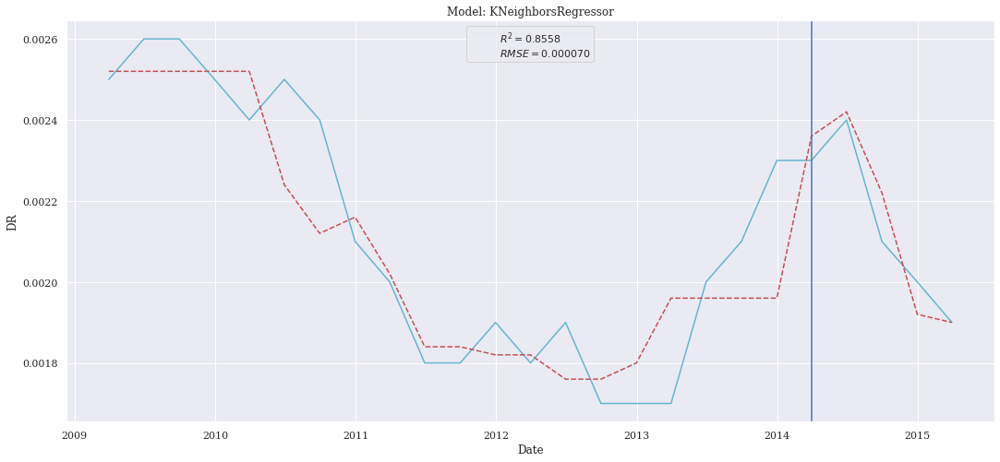

In [23]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on XGBoost

In [24]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR2",col_used=cl.col_2_kbest,split=split,norm=norm)
params_xgb = {"booster":["gbtree"],"eta":[0.1*i for i in range(1,11)],"gamma":[5*i for i in range(5)],"max_depth":[i for i in range(3,11)],"num_parallel_tree":[1,2,3,4,5],"verbose":[0]}
params,score = params_grid(X_train,y_train,X_test,y_test,"xgb",params_xgb)
print(params,score)

Fitting 2 folds for each of 2000 candidates, totalling 4000 fits
[23:57:00] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:57:00] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:57:00] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:57:01] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:57:01] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/learner.

KeyboardInterrupt: 

In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["xgb"],parameters={"p_xgb":params})
summary

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_xgb":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_xgb":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on CatBoost

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR2",col_used=cl.col_2_recur,split=split,norm=norm)
params_cat = {'depth': [i for i in range(1,7)],'learning_rate':[0.01*i for i in range(25,60)],'iterations':[10*i for i in range(15,30)],"verbose":[0]}
params,score = params_grid(X_train,y_train,X_test,y_test,"cat",params_cat)
print(params,score)

Fitting 2 folds for each of 3150 candidates, totalling 6300 fits
{'depth': 4, 'iterations': 150, 'learning_rate': 0.45, 'verbose': 0} 0.0002429227268599995


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["cat"],parameters={"p_cat":params})
summary

,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000243,5.901145e-08,0.000214,-0.715449


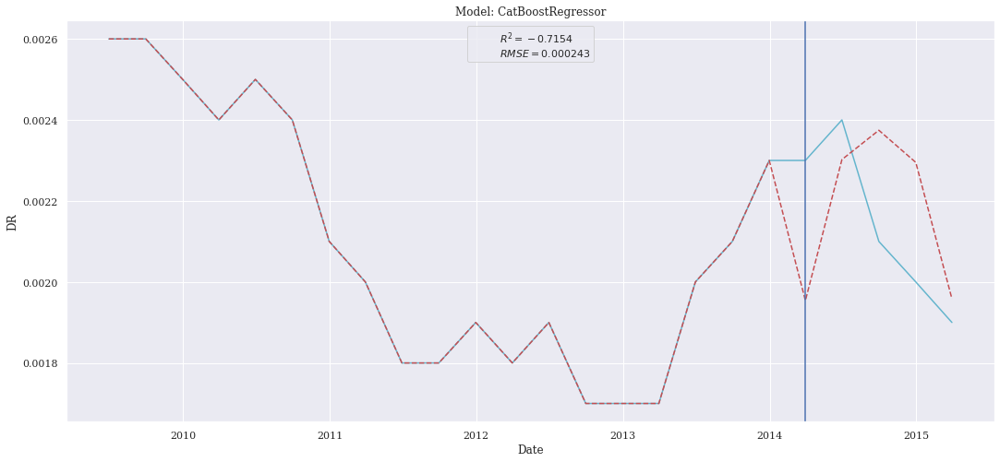

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_cat":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_cat":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the KNN model but not for the catboost and xgboost model.
With the knn we have now a r2 equals to 0.855.

# Focus on the Chronique CHR8

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [26]:
chronique=b'CHR8'
start = 1
norm = "MinMax"
split = 0.2
period = 12
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train,X_test], axis=1).index

### Correlation Features

In [27]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period,chronique=chronique,col_used=cl.col_8_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.009282,0.000086,0.008549,-14.983990
CatBoostRegressor,0.009412,0.000089,0.008796,-15.434449
KNeighborsRegressor,0.010100,0.000102,0.009440,-17.922766
Ridge,0.010644,0.000113,0.010159,-20.017265
DecisionTreeRegressor,0.013339,0.000178,0.011380,-32.007940
LinearSVR,0.026963,0.000727,0.020467,-133.873349
LinearRegression,0.041311,0.001707,0.038134,-315.596314


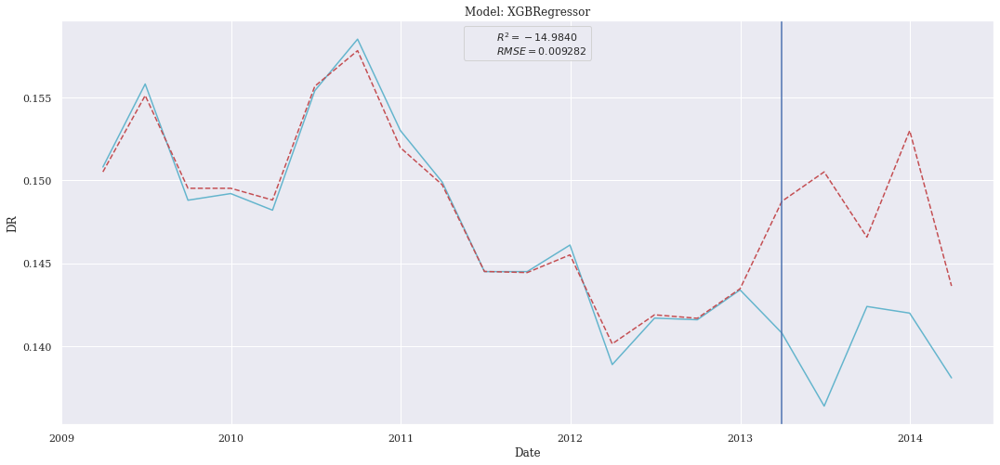

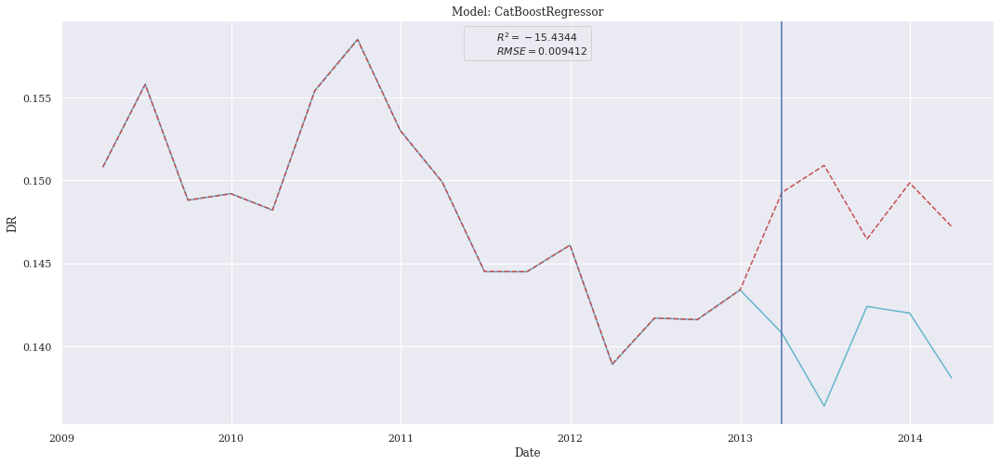

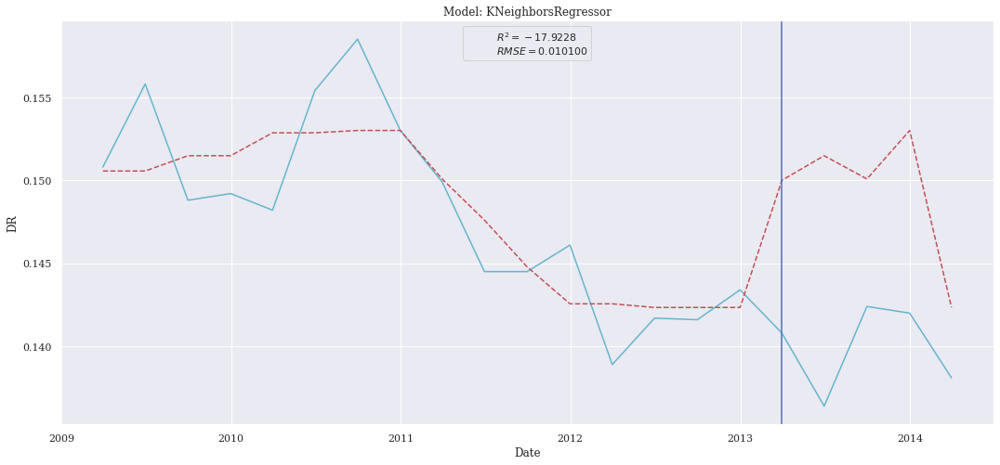

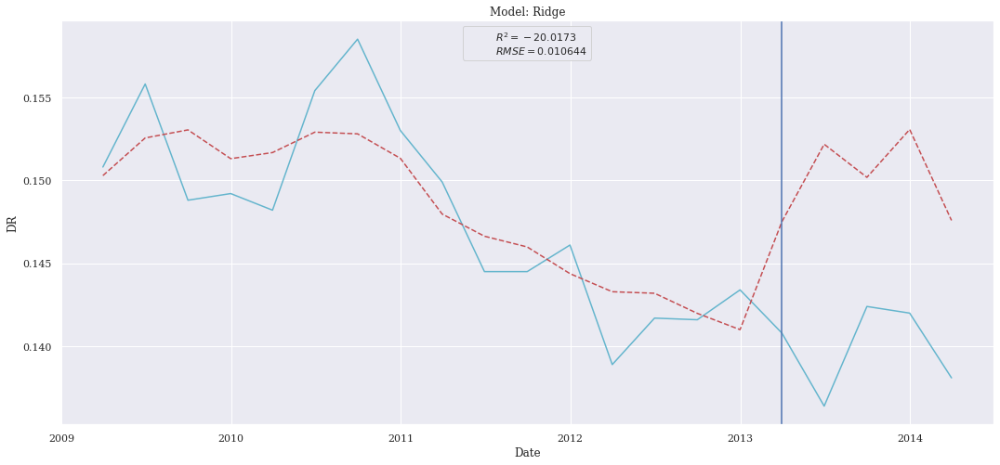

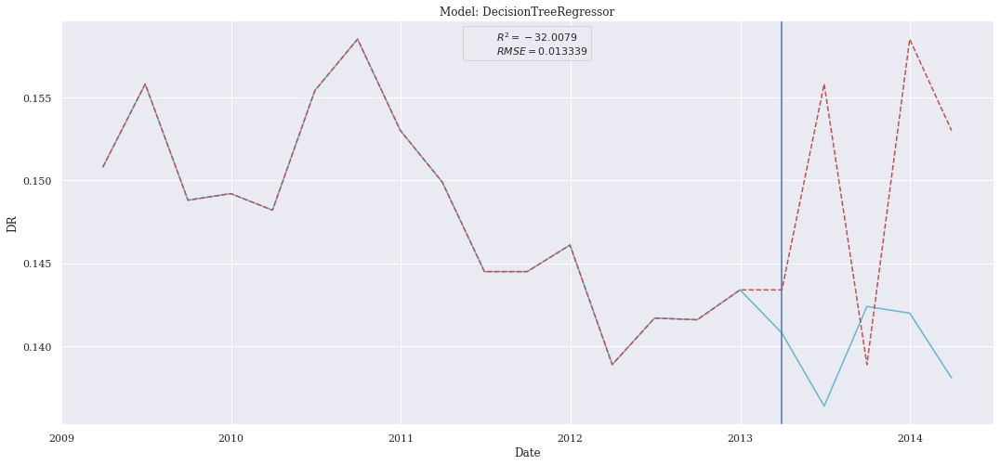

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


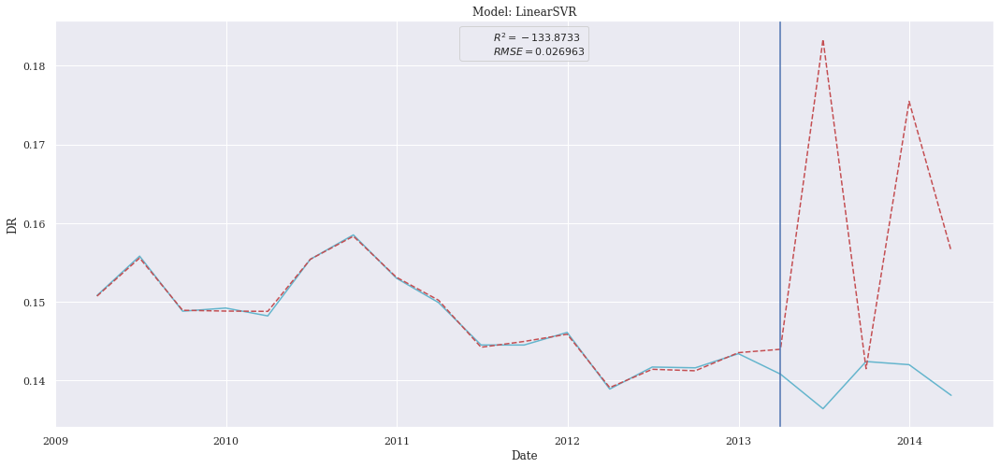

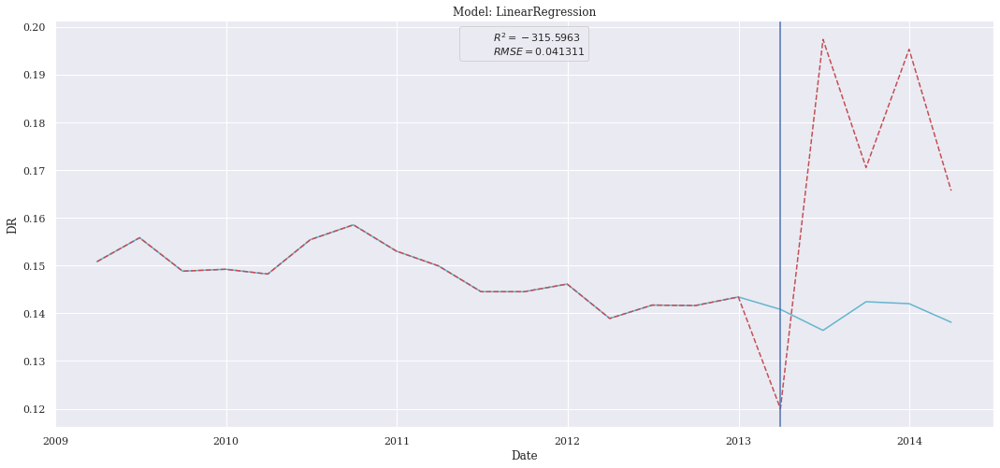

In [28]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [29]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_8_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.008102,0.000066,0.007212,-11.178058
CatBoostRegressor,0.009047,0.000082,0.008509,-14.183054
DecisionTreeRegressor,0.010080,0.000102,0.008060,-17.850178
XGBRegressor,0.010420,0.000109,0.008662,-19.141237
KNeighborsRegressor,0.010831,0.000117,0.009988,-20.761873
LinearRegression,0.011818,0.000140,0.010071,-24.909452
LinearSVR,0.026490,0.000702,0.023889,-129.184467


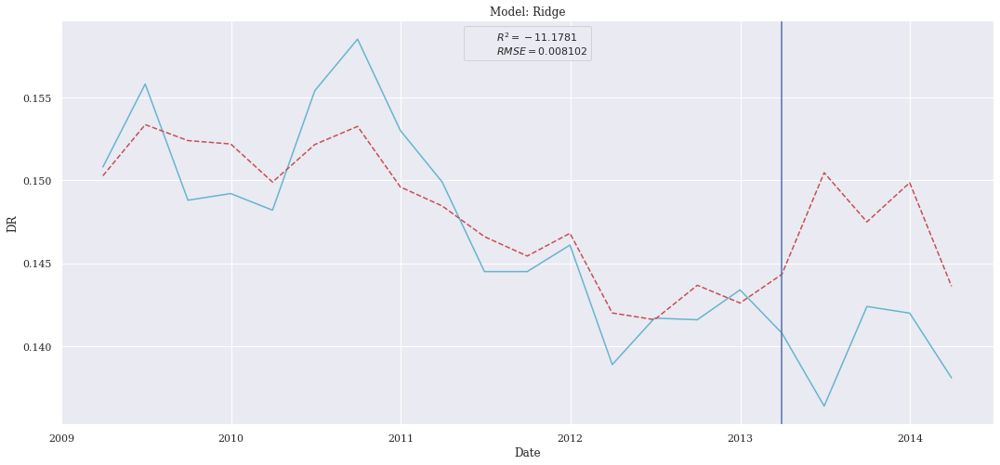

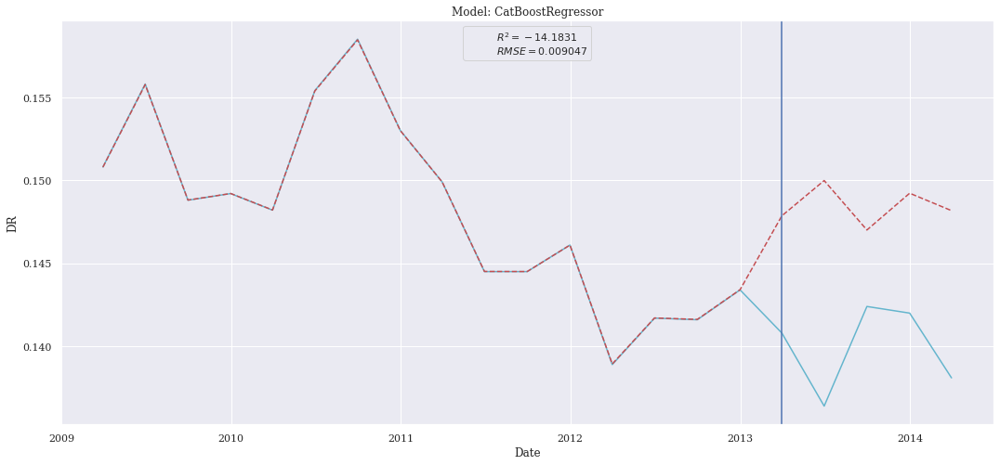

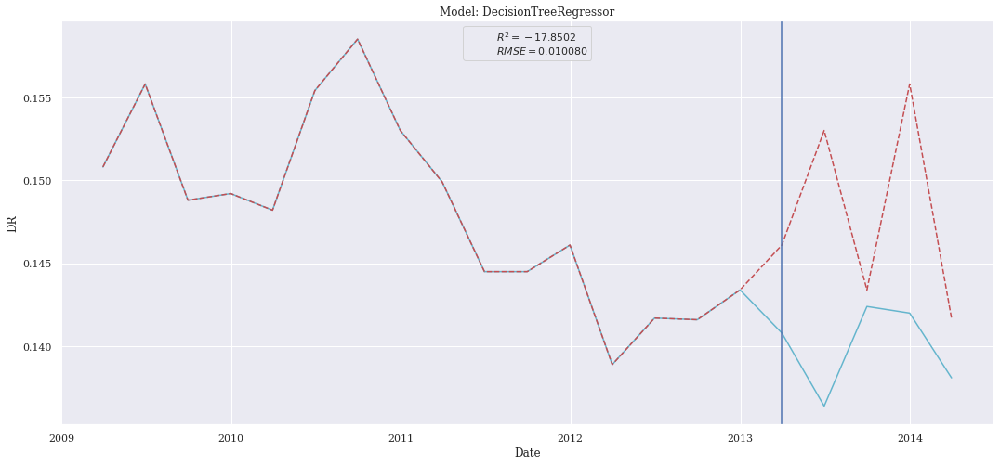

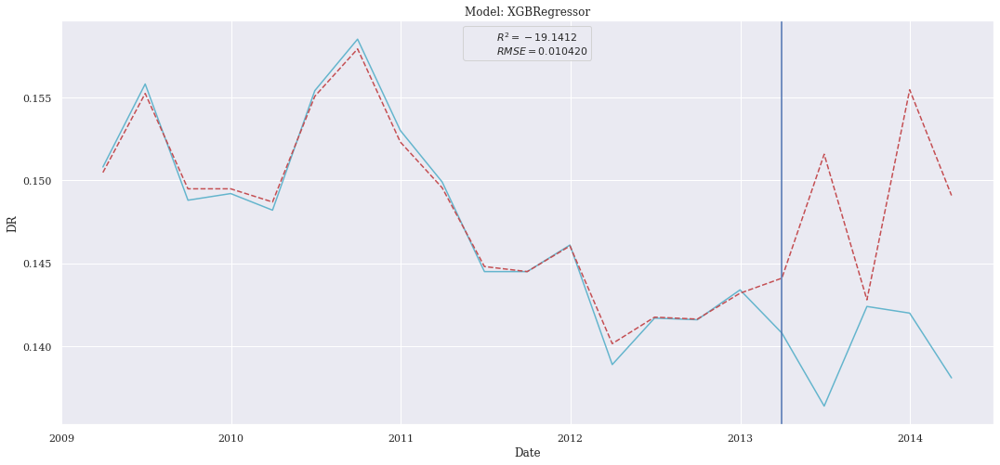

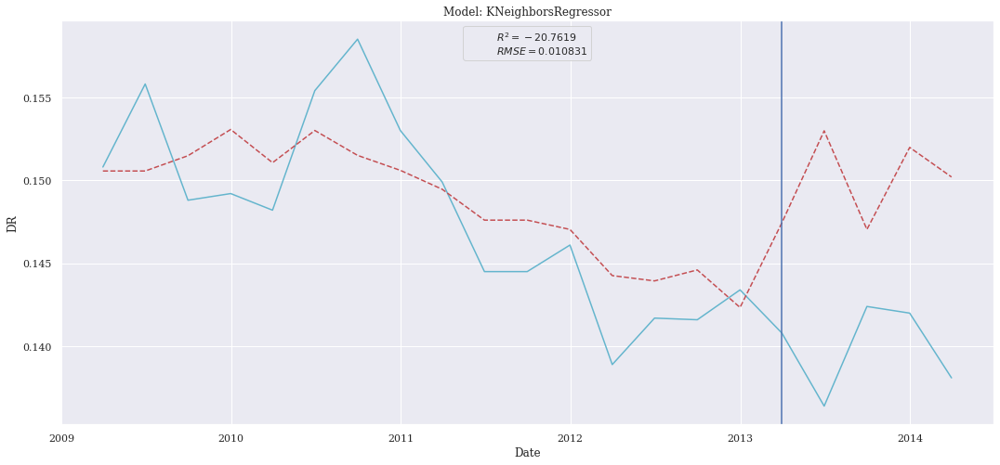

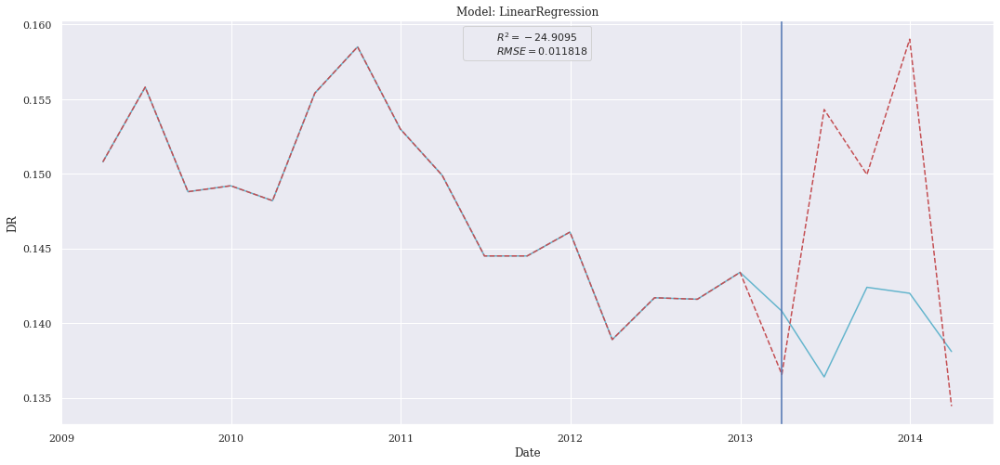

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


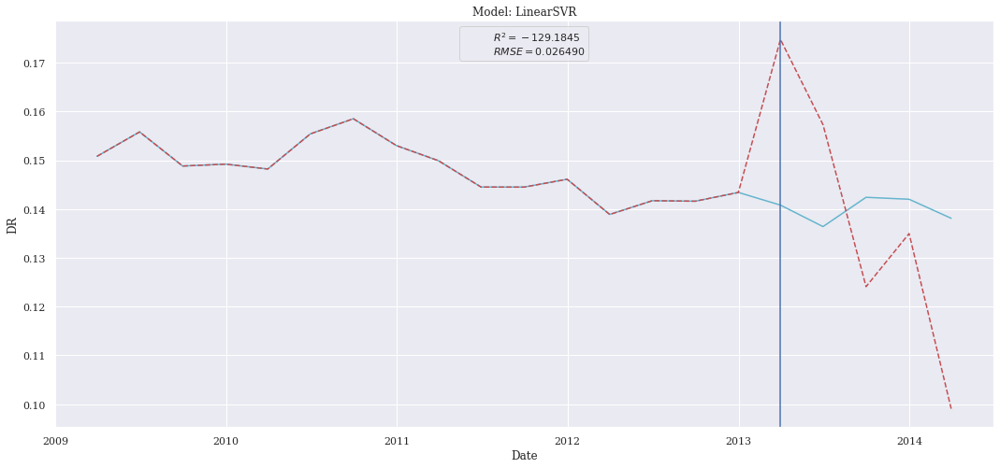

In [30]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [31]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_8_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.009177,0.000084,0.008618,-14.621955
Ridge,0.010245,0.000105,0.009835,-18.473034
KNeighborsRegressor,0.010618,0.000113,0.009724,-19.914262
XGBRegressor,0.011329,0.000128,0.009130,-22.810830
DecisionTreeRegressor,0.013720,0.000188,0.012320,-33.922084
LinearRegression,0.025551,0.000653,0.023933,-120.115748
LinearSVR,0.033102,0.001096,0.026100,-202.271716


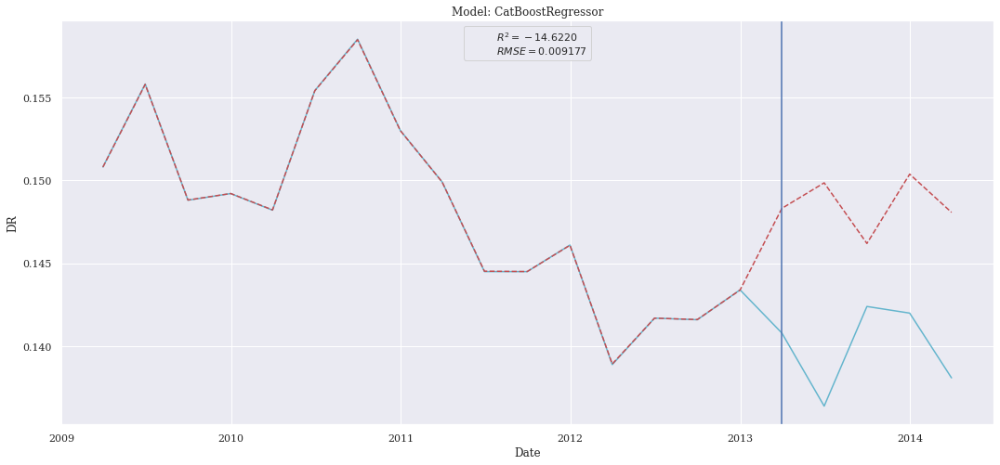

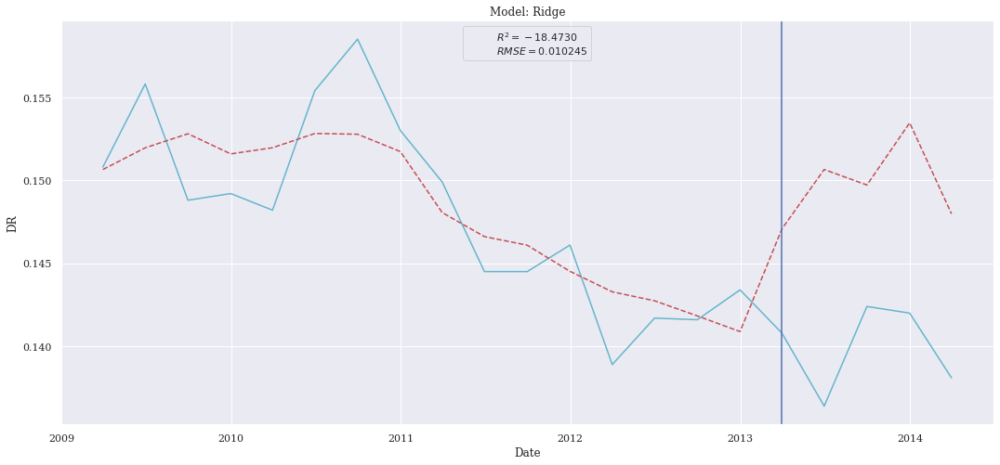

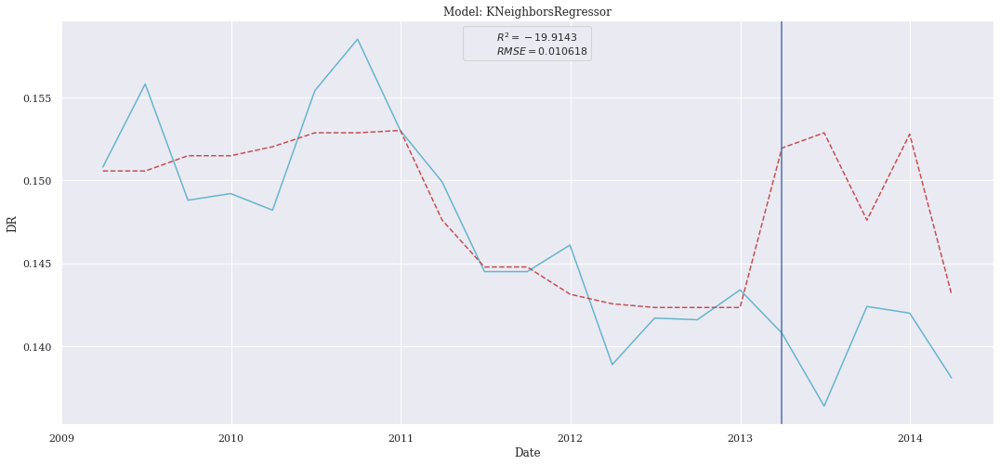

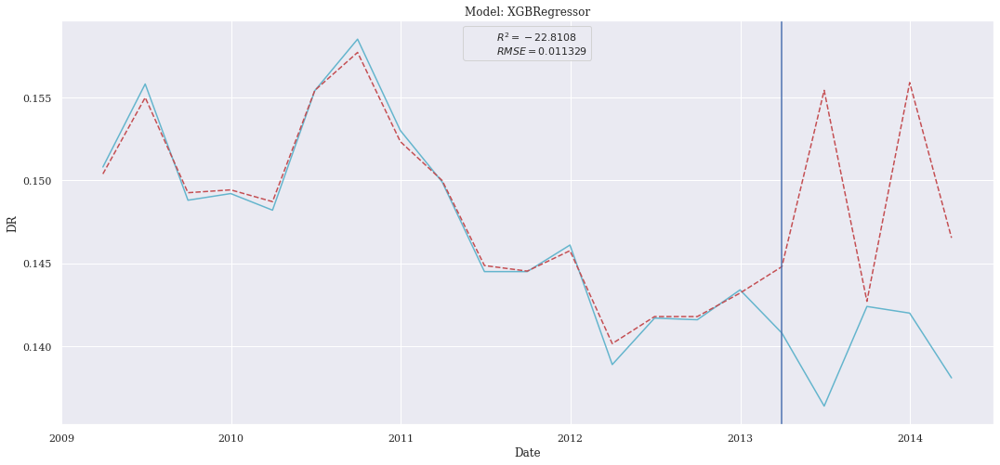

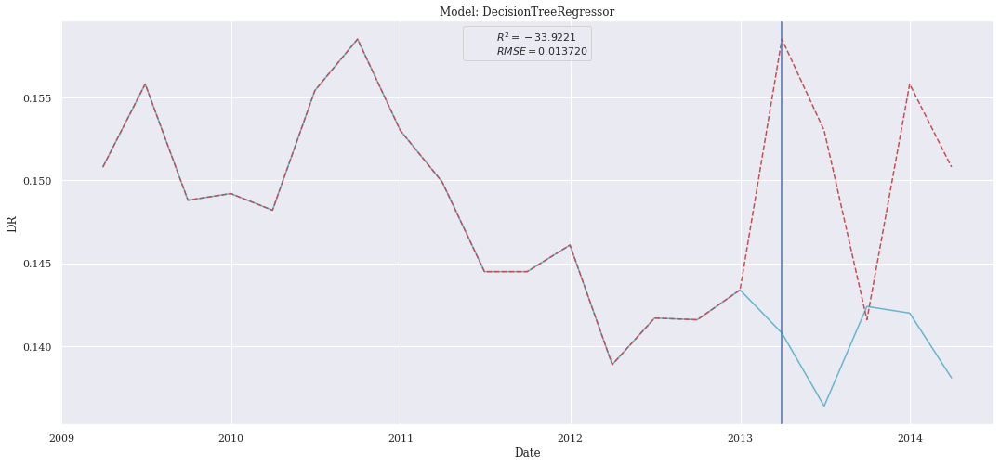

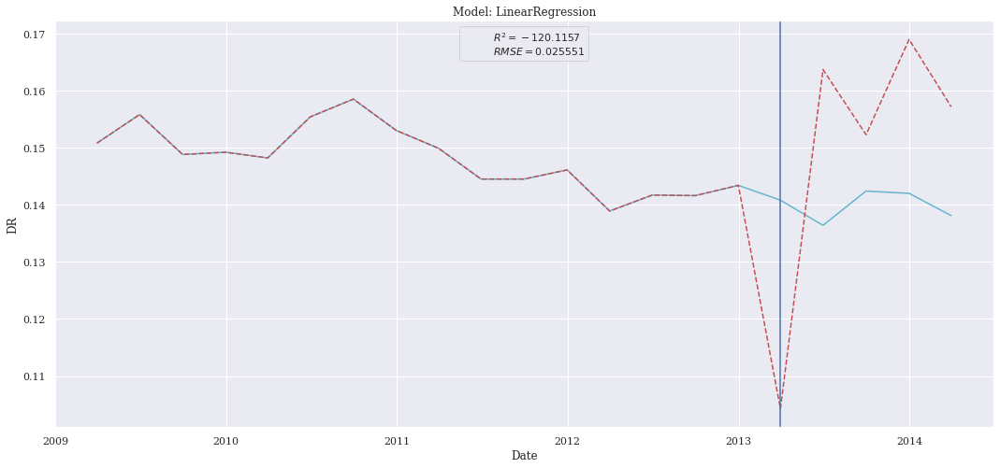

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


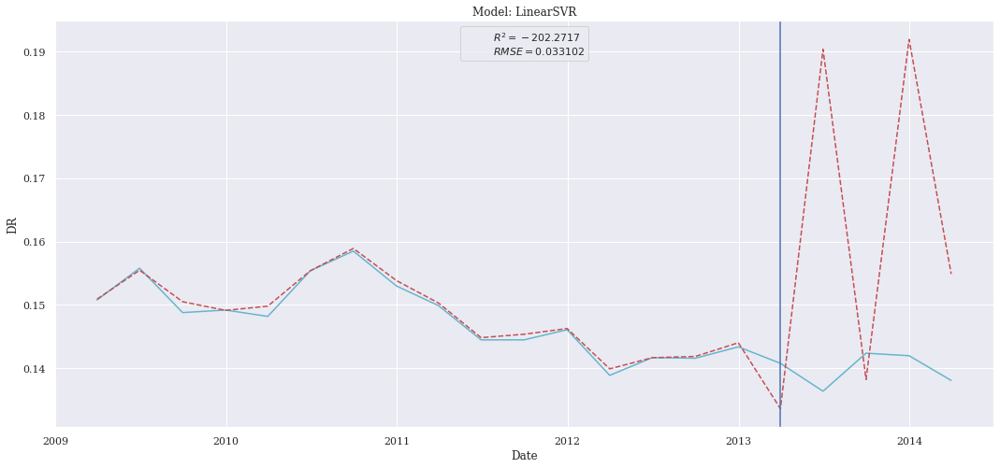

In [32]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [33]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_8_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.009287,0.000086,0.008894,-14.999092
Ridge,0.009935,0.000099,0.009051,-17.310996
LinearRegression,0.010933,0.000120,0.010108,-21.175930
KNeighborsRegressor,0.011220,0.000126,0.010268,-22.354334
XGBRegressor,0.011680,0.000136,0.009331,-24.308506
DecisionTreeRegressor,0.013494,0.000182,0.012540,-32.781167
LinearSVR,0.025527,0.000652,0.021290,-119.889944


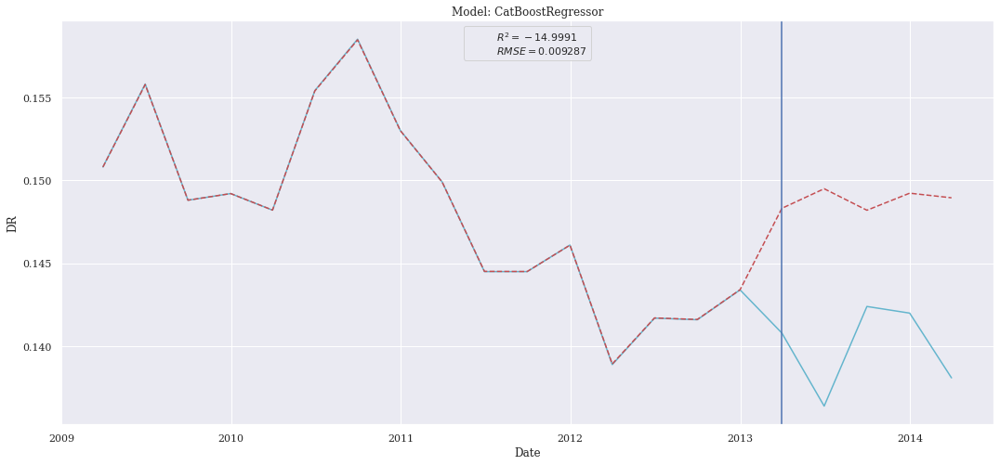

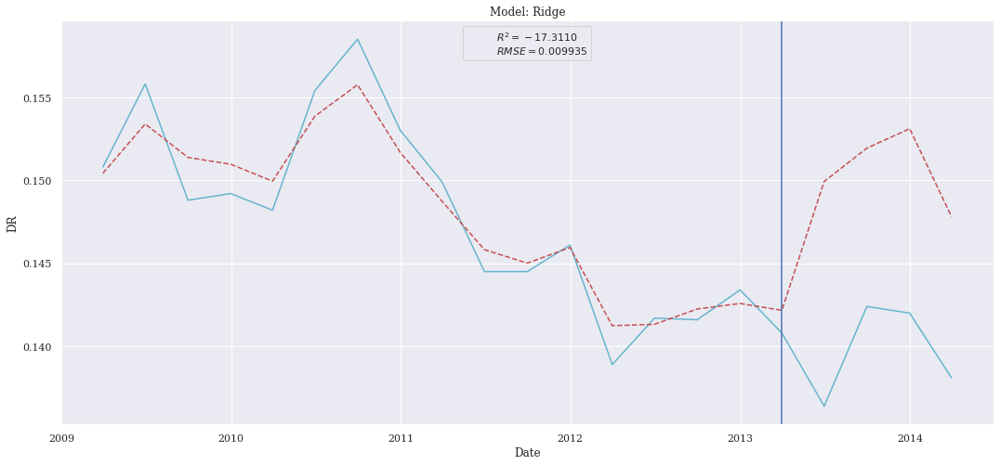

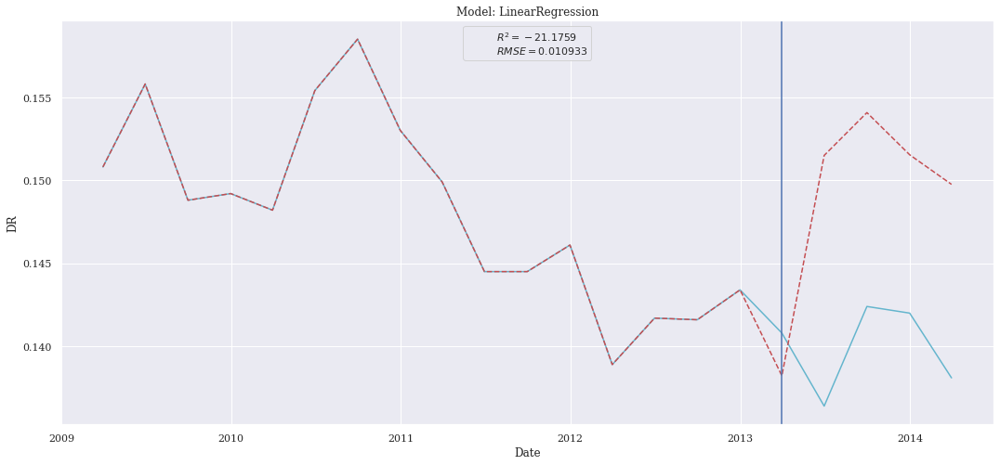

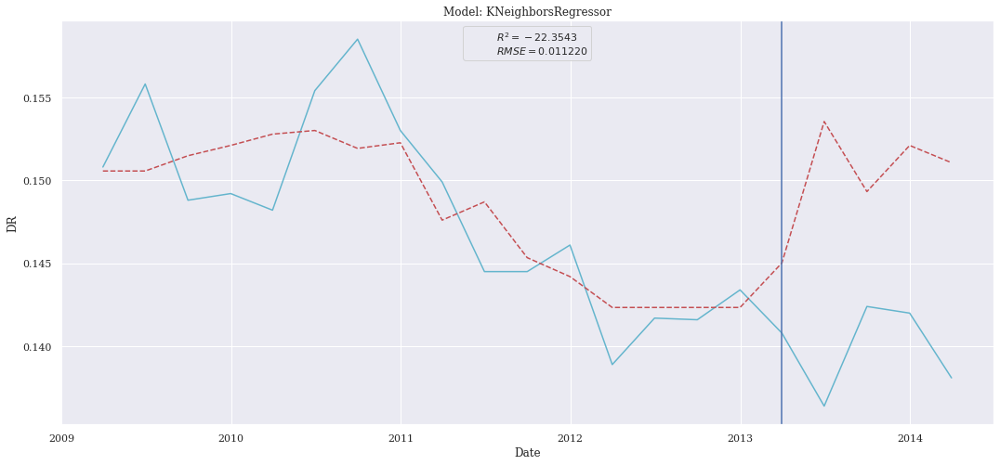

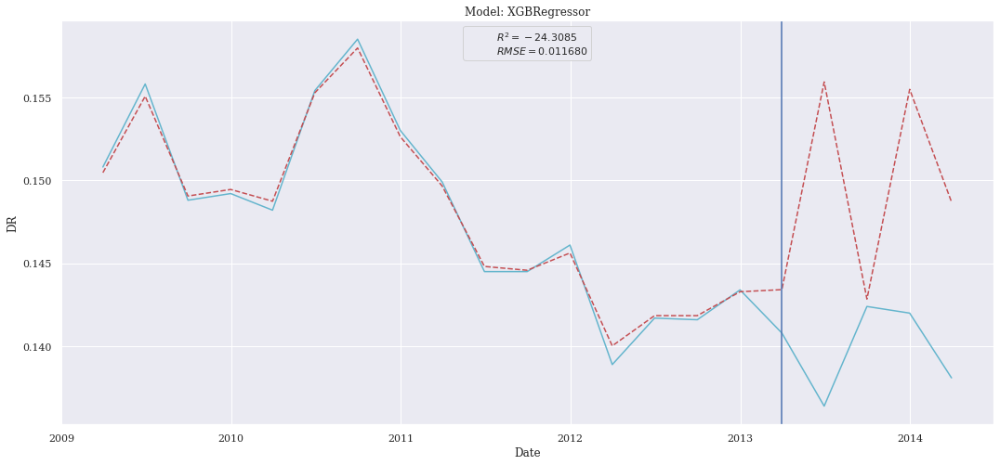

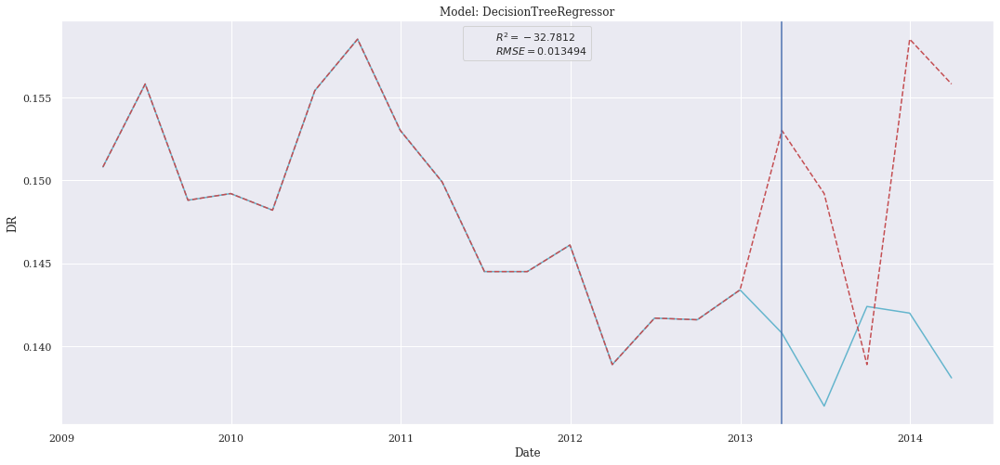

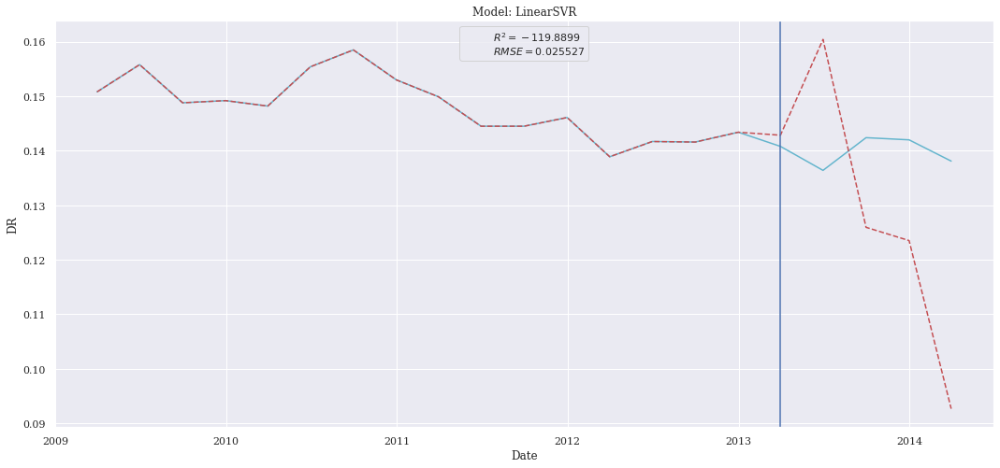

In [34]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [35]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_8_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.009136,0.000083,0.008711,-14.484263
DecisionTreeRegressor,0.009805,0.000096,0.007860,-16.835782
Ridge,0.009983,0.000100,0.008891,-17.488438
KNeighborsRegressor,0.010102,0.000102,0.009228,-17.930885
XGBRegressor,0.011130,0.000124,0.009675,-21.980146
LinearSVR,0.012603,0.000159,0.009366,-28.466094
LinearRegression,0.017535,0.000307,0.014140,-56.039472


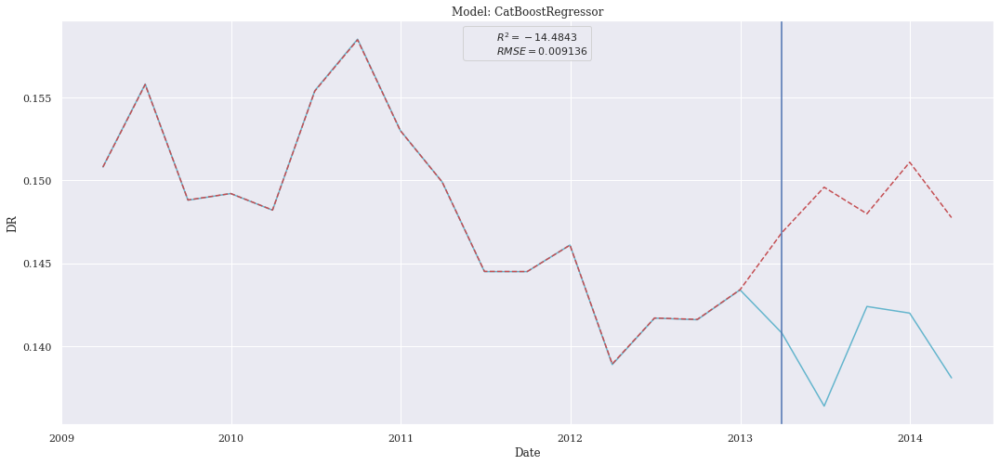

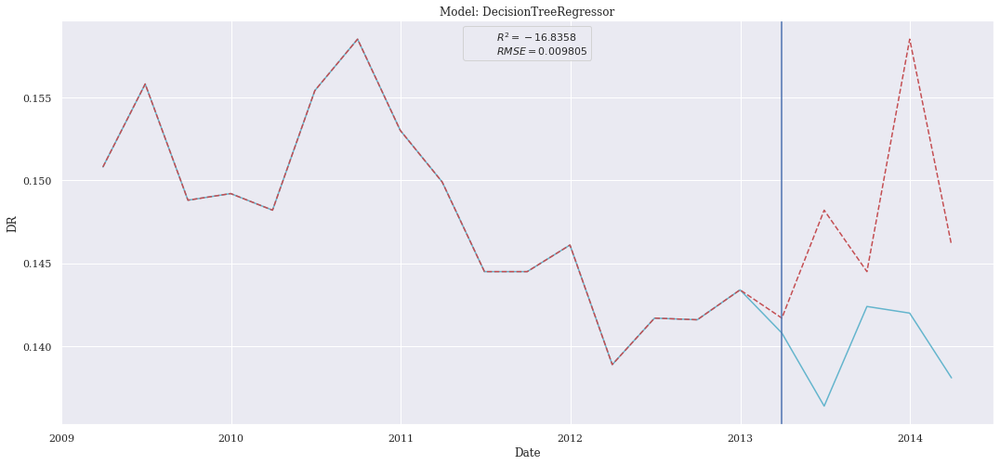

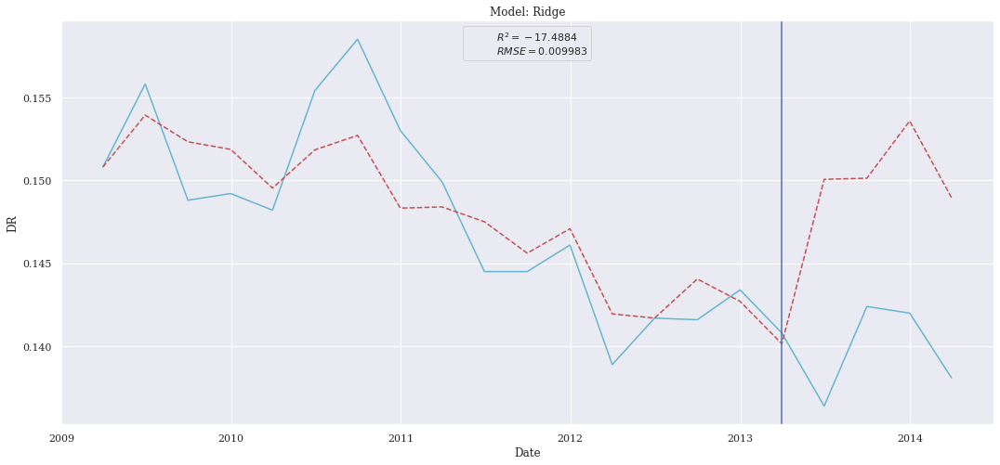

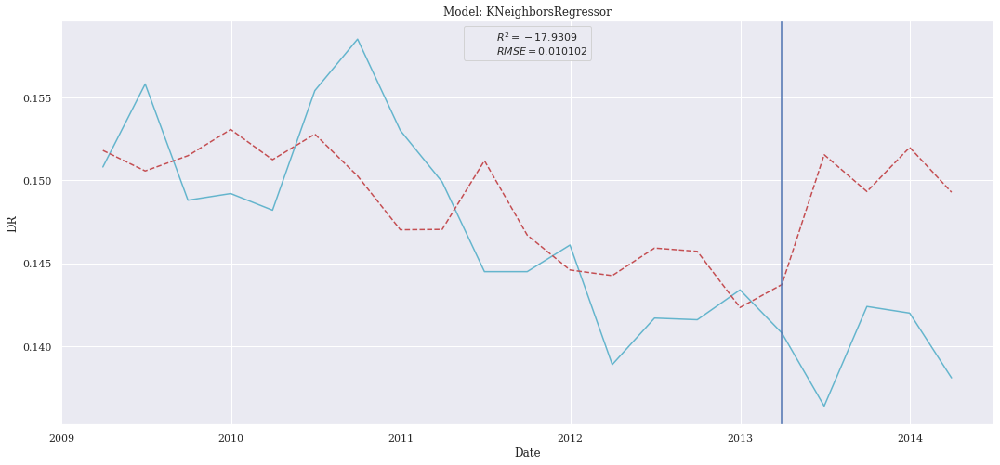

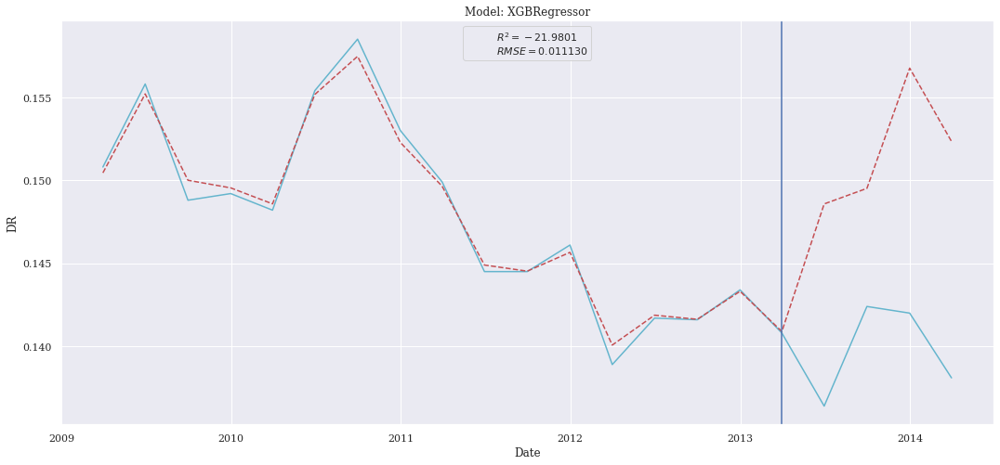

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


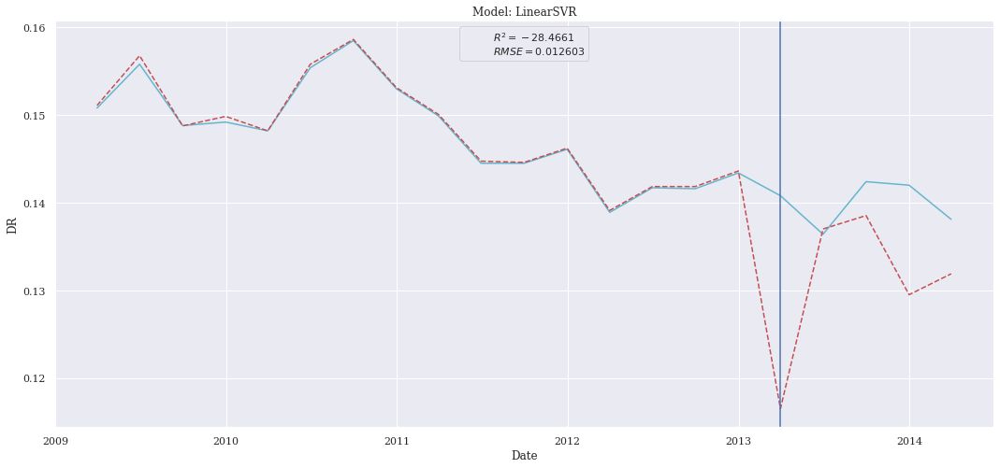

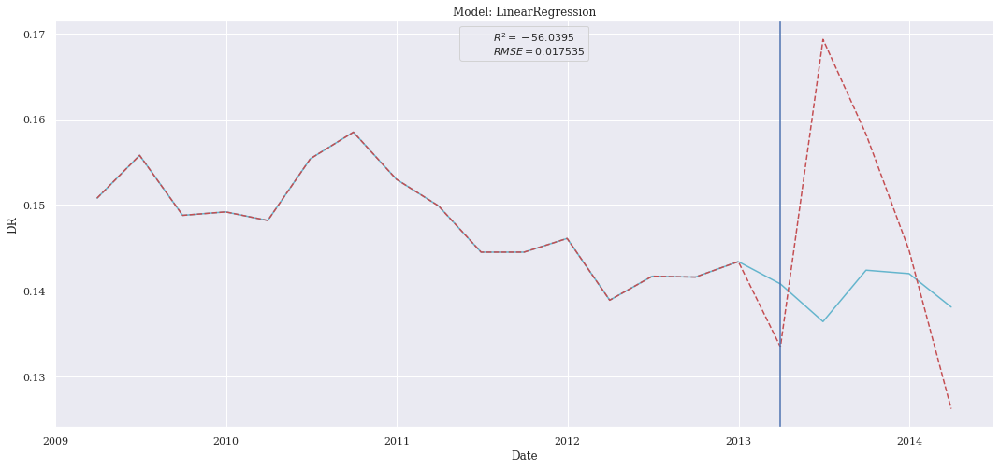

In [36]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [37]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_8_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.008851,0.000078,0.007040,-13.531760
CatBoostRegressor,0.009285,0.000086,0.008839,-14.993494
Ridge,0.010639,0.000113,0.009920,-19.999188
XGBRegressor,0.012340,0.000152,0.009805,-27.250178
KNeighborsRegressor,0.012595,0.000159,0.012388,-28.430499
LinearSVR,0.040947,0.001677,0.030392,-310.044210
LinearRegression,0.043783,0.001917,0.028804,-354.619231


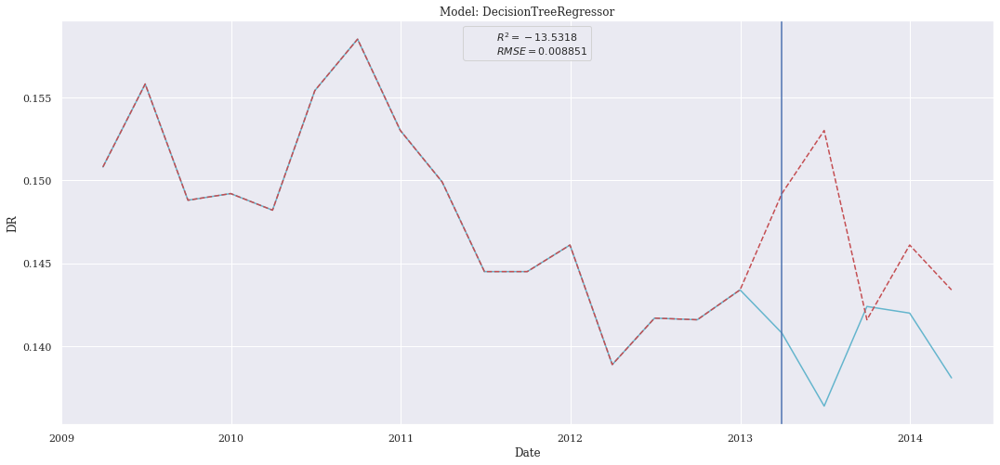

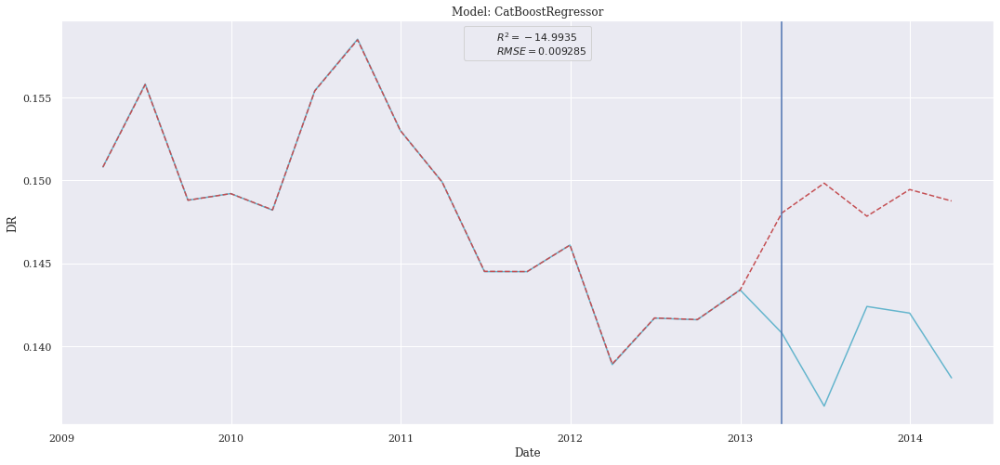

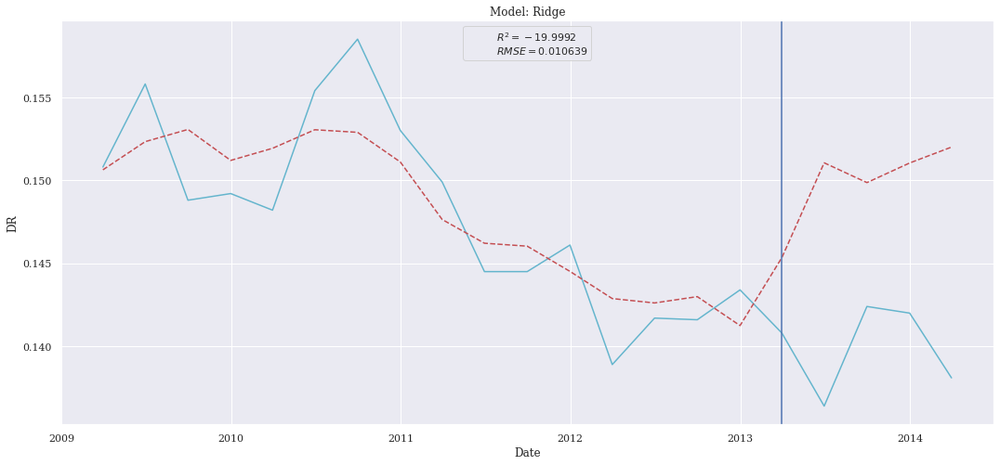

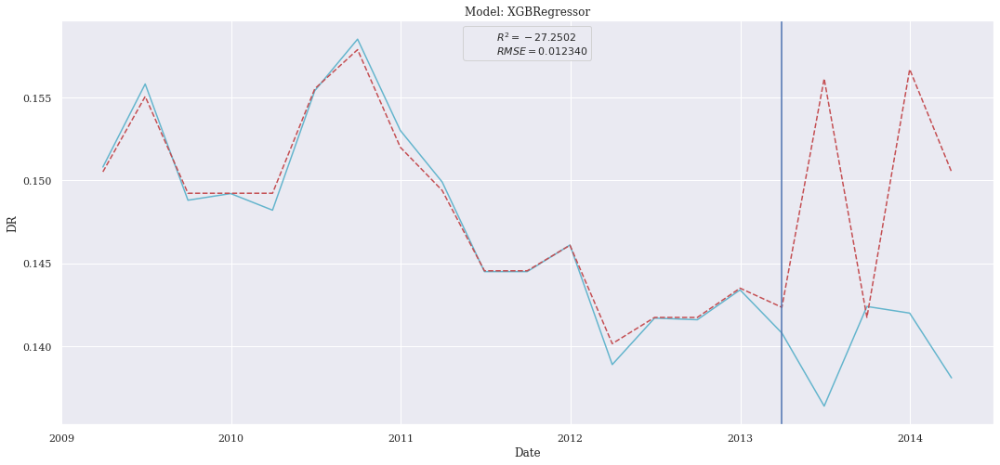

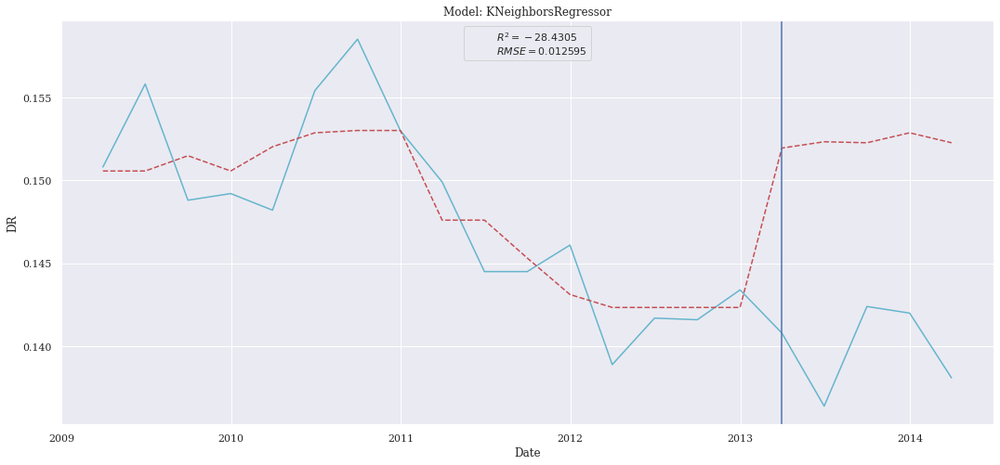

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


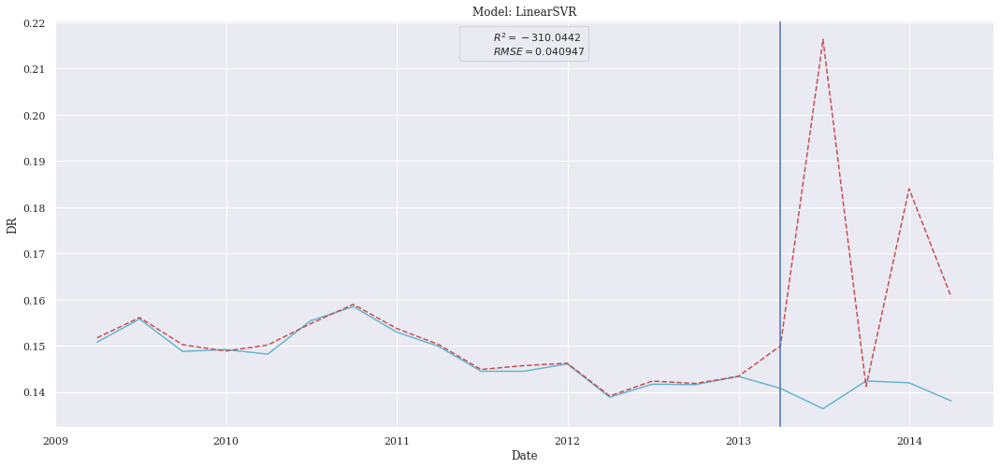

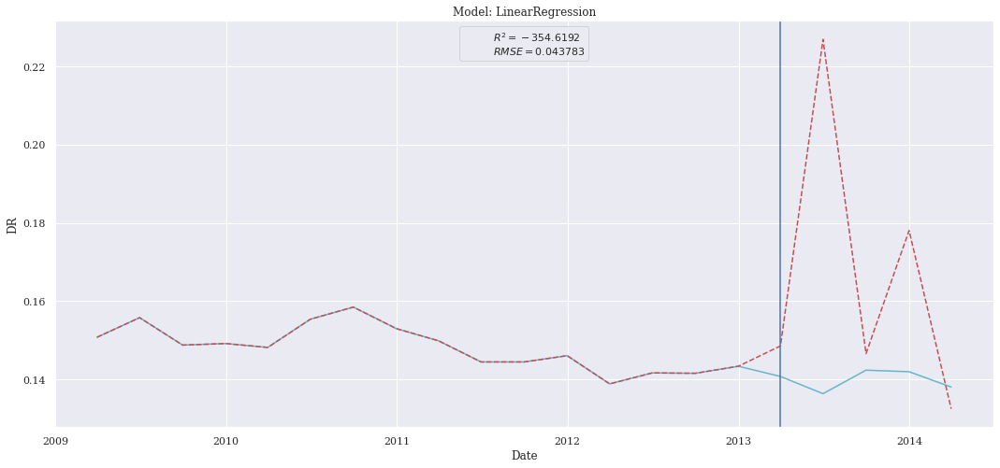

In [38]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [39]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period,chronique,col_used=cl.col_8_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.008414,0.000071,0.007540,-12.134713
CatBoostRegressor,0.009198,0.000085,0.008559,-14.693952
KNeighborsRegressor,0.010456,0.000109,0.009712,-19.282458
XGBRegressor,0.010831,0.000117,0.009426,-20.764555
DecisionTreeRegressor,0.012427,0.000154,0.011400,-27.649451
LinearRegression,0.019841,0.000394,0.018270,-72.032490
LinearSVR,0.024925,0.000621,0.019892,-114.247862


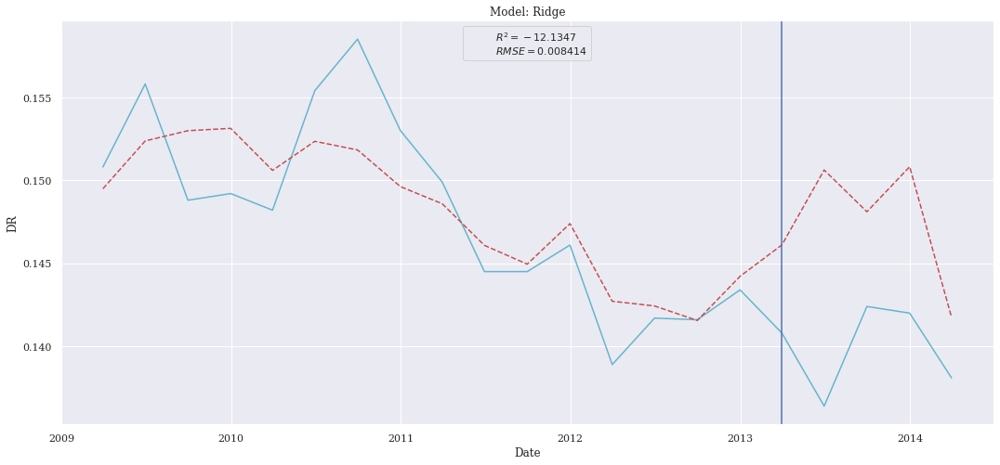

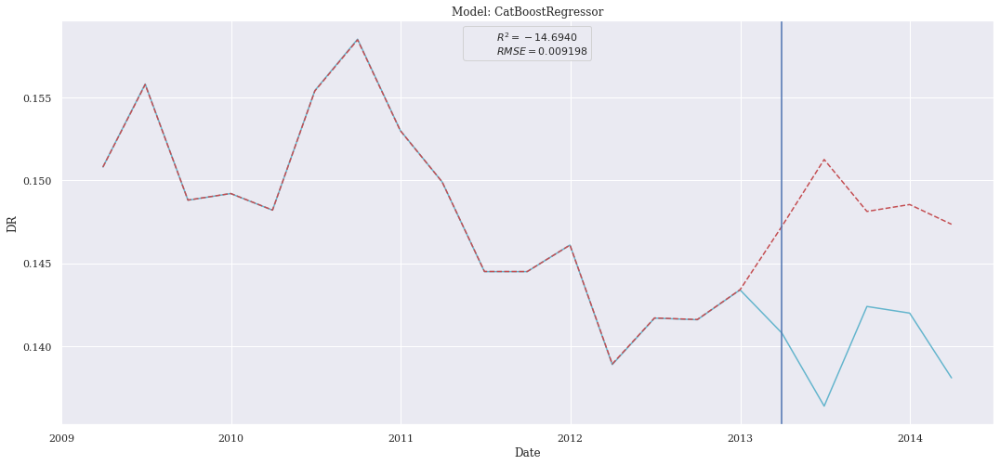

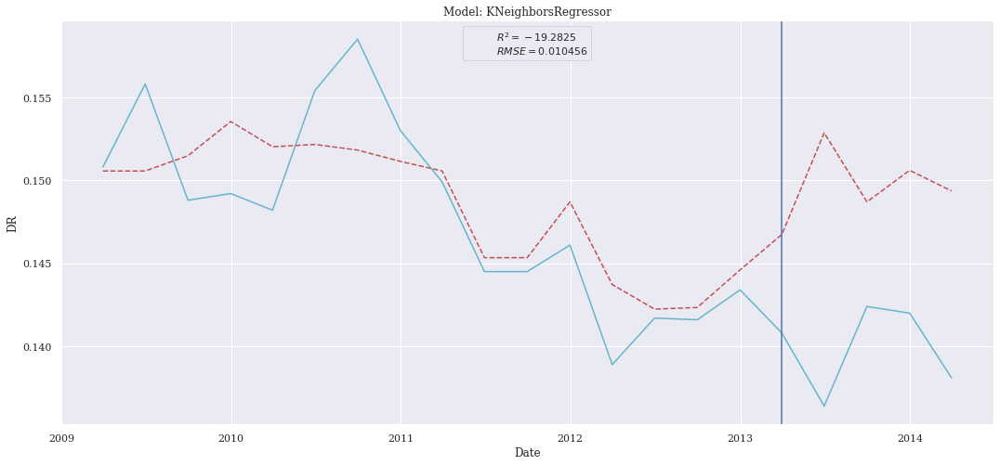

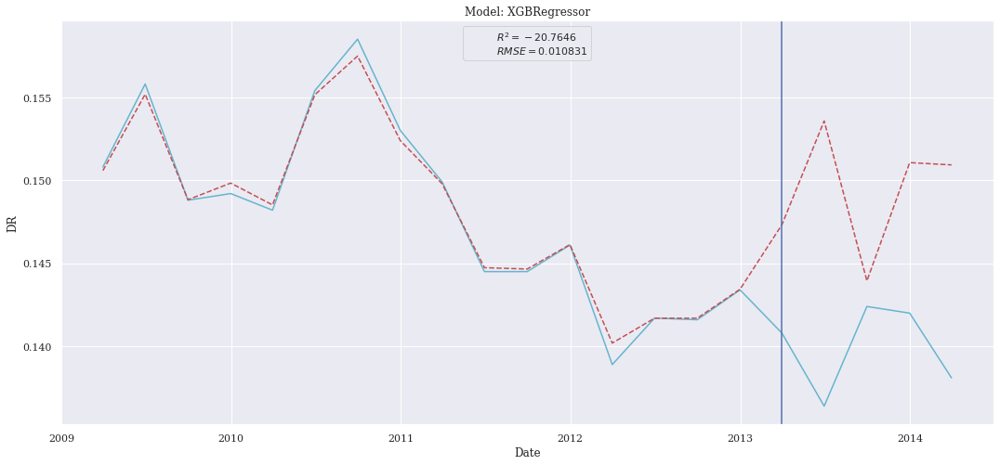

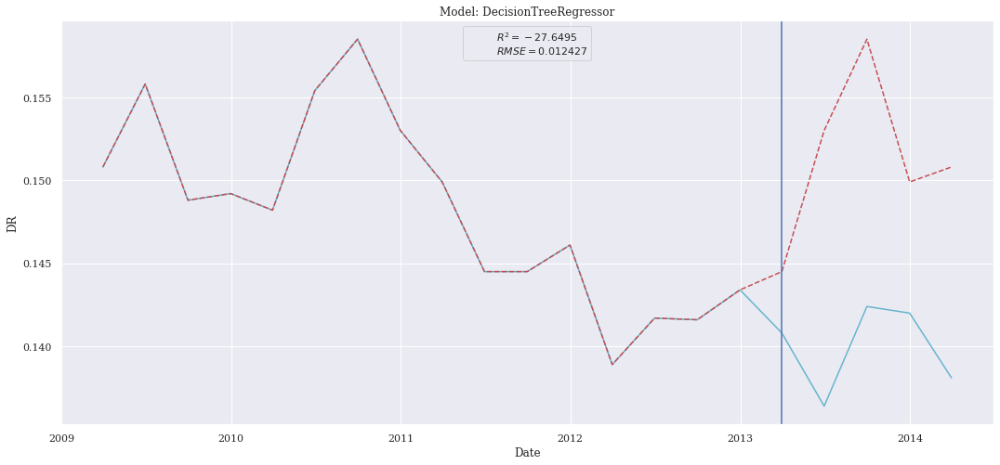

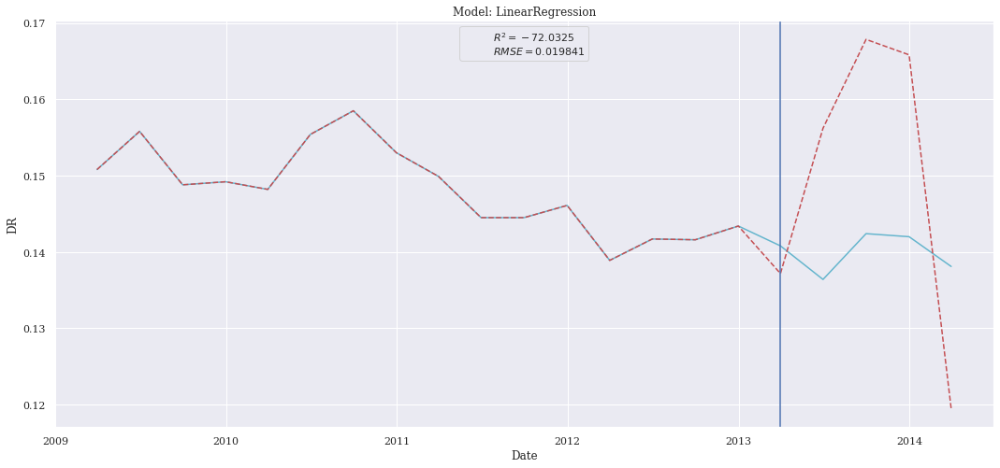

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


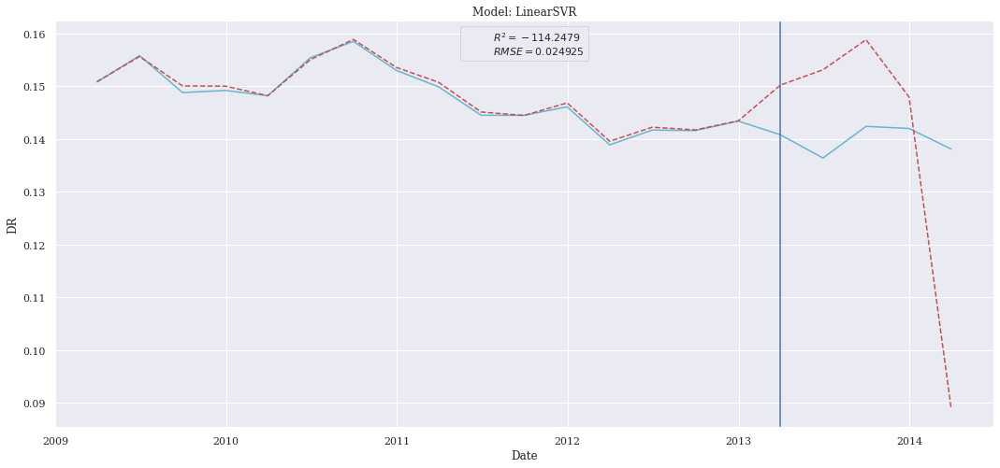

In [40]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [41]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.008345,0.000070,0.007352,-11.919344
CatBoostRegressor,0.009318,0.000087,0.008644,-15.109069
XGBRegressor,0.010208,0.000104,0.008559,-18.330548
KNeighborsRegressor,0.010997,0.000121,0.010476,-21.434357
DecisionTreeRegressor,0.011226,0.000126,0.009880,-22.380083
LinearSVR,0.018856,0.000356,0.015037,-64.956435
LinearRegression,0.019633,0.000385,0.017729,-70.505879


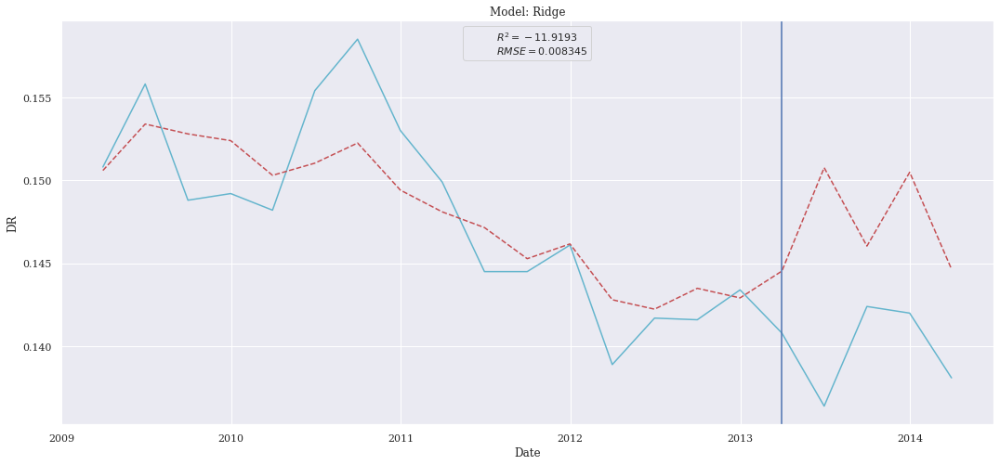

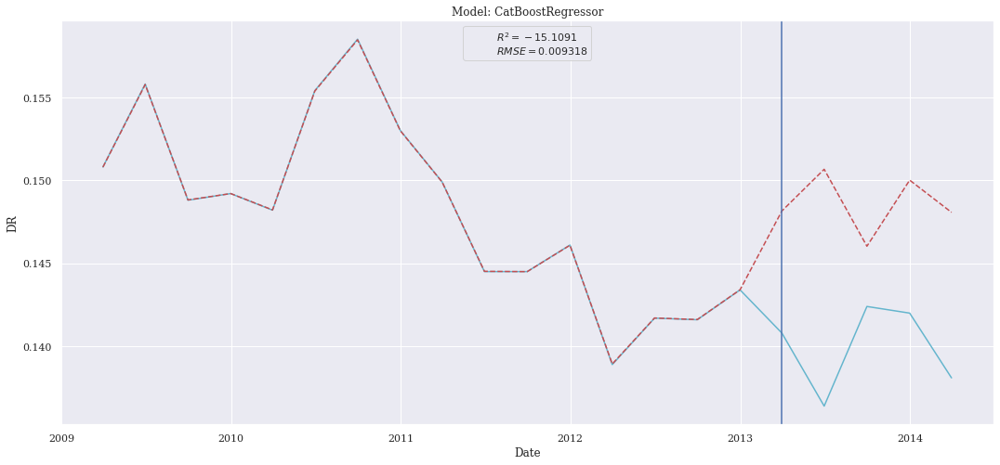

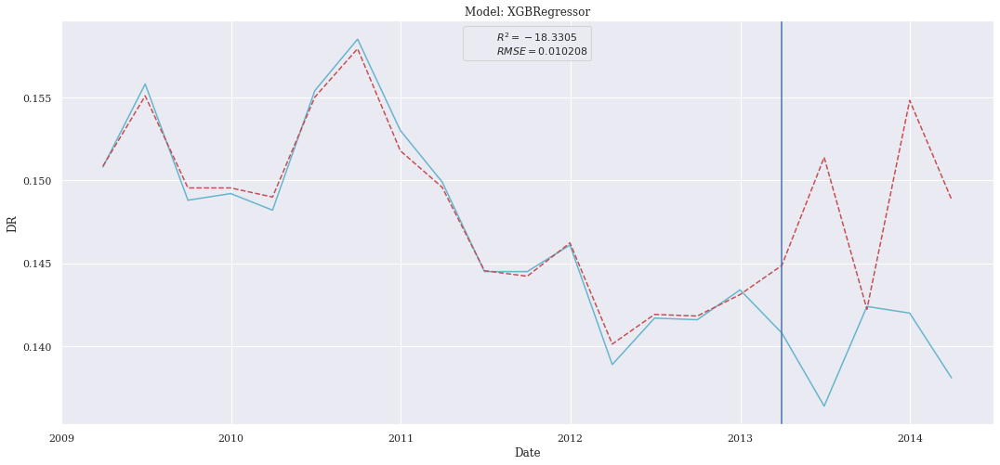

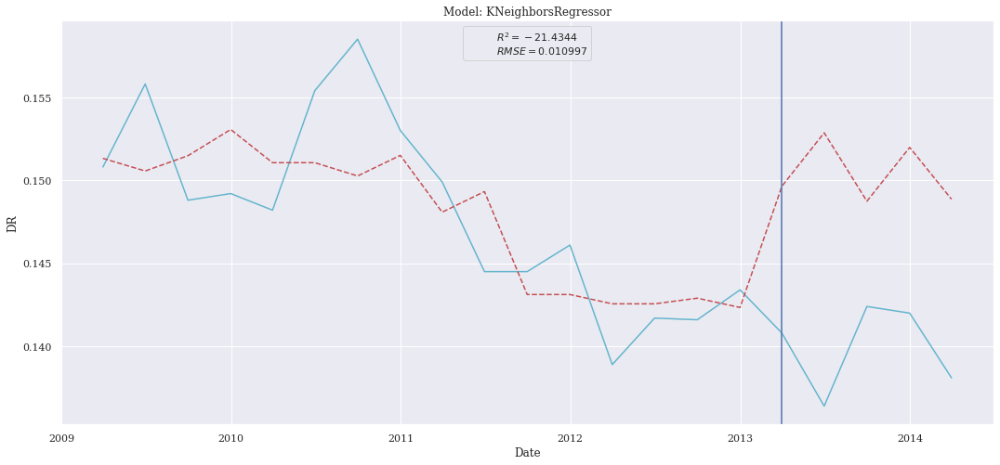

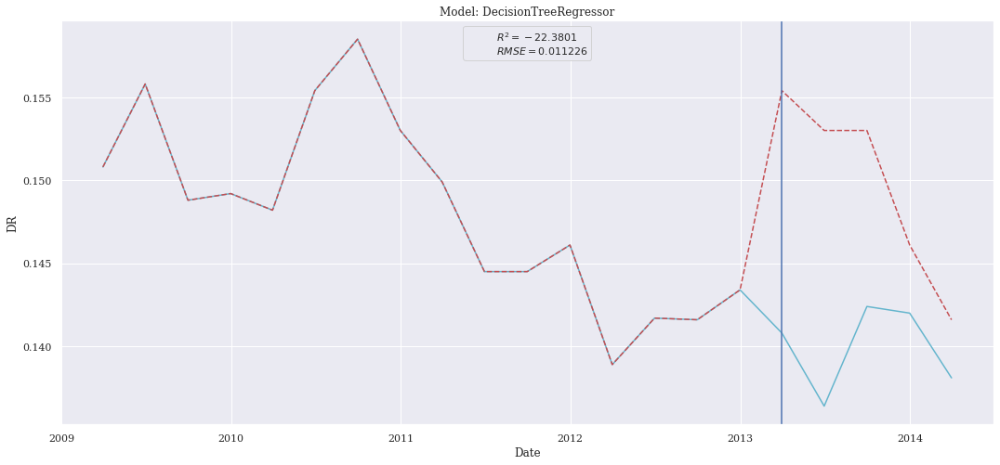

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


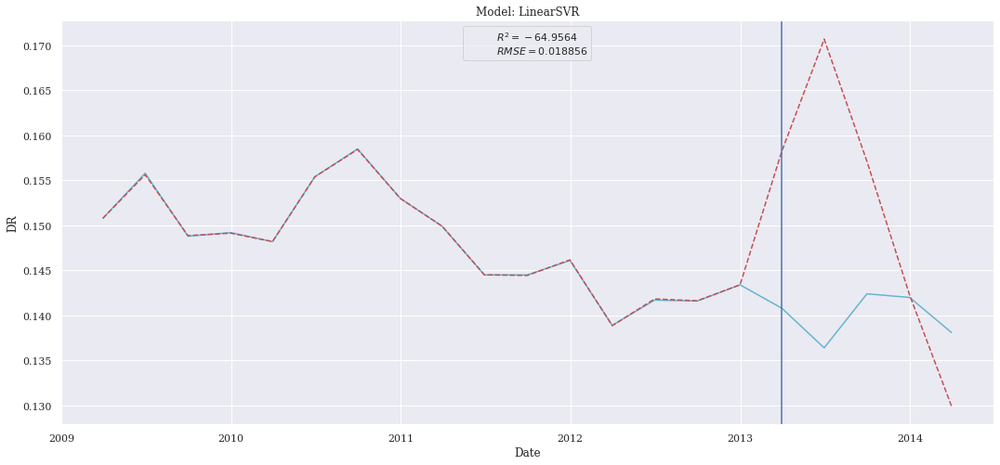

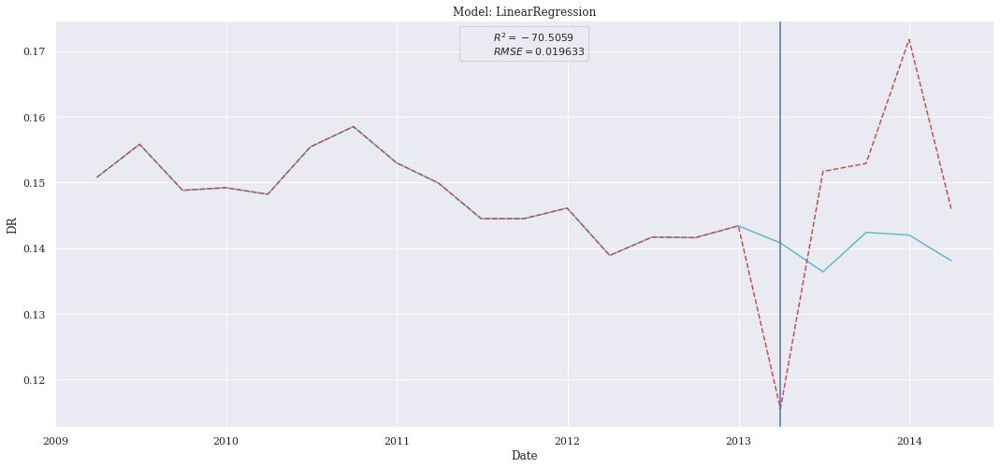

In [42]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
Ridge and DecisionTree give the best results for Kbest features and Sequential Forward Features, so we will use these two models for the GridSearch

### GridSearch on DecisionTree

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR8",col_used=cl.col_8_seq_for,split=split,norm=norm)
params_tre = {"criterion":["squared_error","friedman_mse","absolute_error","poisson"],"splitter":["best"],"max_features":["auto","sqrt","log2"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"tre",parameters=params_tre,metric='r2')
print(params,score)

NameError: ignored

In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["tre"],parameters={"p_tre":params})
summary

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on Ridge

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR8",col_used=cl.col_8_kbest,split=split,norm=norm)
params_rid = {"alpha":[1],"fit_intercept":[True,False],"solver":["auto","svd","cholesky","lsqr","sparse_cg","sag","saga"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"rid",parameters=params_rid)
print(params,score)

In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["rid"],parameters={"p_rid":params})
summary

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the DecisionTree model but not for the Ridge. With the Grid we obtain a r2 equals to -1.007 against -1.95 before GridSearch. Concerning the rmse is now 0.003289 against 0.003982.

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.007563,0.000057,0.007264,-9.610997
Ridge,0.007698,0.000059,0.006190,-9.994203
KNeighborsRegressor,0.008714,0.000076,0.008172,-13.085827
XGBRegressor,0.009451,0.000089,0.008653,-15.571811
DecisionTreeRegressor,0.009647,0.000093,0.007820,-16.264396
LinearSVR,0.020272,0.000411,0.015724,-75.236838
LinearRegression,0.045146,0.002038,0.044147,-377.113043


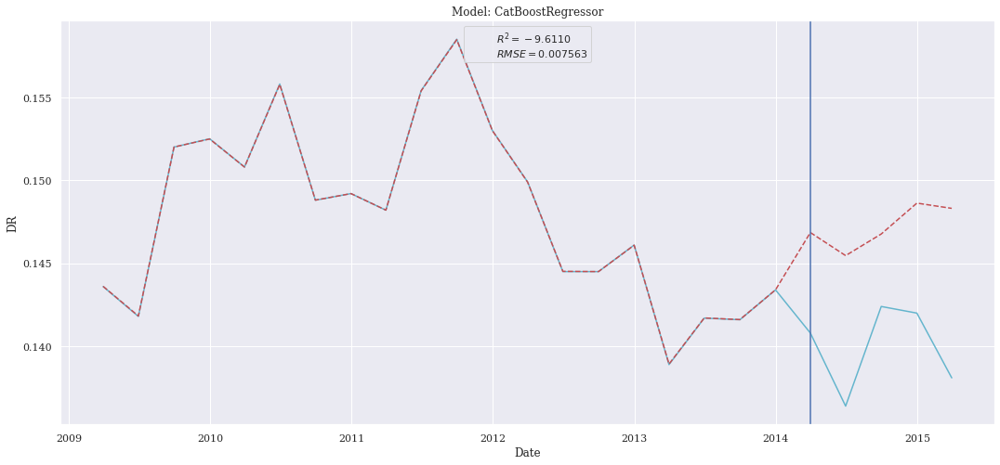

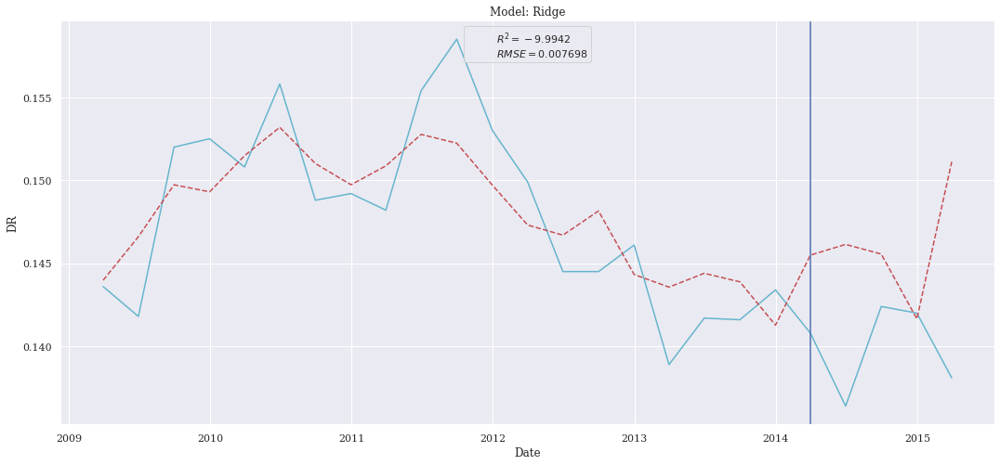

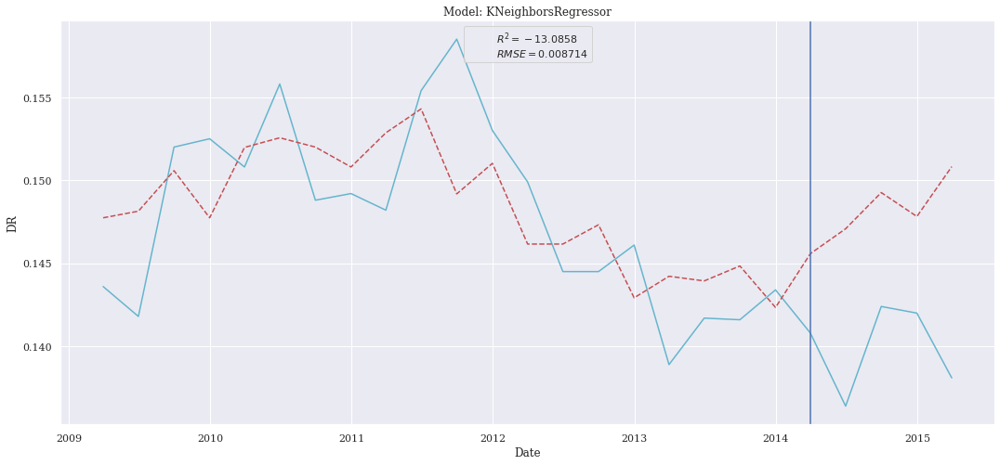

[14:46:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


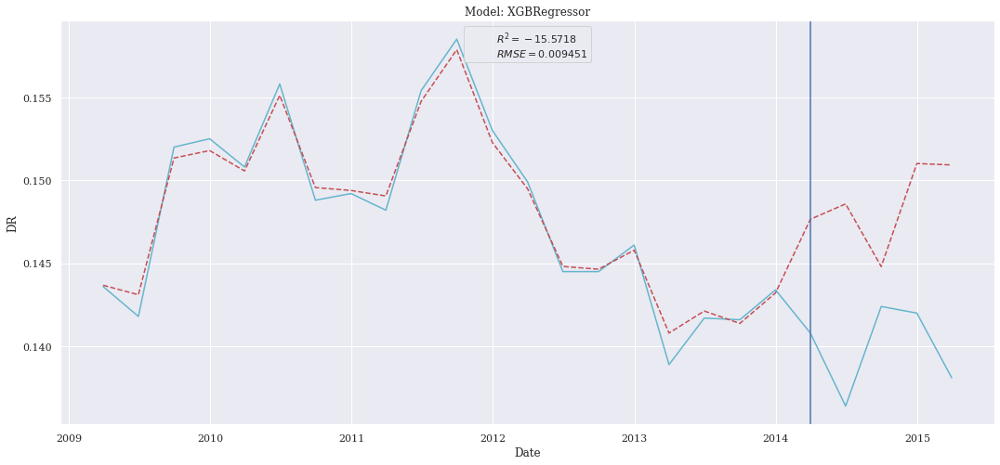

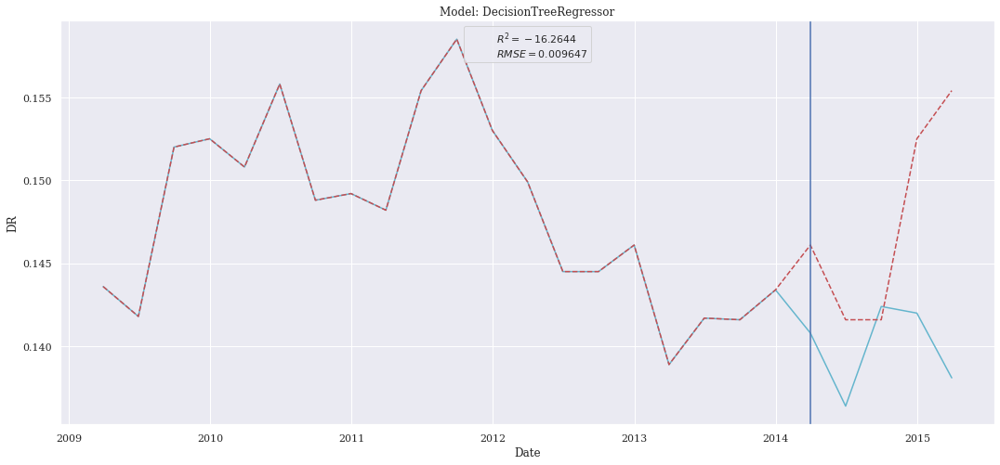

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


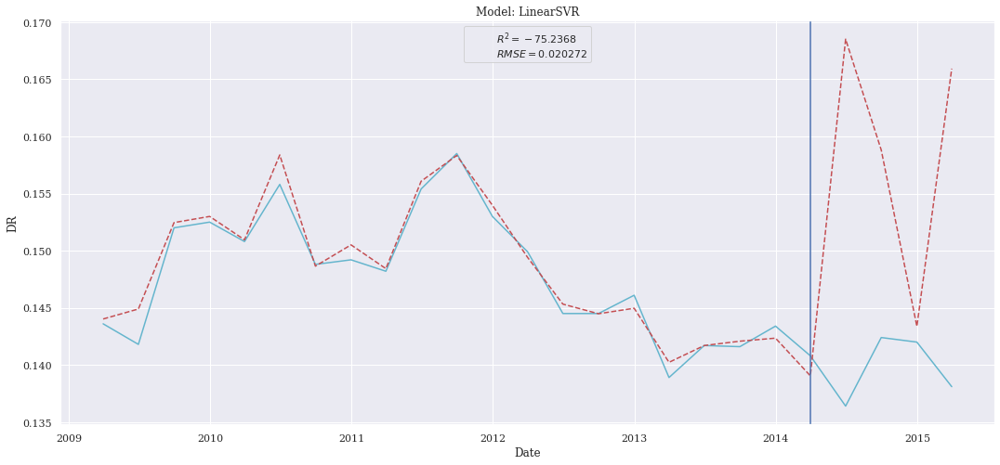

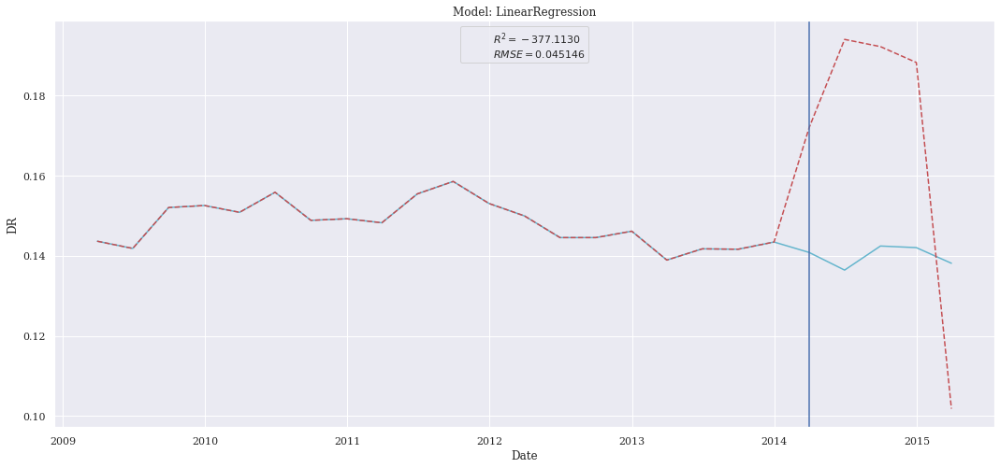

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

# Focus on Chronique Totale

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [43]:
chronique=b'Totale'
start = 1
norm = "MinMax"
split = 0.2
period = 12
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train,X_test], axis=1).index

### Correlation Features

In [44]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique=chronique,col_used=cl.col_totale_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.001955,0.000004,0.001948,-21.527830
CatBoostRegressor,0.002132,0.000005,0.002127,-25.789062
Ridge,0.002197,0.000005,0.002187,-27.454496
XGBRegressor,0.002224,0.000005,0.002217,-28.158112
DecisionTreeRegressor,0.002407,0.000006,0.002400,-33.150943
LinearSVR,0.004097,0.000017,0.003837,-97.957731
LinearRegression,0.004117,0.000017,0.003690,-98.915170


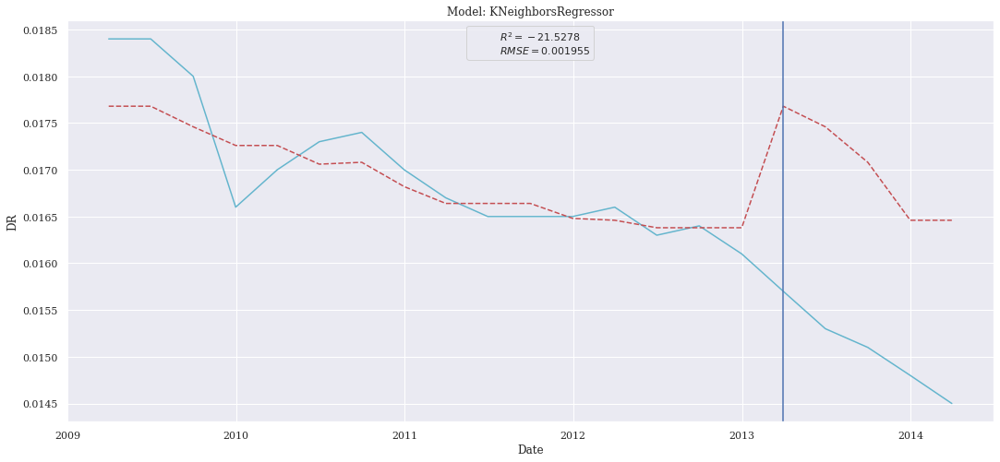

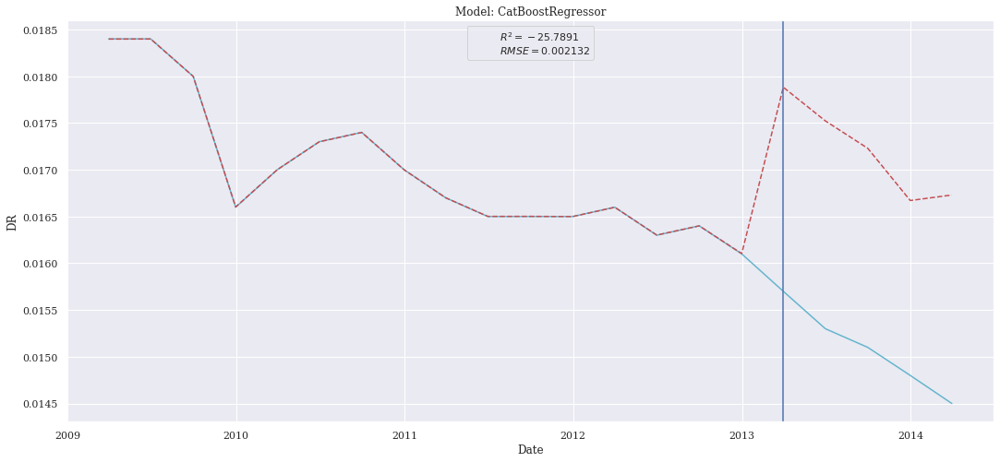

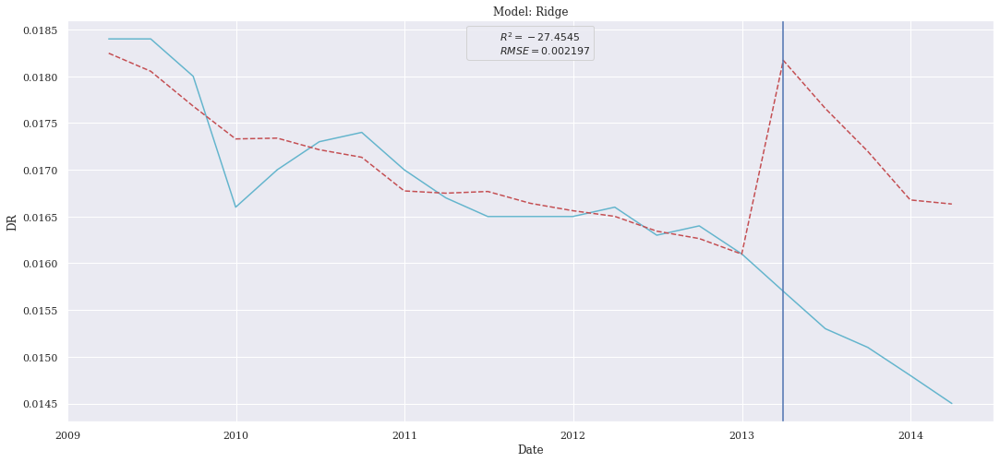

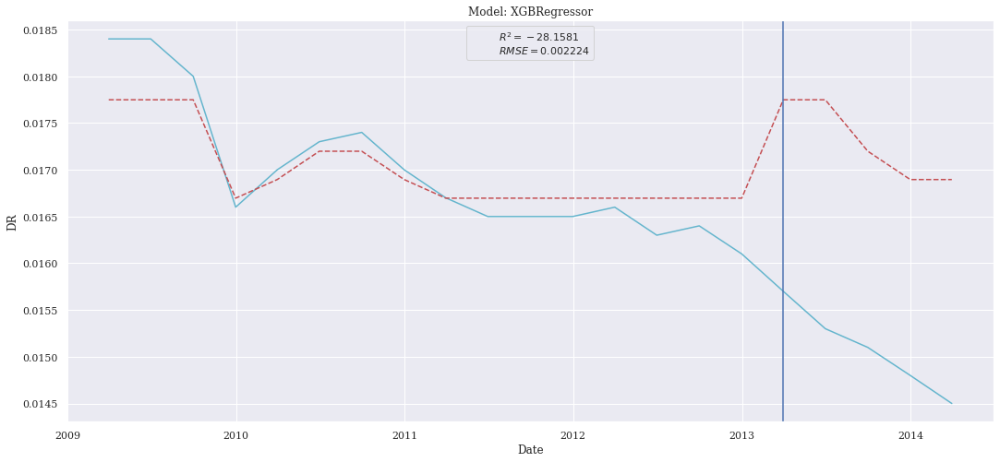

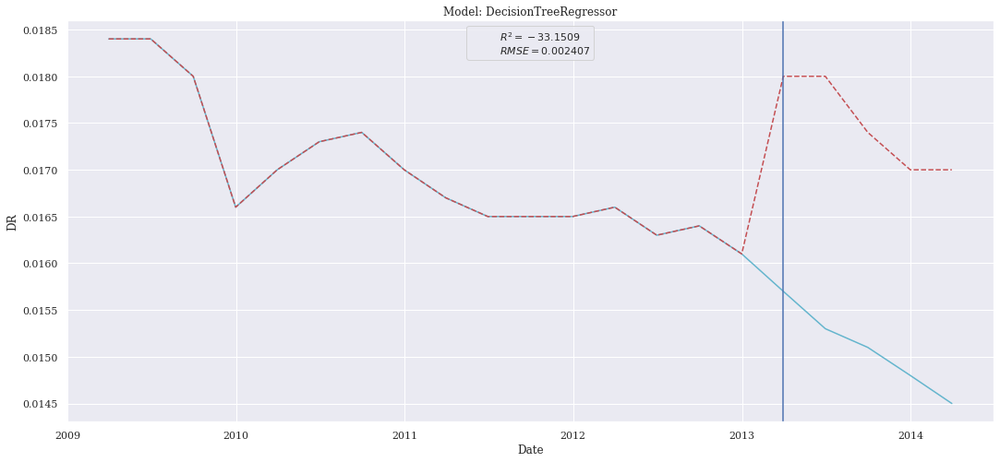

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


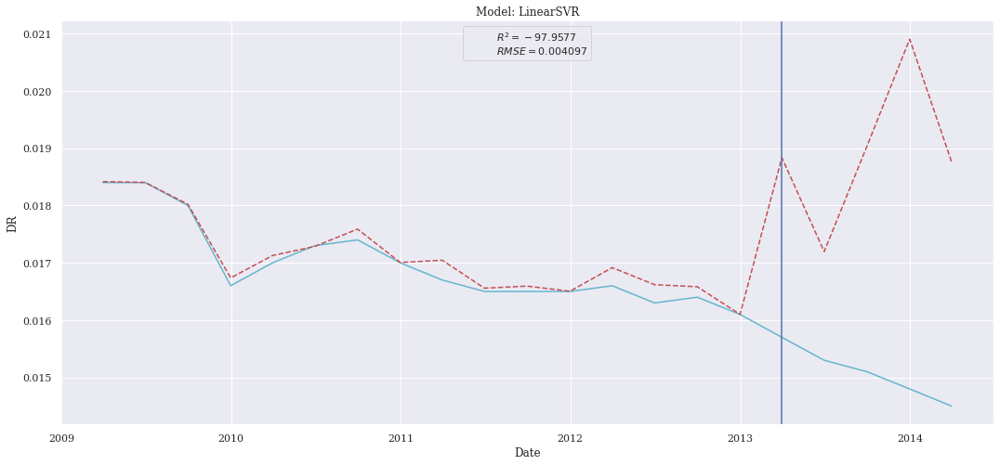

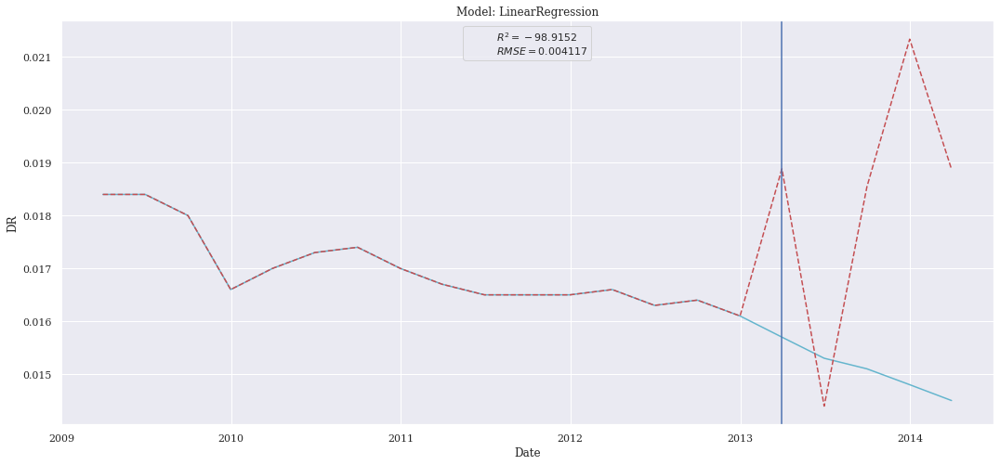

In [45]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [47]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period, chronique,col_used=cl.col_totale_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

AttributeError: module 'datas.selected_columns_12' has no attribute 'col_totale_low_var'

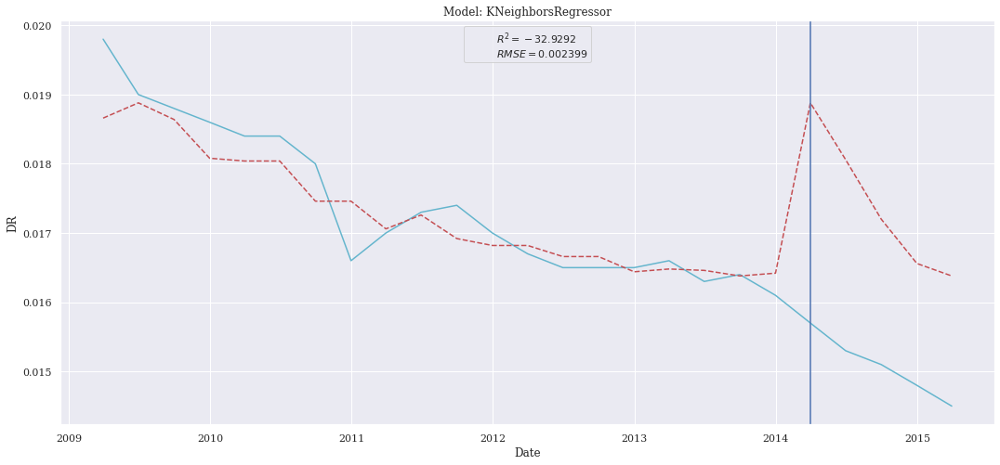

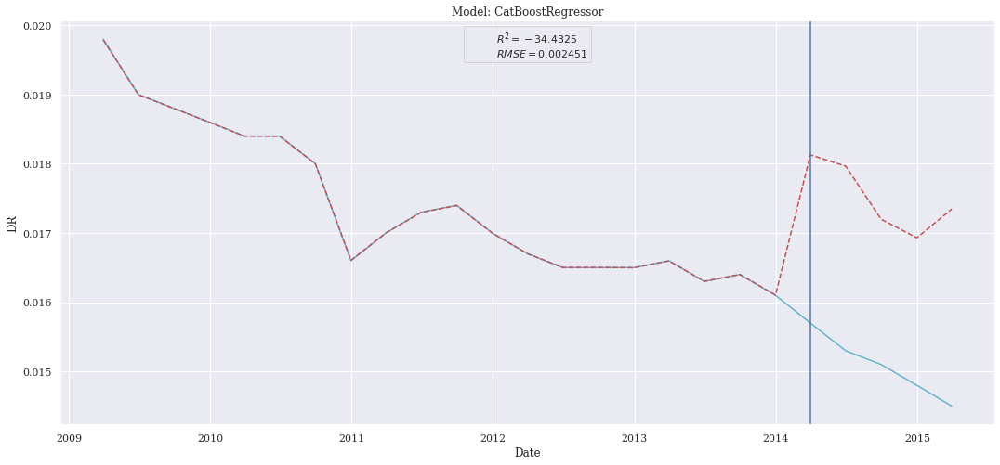

[14:46:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


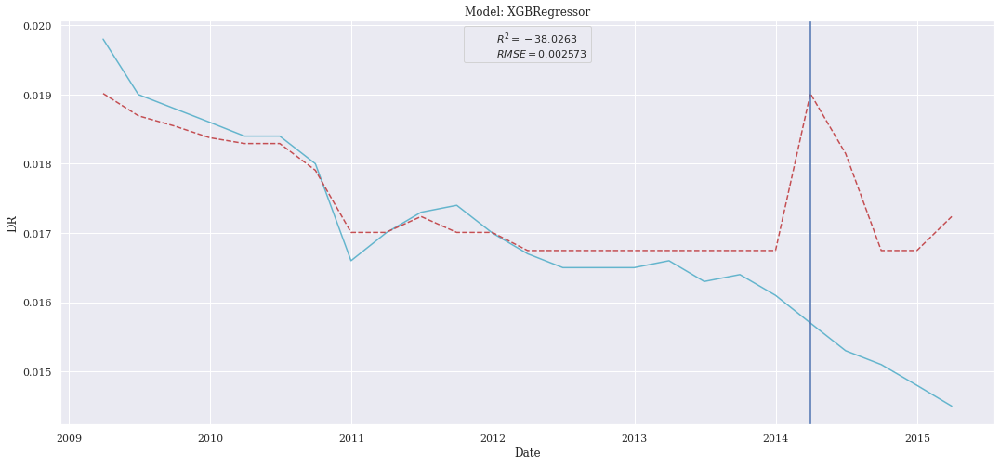

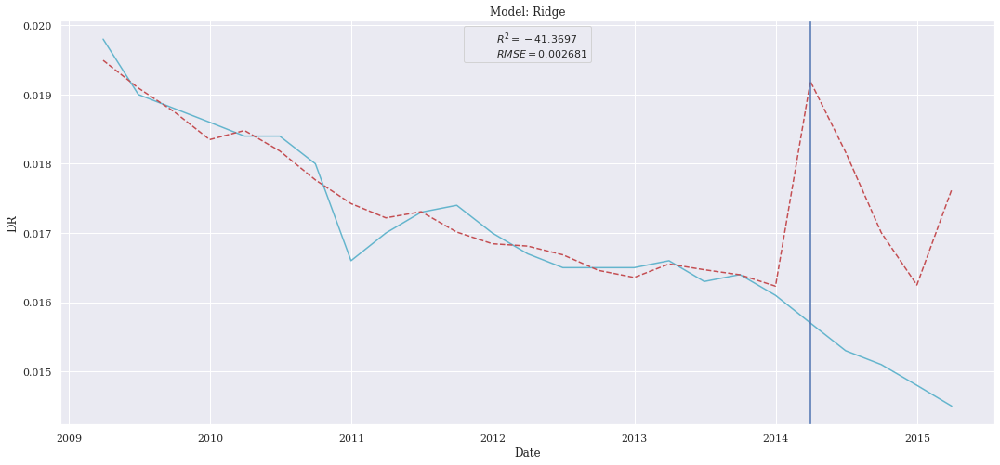

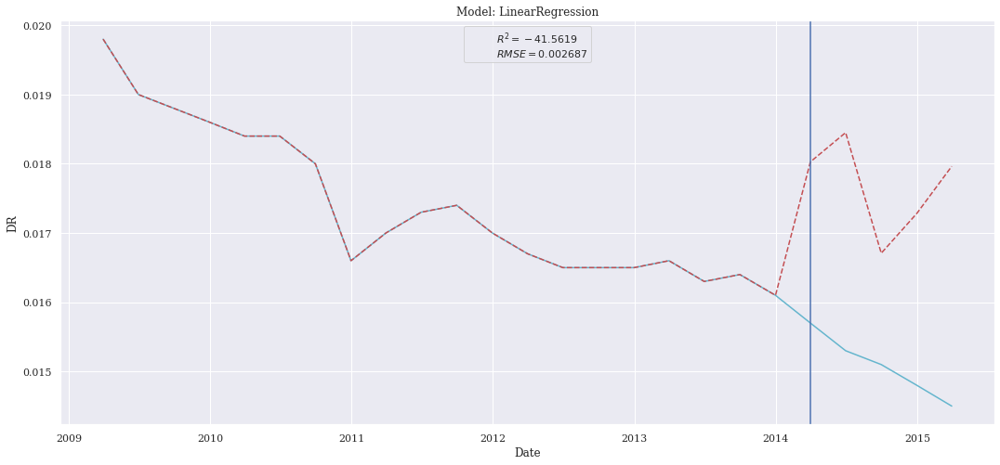

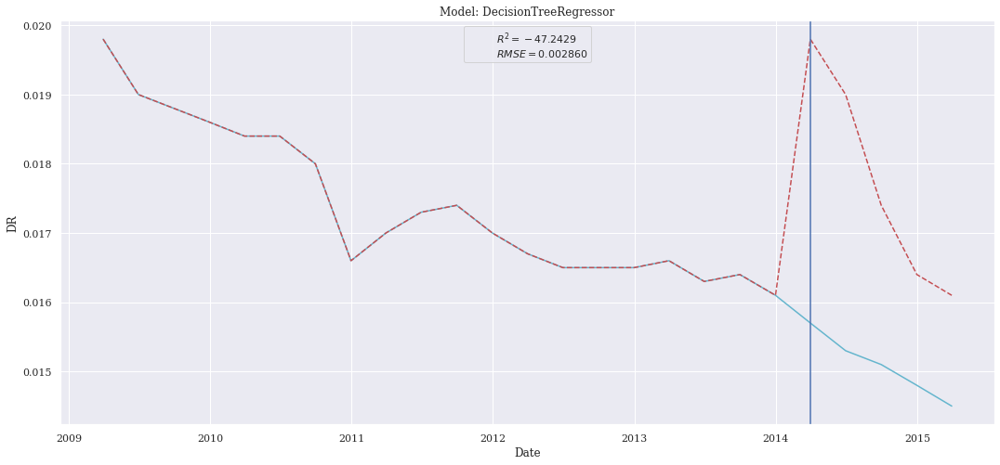

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


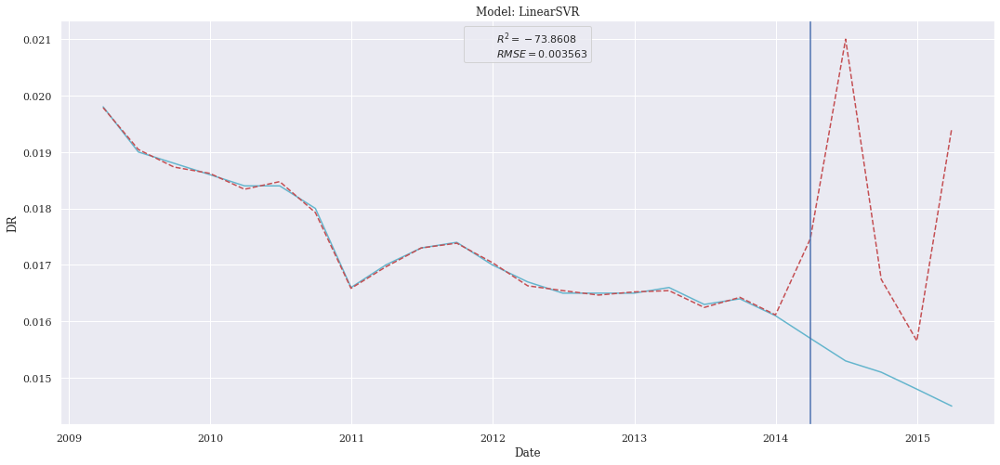

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### KBest Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.002494,0.000006,0.002412,-35.688208
Ridge,0.002534,0.000006,0.002493,-36.853754
CatBoostRegressor,0.002589,0.000007,0.002549,-38.513171
DecisionTreeRegressor,0.002598,0.000007,0.002260,-38.799528
XGBRegressor,0.002736,0.000007,0.002699,-43.123570
LinearSVR,0.003336,0.000011,0.003163,-64.620406
LinearRegression,0.004564,0.000021,0.002804,-121.797795


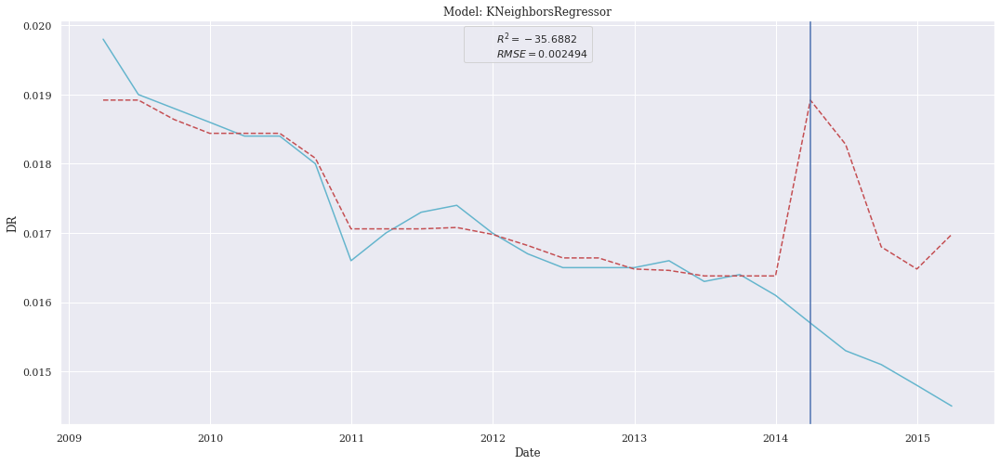

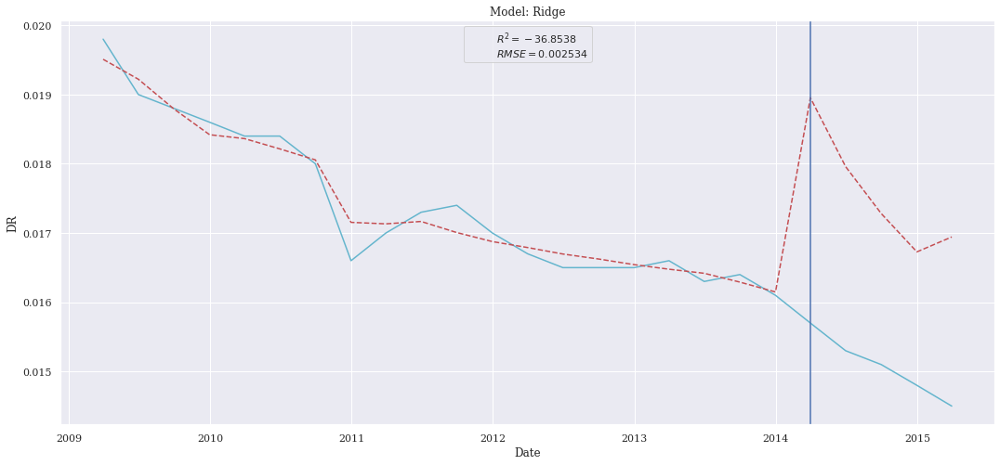

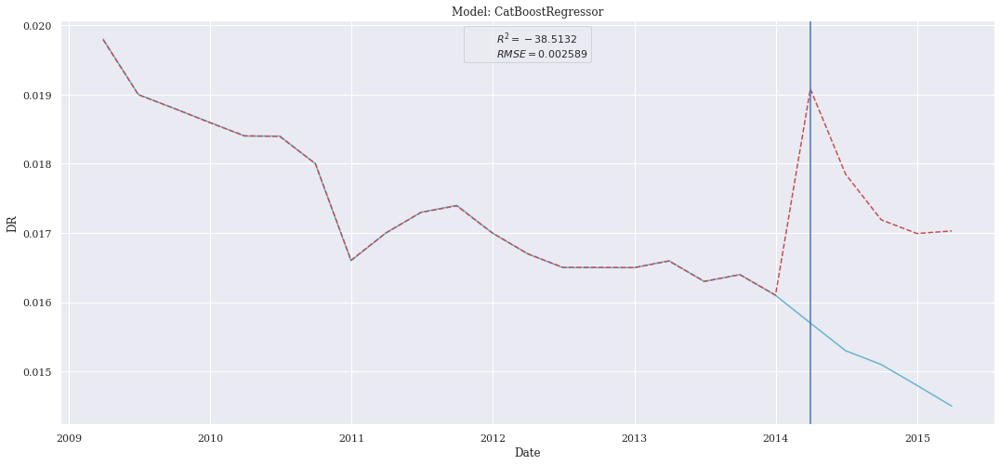

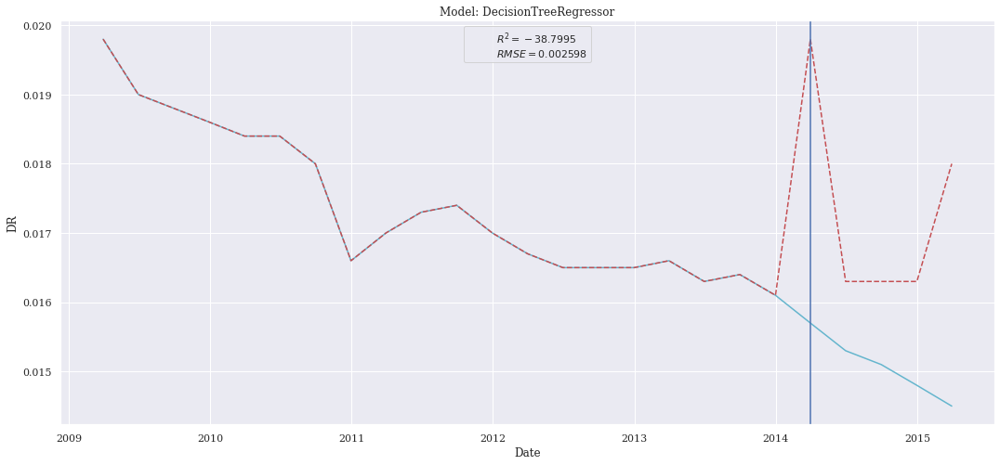

[14:46:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


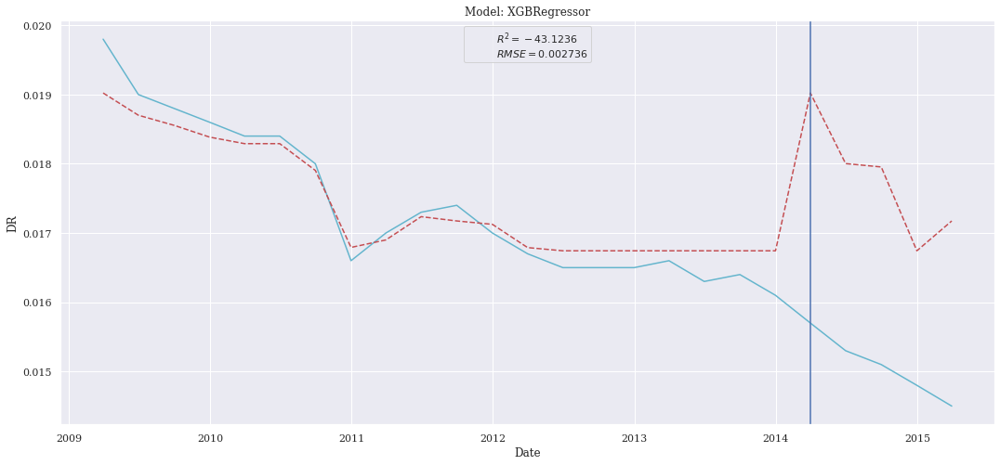

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


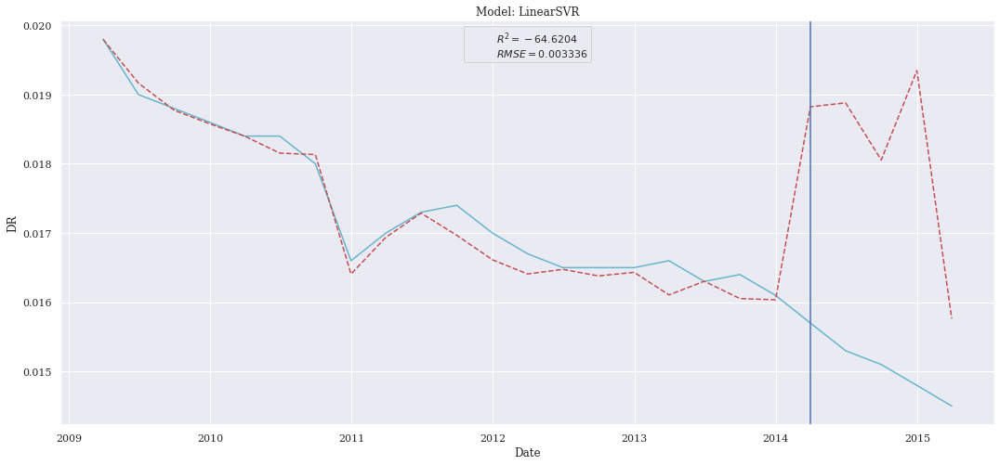

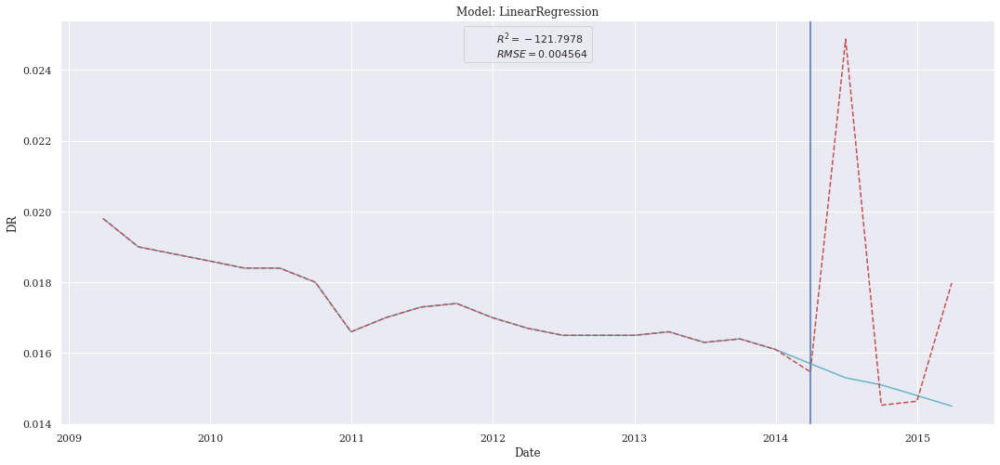

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Recursive Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001667,0.000003,0.001580,-15.379717
XGBRegressor,0.002692,0.000007,0.002663,-41.740864
CatBoostRegressor,0.002702,0.000007,0.002696,-42.061608
Ridge,0.002719,0.000007,0.002713,-42.604206
KNeighborsRegressor,0.003221,0.000010,0.003212,-60.158019
LinearRegression,0.004710,0.000022,0.003822,-129.795601
LinearSVR,0.004991,0.000025,0.004644,-145.888433


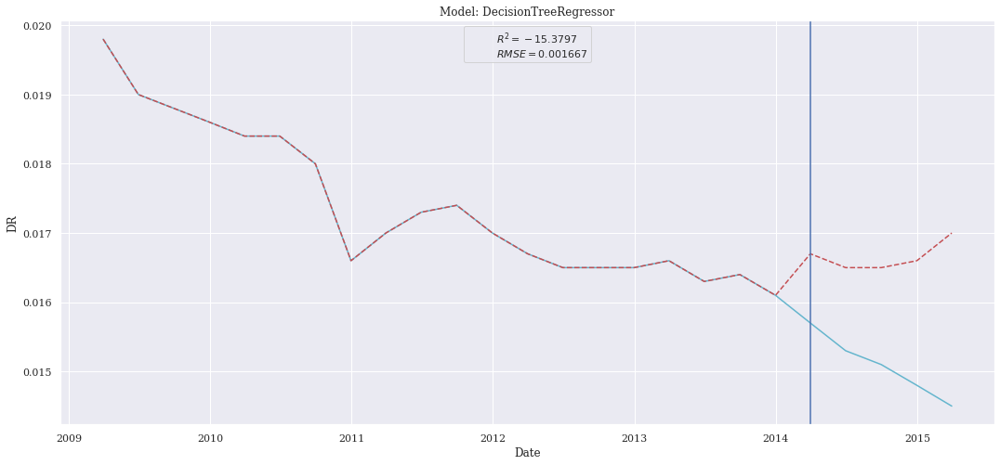

[14:46:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


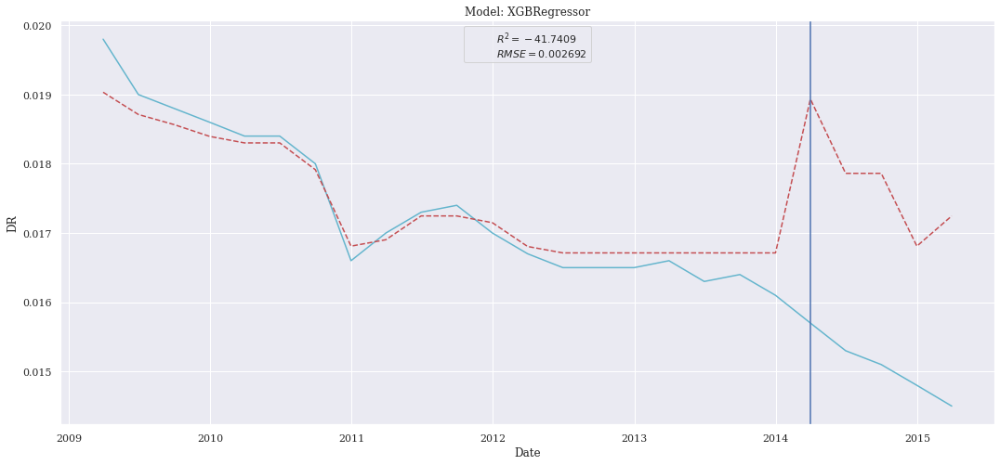

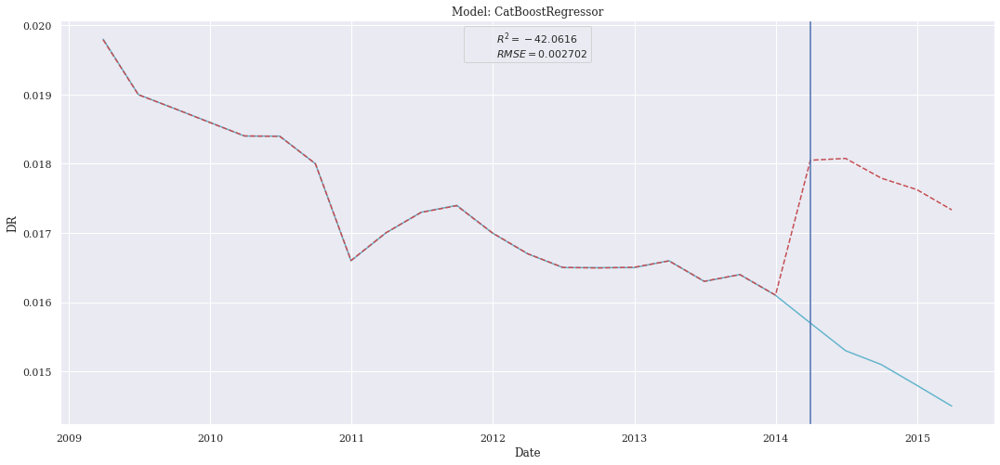

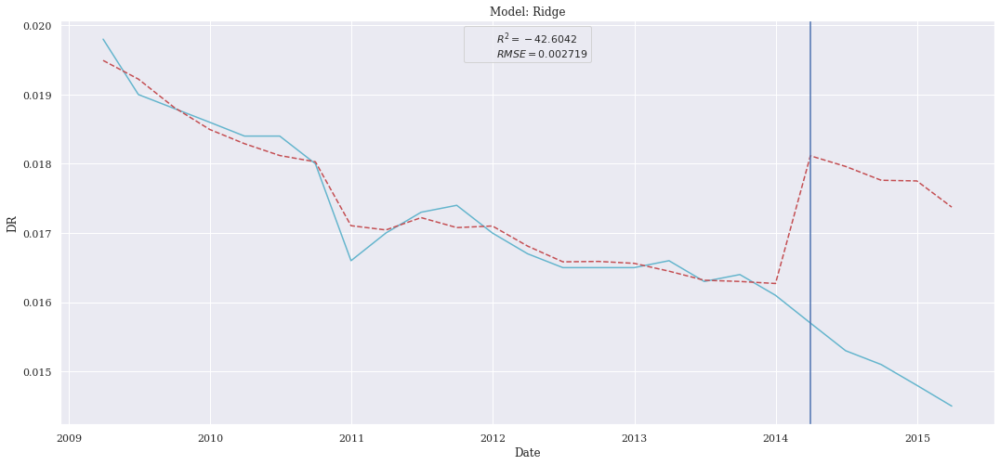

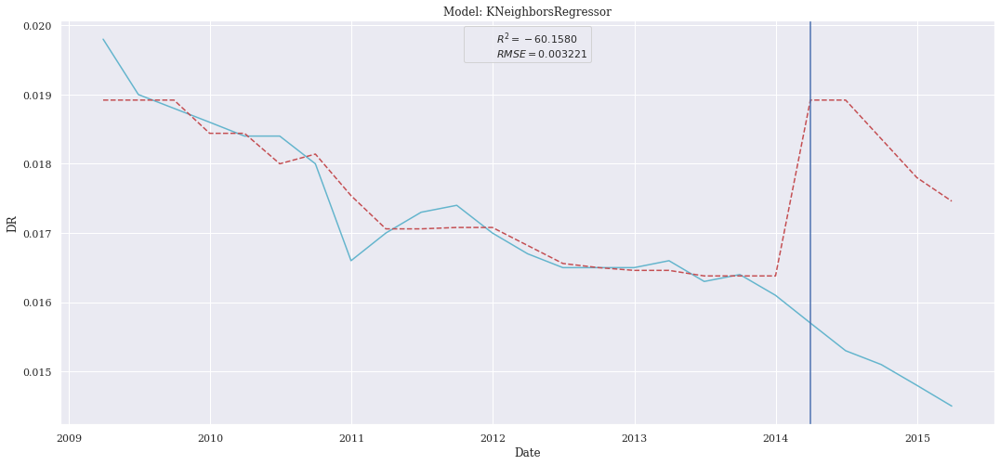

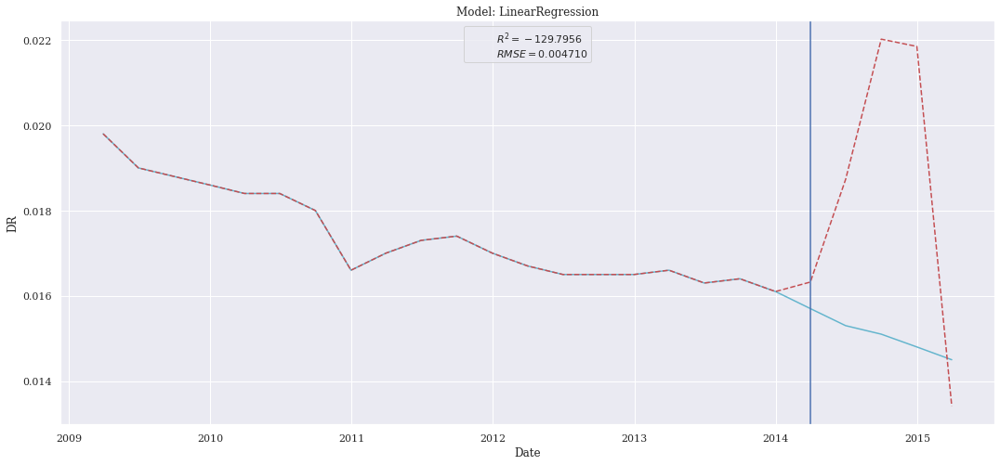

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


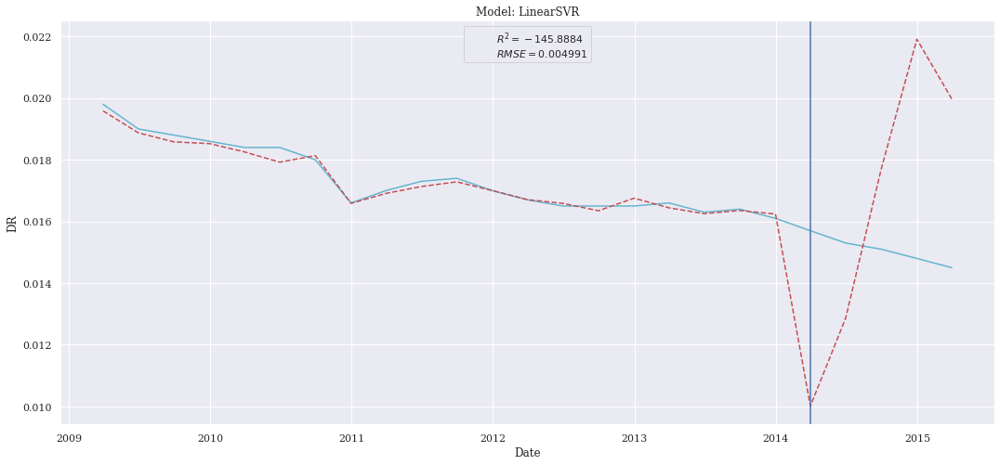

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  tl.plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001774,0.000003,0.001555,-17.550539
KNeighborsRegressor,0.001999,0.000004,0.001988,-22.572170
Ridge,0.002136,0.000005,0.002075,-25.890414
CatBoostRegressor,0.002191,0.000005,0.002175,-27.302359
LinearRegression,0.002302,0.000005,0.001939,-30.248124
DecisionTreeRegressor,0.002628,0.000007,0.002500,-39.719340
XGBRegressor,0.002660,0.000007,0.002576,-40.703862


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


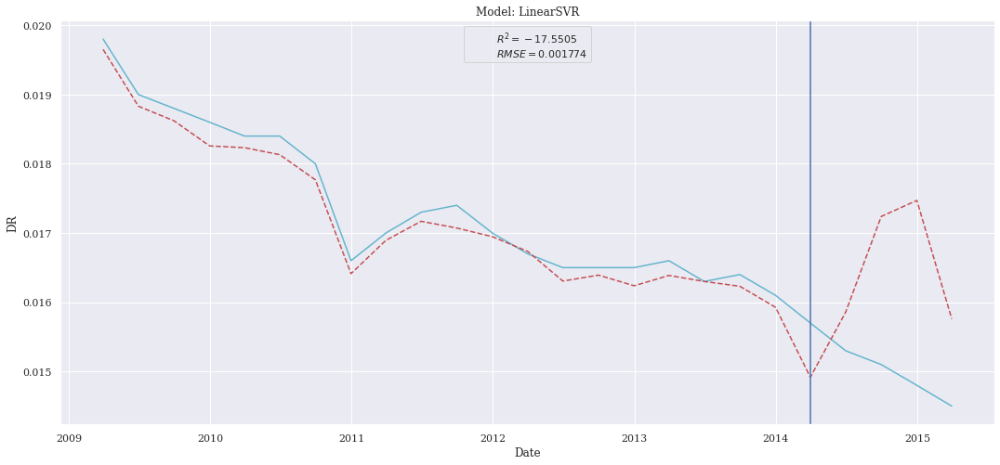

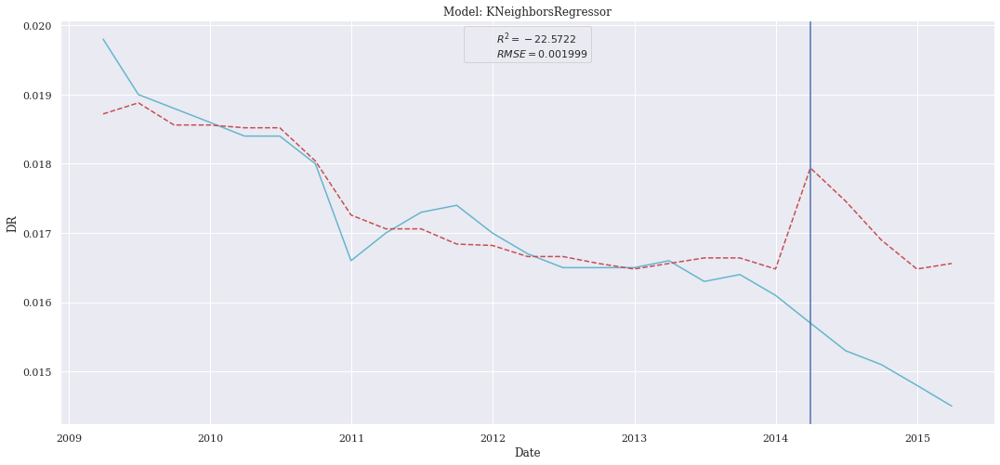

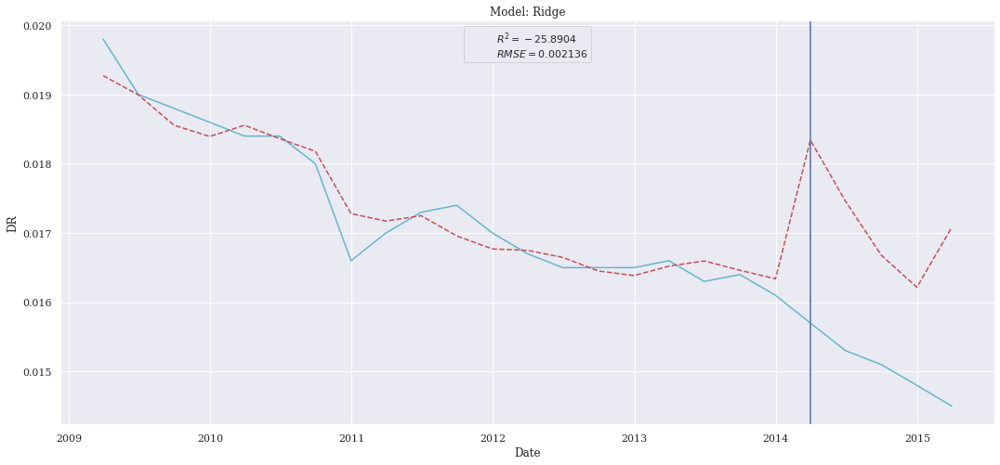

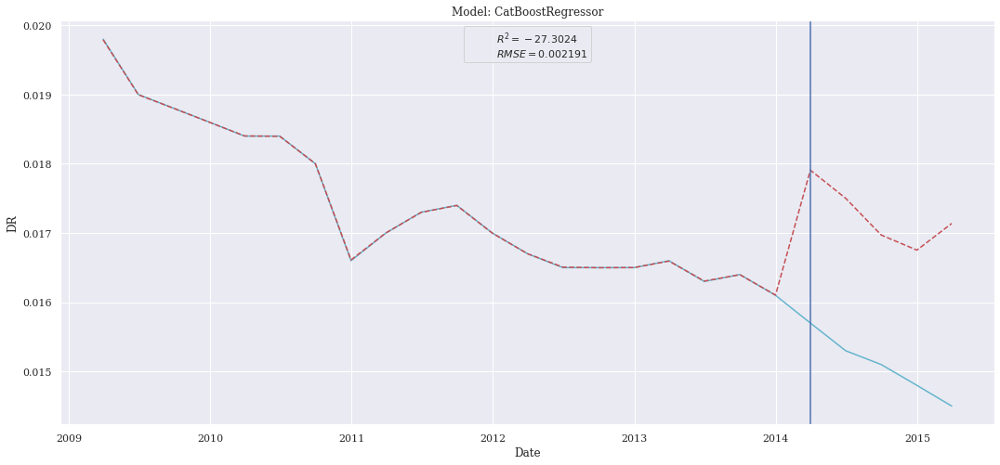

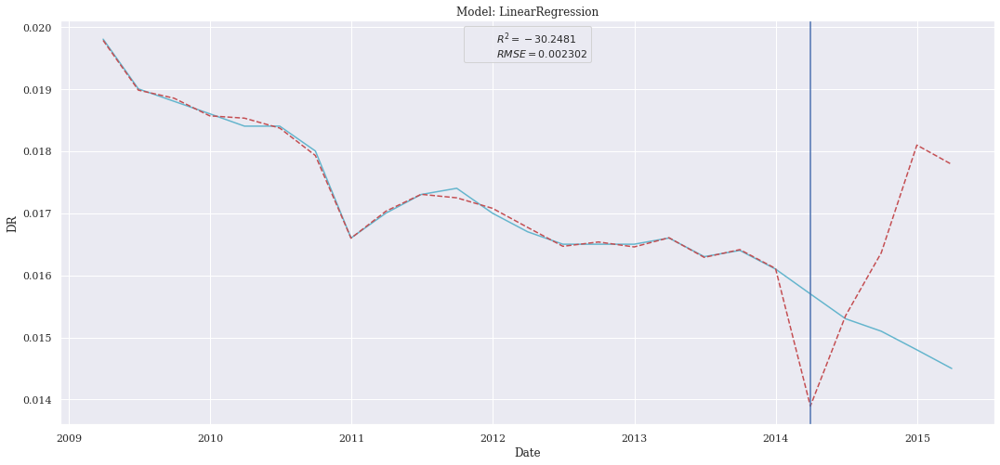

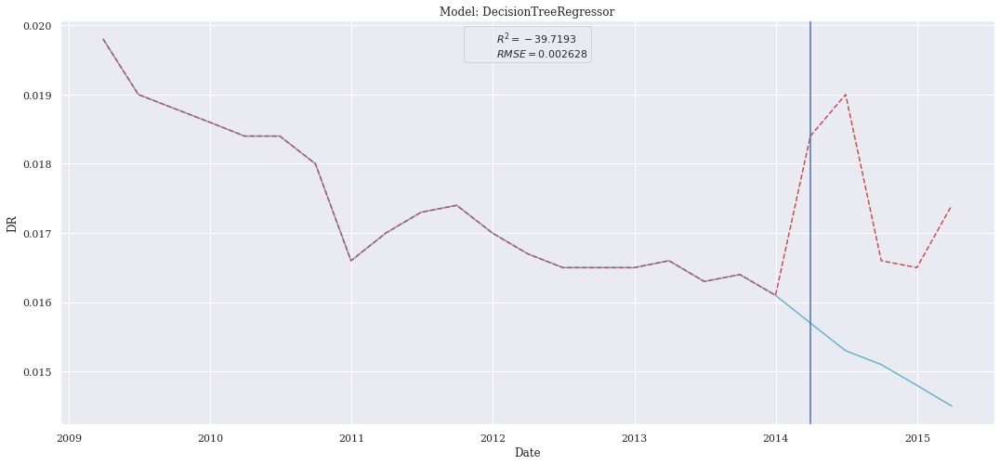

[14:47:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:47:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


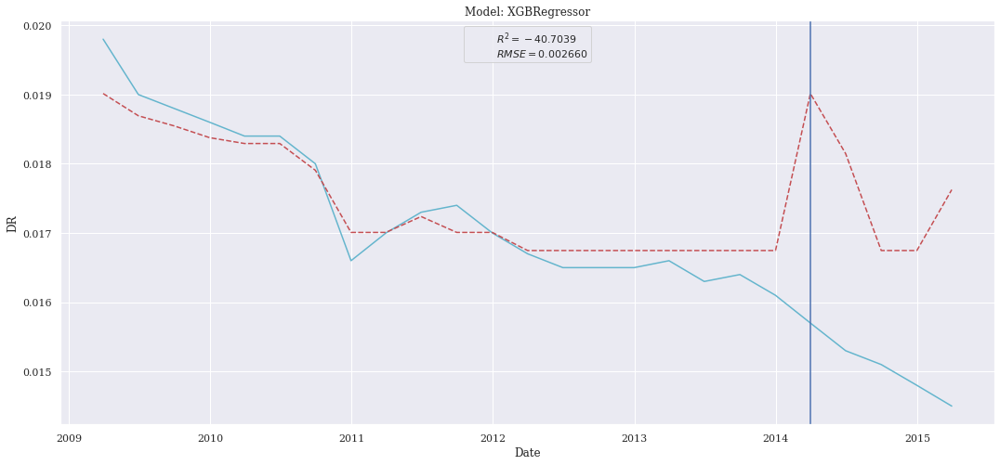

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:47:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.002479,0.000006,0.002428,-35.227830
CatBoostRegressor,0.002480,0.000006,0.002479,-35.275304
Ridge,0.002503,0.000006,0.002490,-35.926890
XGBRegressor,0.002710,0.000007,0.002674,-42.305116
DecisionTreeRegressor,0.003090,0.000010,0.002900,-55.308962
LinearRegression,0.003758,0.000014,0.003704,-82.276351
LinearSVR,0.003901,0.000015,0.003391,-88.719347


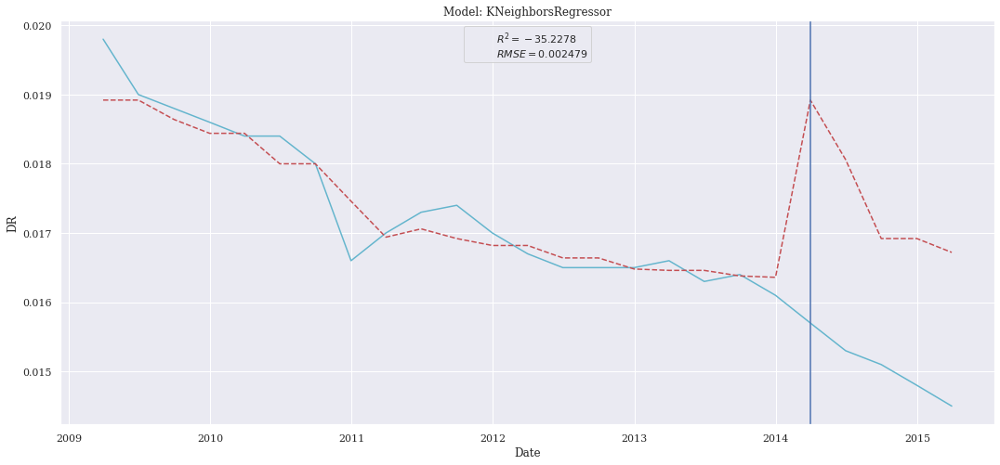

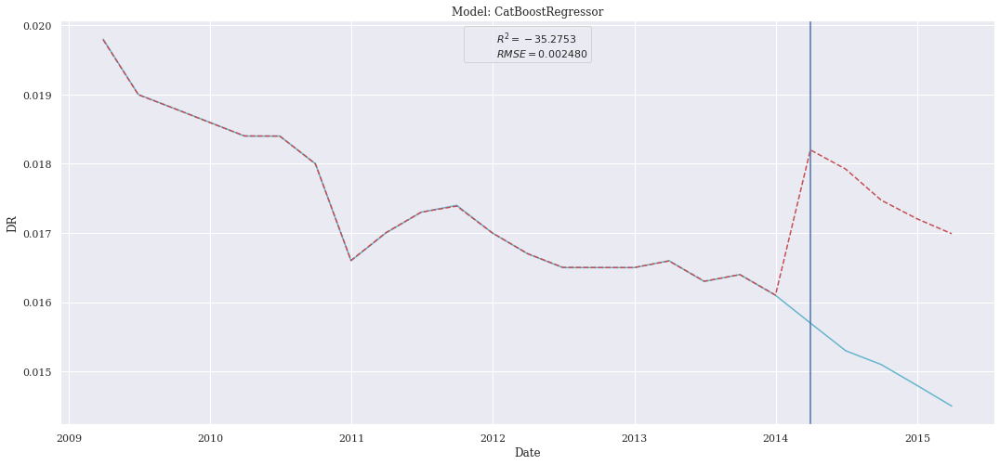

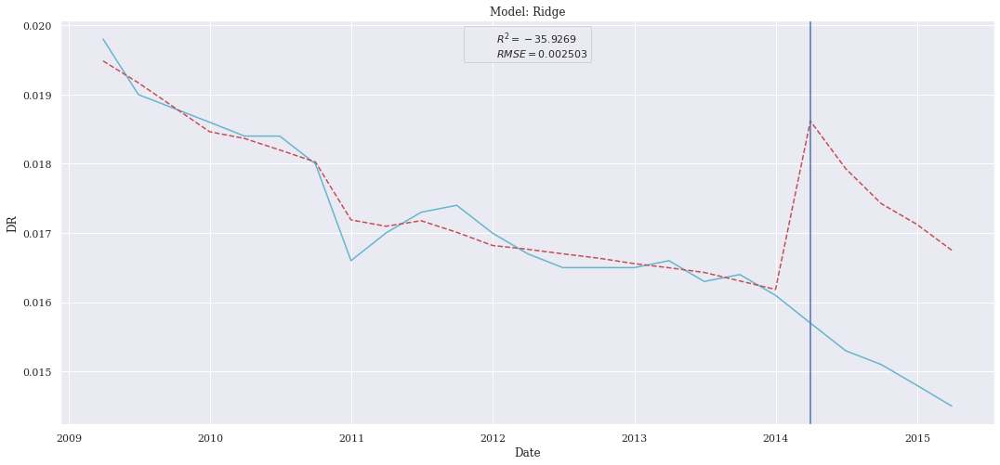

[14:47:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:47:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


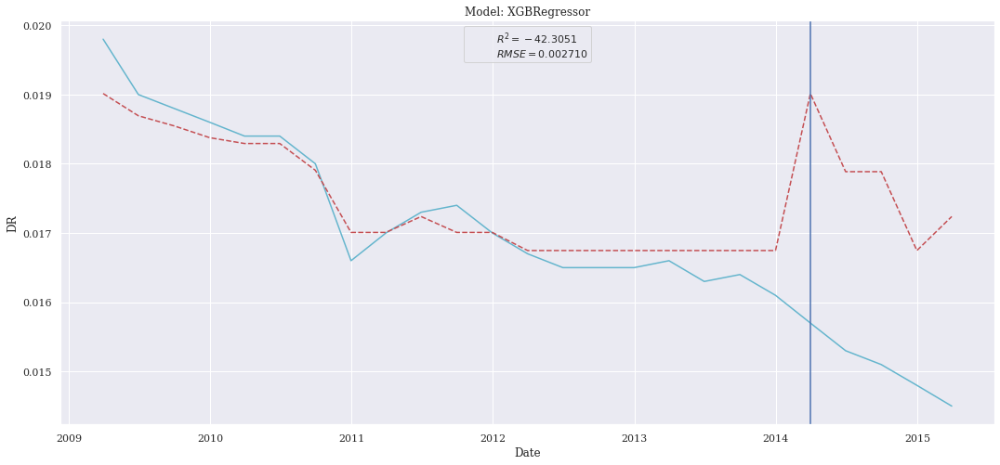

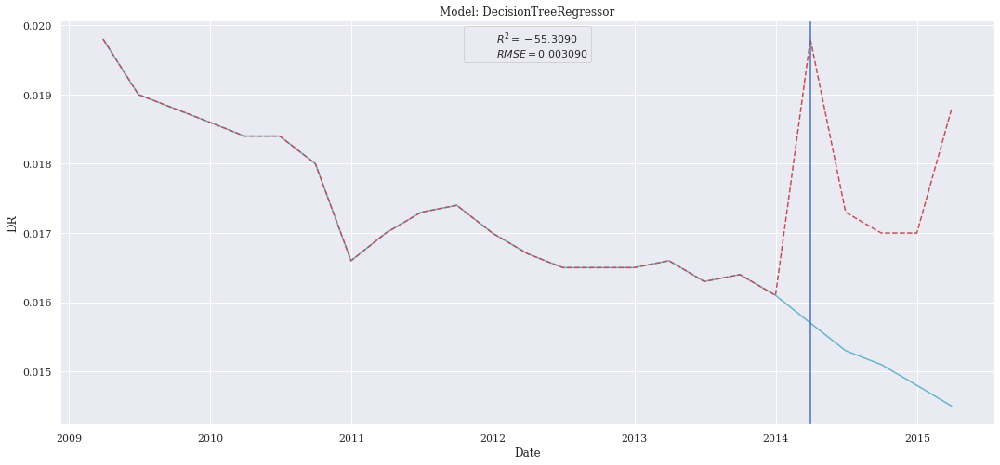

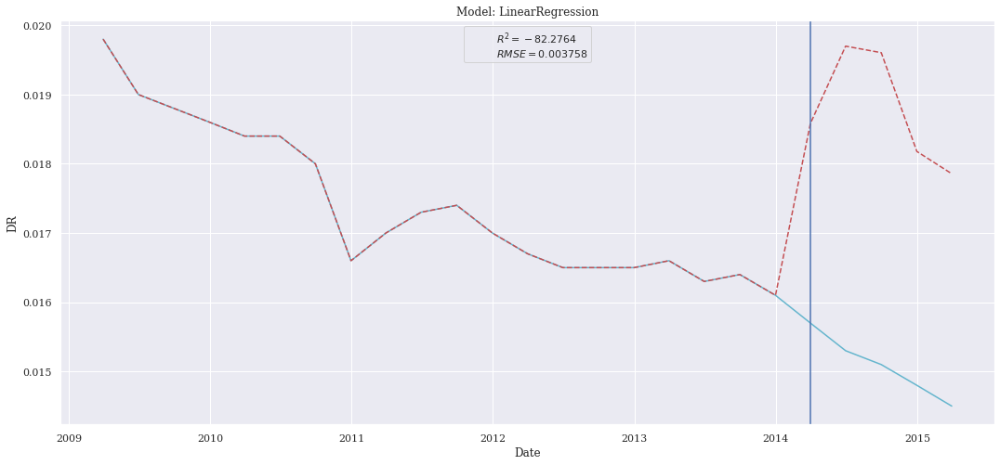

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


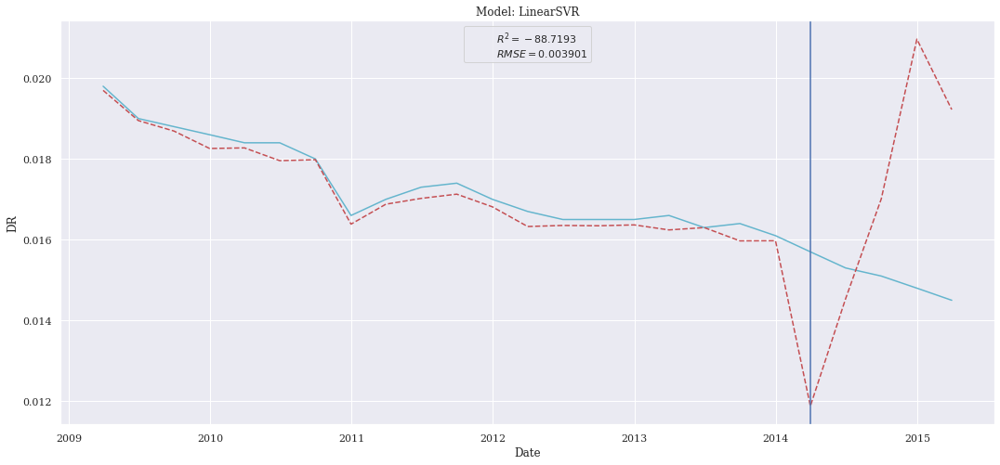

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:47:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001922,0.000004,0.001611,-20.790246
KNeighborsRegressor,0.002354,0.000006,0.002332,-31.674057
CatBoostRegressor,0.002598,0.000007,0.002582,-38.785177
XGBRegressor,0.002629,0.000007,0.002568,-39.756236
Ridge,0.002818,0.000008,0.002792,-45.833657
DecisionTreeRegressor,0.002896,0.000008,0.002720,-48.433962
LinearRegression,0.003561,0.000013,0.003494,-73.754251


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


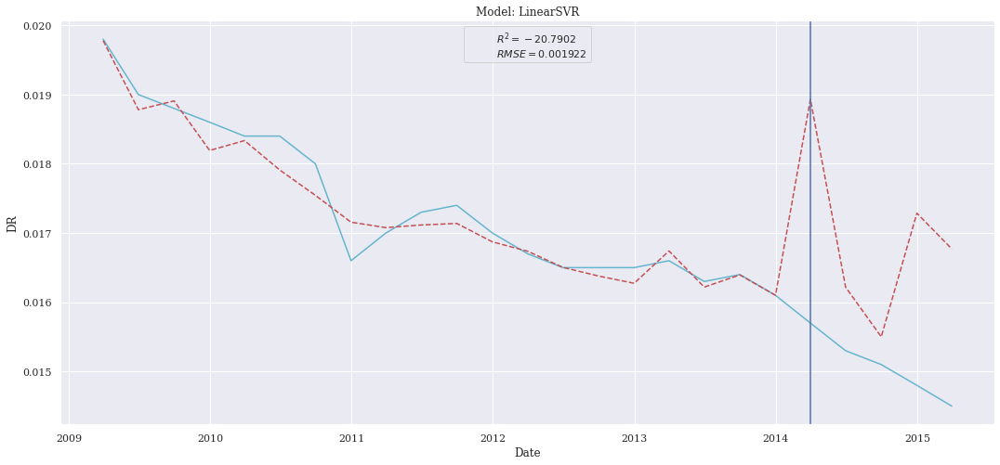

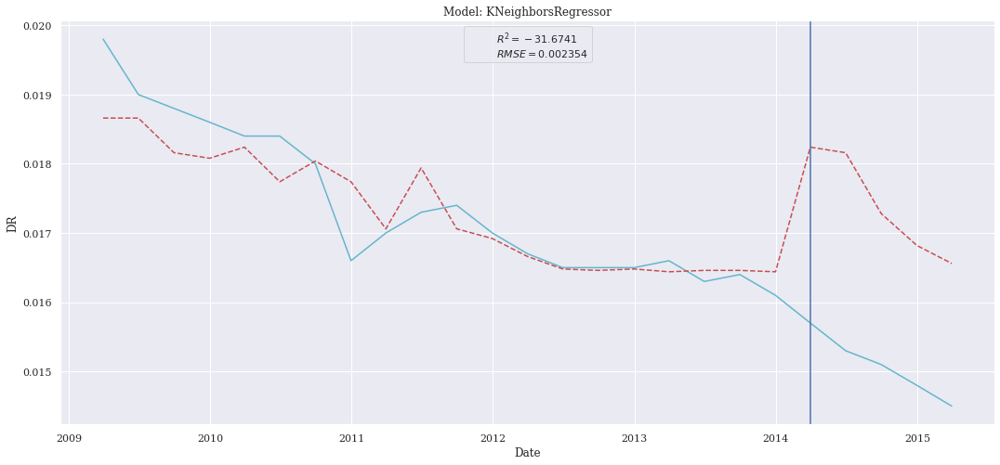

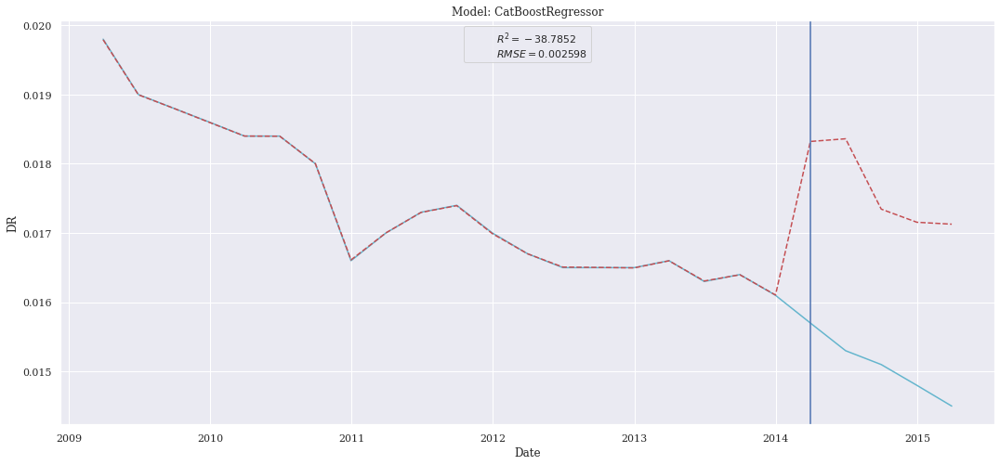

[14:47:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:47:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


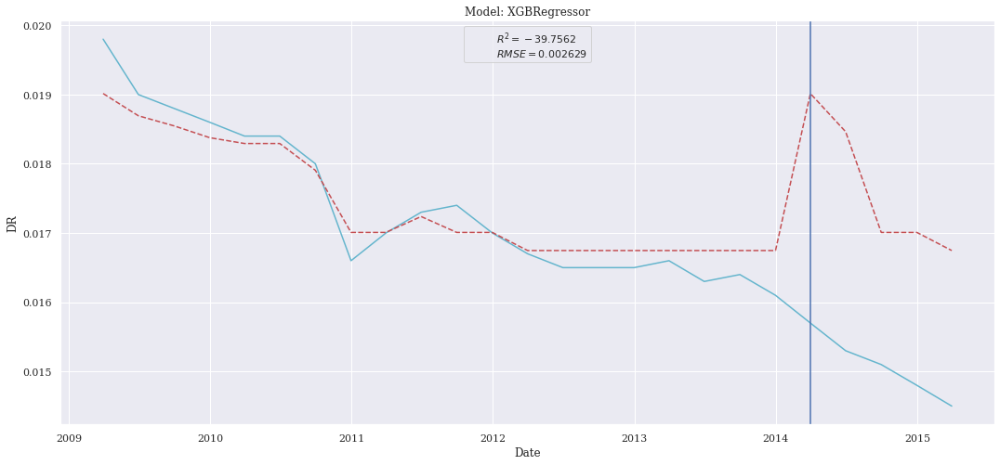

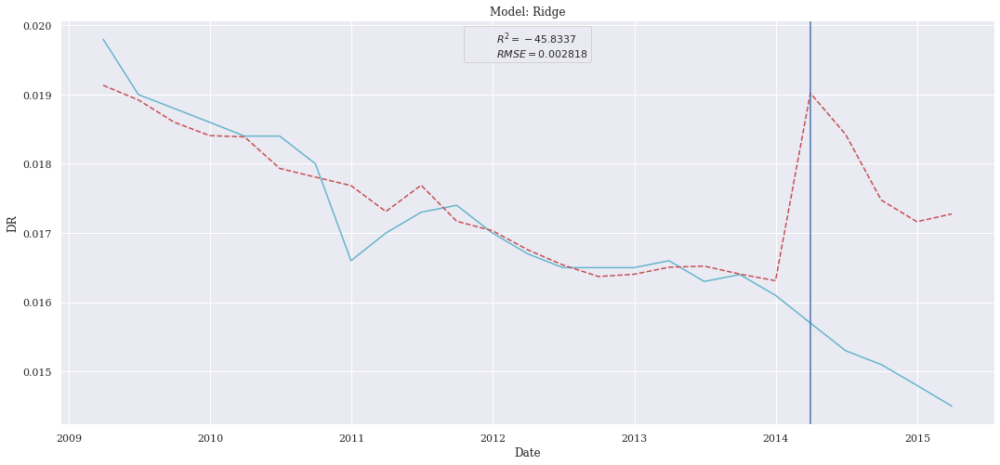

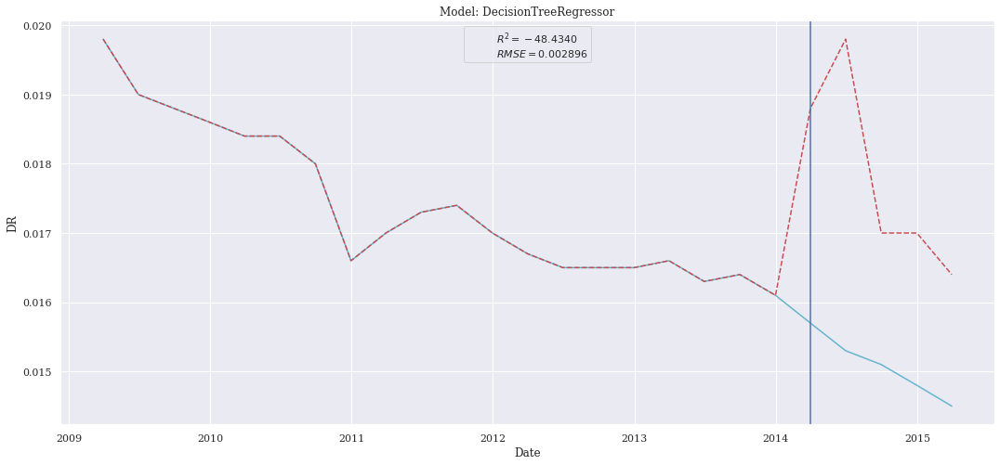

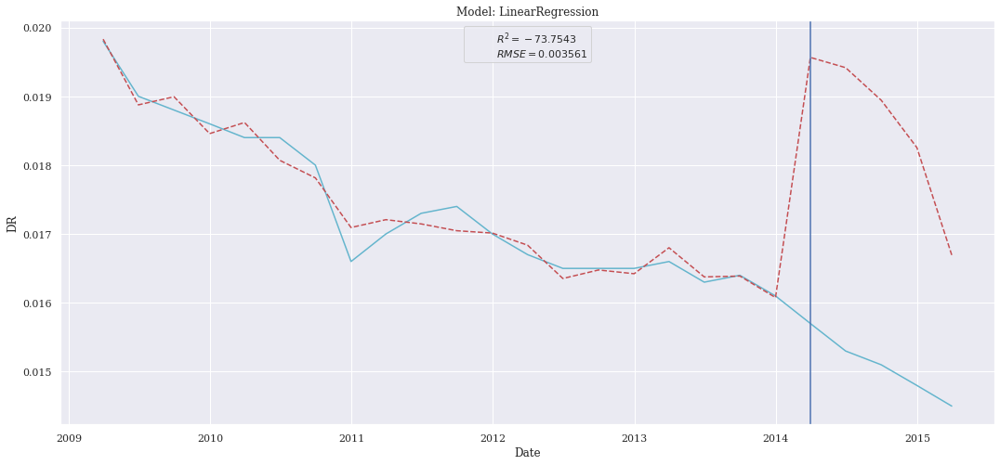

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:47:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.002280,0.000005,0.001650,-29.651166
KNeighborsRegressor,0.002366,0.000006,0.002316,-31.996698
CatBoostRegressor,0.002390,0.000006,0.002369,-32.690870
XGBRegressor,0.002611,0.000007,0.002533,-39.205808
Ridge,0.002654,0.000007,0.002555,-40.533190
DecisionTreeRegressor,0.003023,0.000009,0.002840,-52.867925
LinearSVR,0.003503,0.000012,0.002466,-71.333519


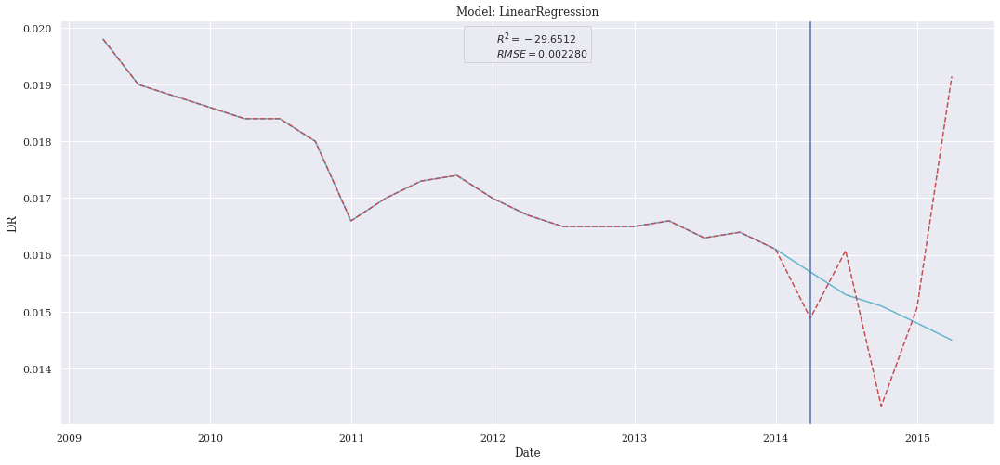

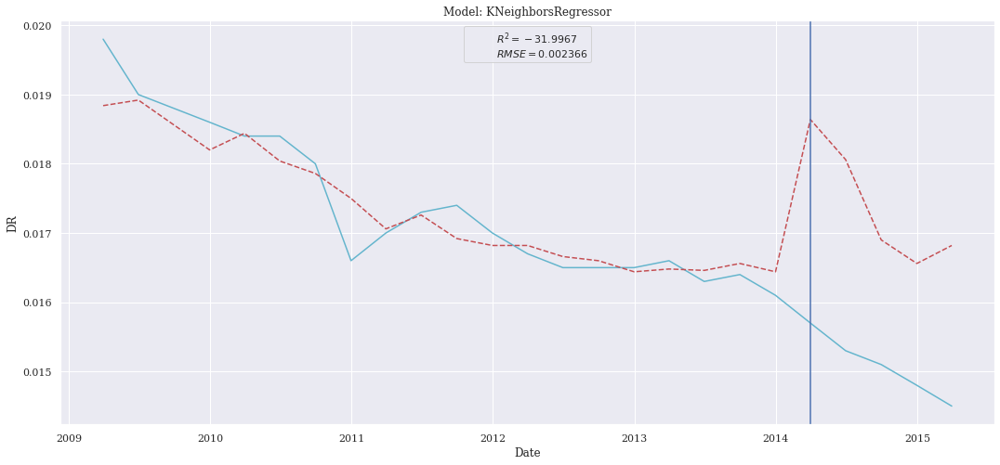

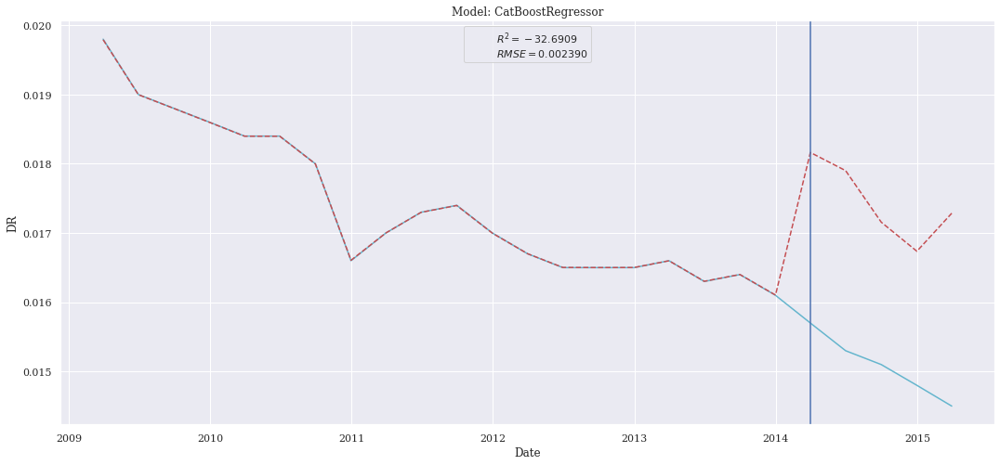

[14:47:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:47:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


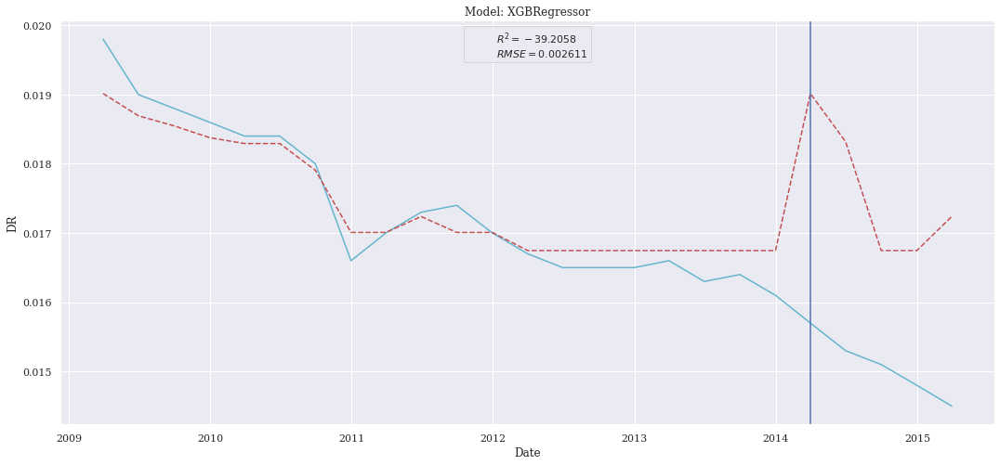

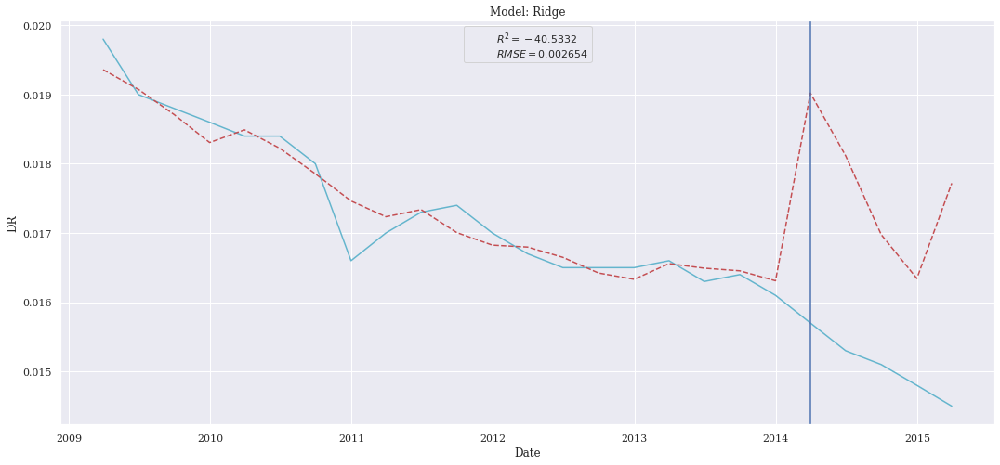

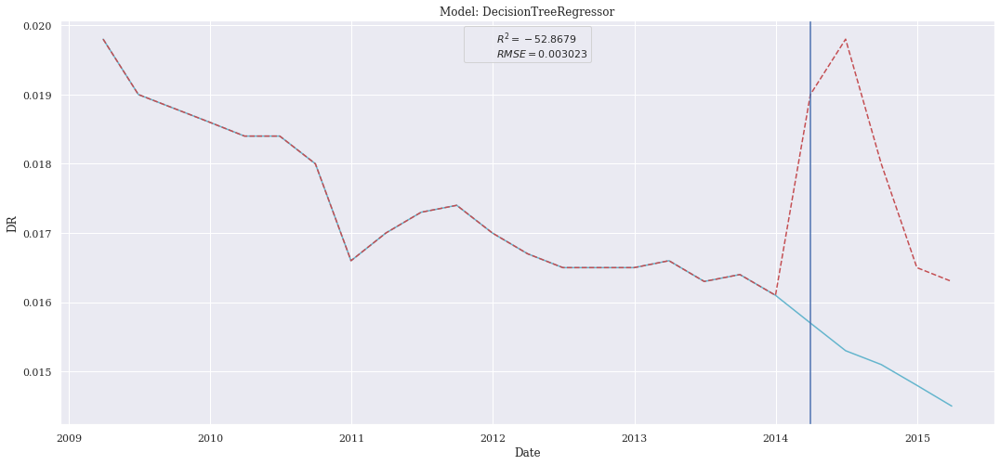

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


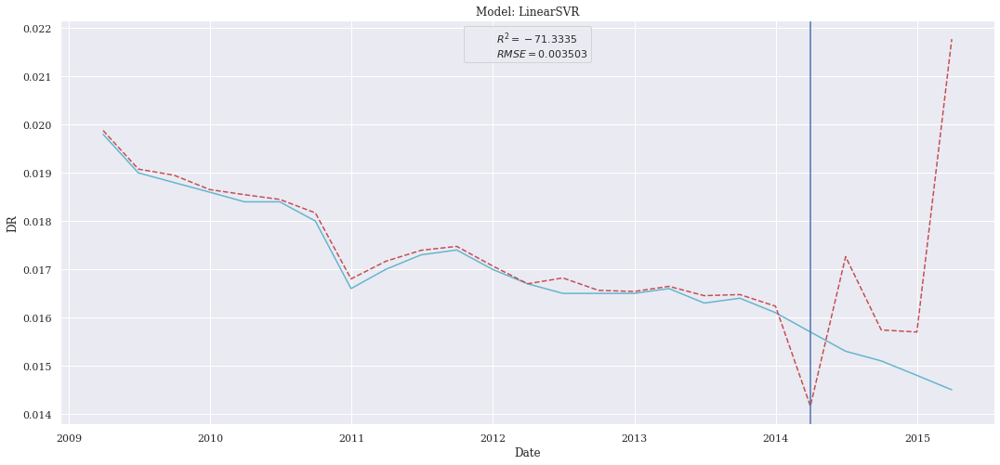

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

## First Conclusion
The SelectFromModel features and Recursive Features seems to give the most promising results. We will use the Knn, LinearSVR, and DecisionTree in order to design our solution.

### GridSearch on KNeighborsRegressor

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_sfm,split=split,norm=norm)
params_knr = {"n_neighbors":[1,2,3,4,5,6,7,8,9,10],"weights":["uniform"],"algorithm":["auto","ball_tree","kd_tree","brute"],"p":[1,2],"leaf_size":[1,2,3,4,5,10,20,30,40,50]}
params,score = params_grid(X_train,y_train,X_test,y_test,"knn",params_knr,metric="r2")
print(params,score)

Fitting 2 folds for each of 800 candidates, totalling 1600 fits
{'algorithm': 'auto', 'leaf_size': 1, 'n_neighbors': 1, 'p': 2, 'weights': 'uniform'} -21.075471698113088


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["knn"],parameters={"p_knn":params})
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.001935,0.000004,0.00188,-21.075472


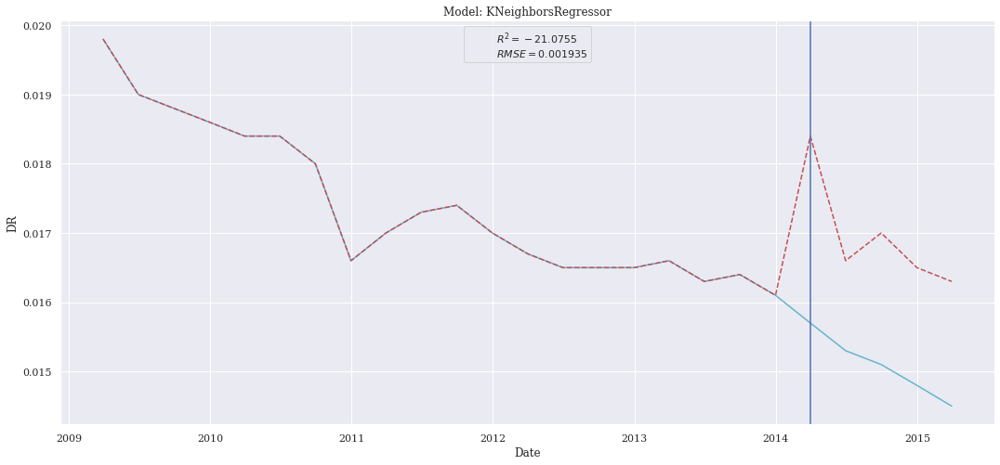

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on LinearSVR

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_sfm,split=split,norm=norm)
params_svr = {"epsilon":[0,0.1,0.2],"C":[1,0.7,0.3,0.1],"loss":["epsilon_insensitive","squared_epsilon_insensitive"],"intercept_scaling":[1,5,10,15]}
params,score = params_grid(X_train,y_train,X_test,y_test,"svr",params_svr,metric="r2")
print(params,score)

Fitting 2 folds for each of 96 candidates, totalling 192 fits


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number

{'C': 0.1, 'epsilon': 0, 'intercept_scaling': 15, 'loss': 'epsilon_insensitive'} -16.266772787877898


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["svr"],parameters={"p_svr":params})
summary

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001944,0.000004,0.001878,-21.279233


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


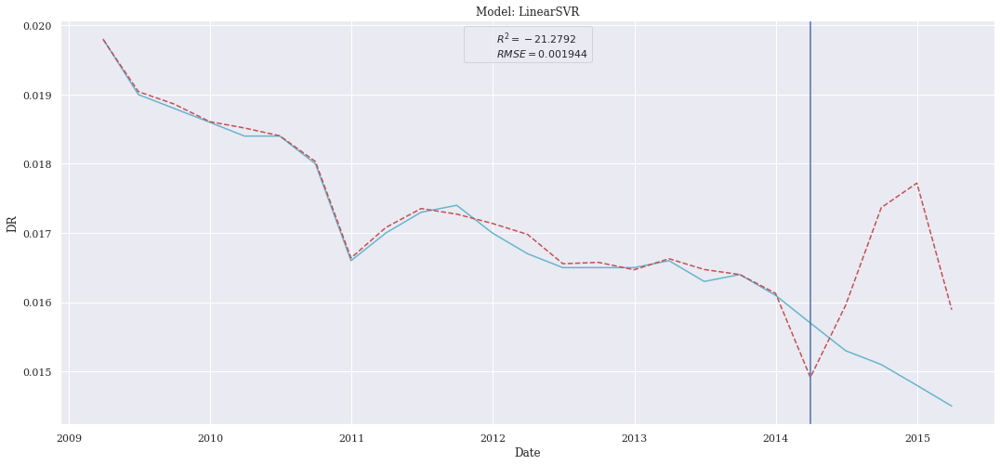

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on DecisionTree

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_recur,split=split,norm=norm)
params_tre = {"criterion":["squared_error","friedman_mse","absolute_error","poisson"],"splitter":["best"],"max_features":["auto","sqrt","log2"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"tre",parameters=params_tre,metric='r2')
print(params,score)

Fitting 2 folds for each of 12 candidates, totalling 24 fits
{'criterion': 'poisson', 'max_features': 'auto', 'splitter': 'best'} -12.573113207547093


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["tre"],parameters={"p_tre":params})
summary

,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001517,0.000002,0.00146,-12.573113


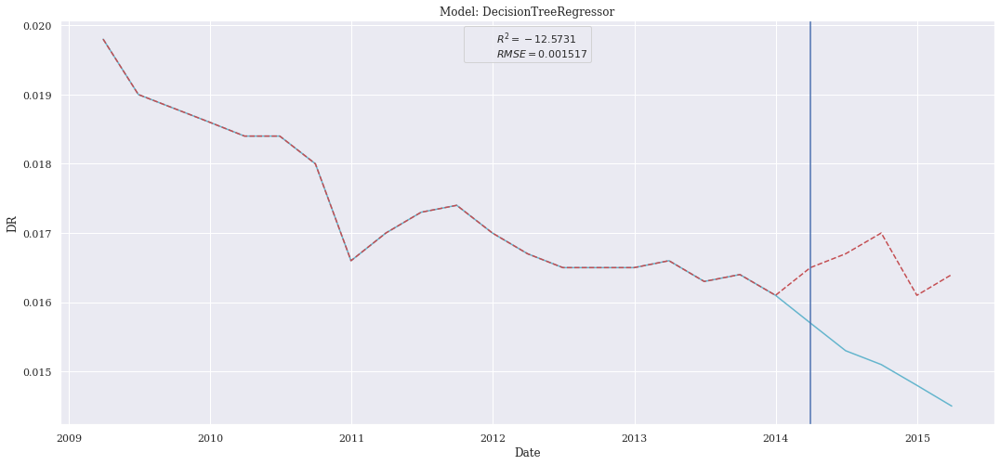

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the DecisionTree model but not for the others. With the Grid we obtain a r2 equals to -12.57 against 15.38 before GridSearch. Concerning the rmse is now 0.001517 against 0.001667.